# Sentinel-5P TROPOMI XCH₄ analysis over India

This notebook processes Sentinel-5P TROPOMI methane observations for India and prepares monthly grids, spatial patterns, trends, hotspot products, EDGAR comparison outputs, LULC context, IME screening, and publication-quality figure outputs.

The workflow is designed for the RD539 term paper on atmospheric methane over India.


## 1. Install packages

Install the Python libraries required for geospatial processing, statistics, plotting, and NetCDF handling.


In [5]:
%%capture
!pip install -q netCDF4 xarray h5netcdf geopandas shapely scipy scikit-learn matplotlib tqdm rasterio requests statsmodels pymannkendall libpysal esda mapclassify pyproj dbfread adjustText numba dbfread openpyxl


## 2. Imports and plotting settings

Import required libraries and set common plotting options.


In [6]:
import os, re, glob, gc, json, zipfile, math, warnings, datetime, tempfile, shutil
from pathlib import Path

import numpy as np
import pandas as pd
import netCDF4 as nc
import xarray as xr
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from rasterio.transform import from_bounds
from shapely.geometry import Point, box
from shapely.ops import unary_union
import requests

import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, Normalize, LogNorm, ListedColormap, BoundaryNorm
from matplotlib.ticker import MaxNLocator
import matplotlib.patheffects as pe

from tqdm.auto import tqdm
from scipy import stats
from scipy.ndimage import uniform_filter, maximum_filter, label, find_objects, binary_opening, binary_closing
from scipy.spatial import ConvexHull
from sklearn.cluster import DBSCAN
from statsmodels.stats.multitest import multipletests
import pymannkendall as mk

warnings.filterwarnings("ignore")

plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 400,
    "font.size": 11,
    "axes.titlesize": 13,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.titlesize": 15,
    "axes.linewidth": 0.8,
})

np.set_printoptions(suppress=True, precision=4)
CONNECTIVITY = np.ones((3, 3), dtype=np.int8)  # 8-neighbour spatial connectivity

## 3. Mount Drive and set paths

Mount Google Drive and define input/output folders. Edit this section only if the folder structure changes.


In [7]:
try:
    from google.colab import drive
    drive.mount("/content/drive", force_remount=False)
except Exception as e:
    print("Not running in Colab or Drive already mounted:", e)

# ---------------------------------------------------------------------
# USER PATHS — MATCHING YOUR EXISTING GOOGLE DRIVE STRUCTURE
# ---------------------------------------------------------------------
# Main methane project folder
PROJECT_DIR = "/content/drive/MyDrive/India_GHG_Research"

# Your original notebook paths
S5P_DIR      = "/content/drive/MyDrive/India_GHG_Research/S5P_CH4_India"
INDIA_SHP    = "/content/drive/MyDrive/roi/India_International_Boundary.shp"   # roi is separate from India_GHG_Research
STATE_SHP    = "/content/drive/MyDrive/roi/India_States.shp"                    # optional; edit if your state boundary has another name
ERA5_DIR     = "/content/drive/MyDrive/India_GHG_Research/ERA5_India_Data"       # optional; used only by optional daily/wind steps
EDGAR_DIR    = "/content/drive/MyDrive/India_GHG_Research/EDGAR - CO2 and CH4 Fluxes and Emissions (2014 to 2024)"  # optional
GTOPO30_PATH = "/content/drive/MyDrive/India_GHG_Research/gt30e060n40.tif"        # optional DEM from your original notebook
DEM_PATH     = GTOPO30_PATH                                                       # internal name used by this notebook

# Context layers requested for v16
STATE_HQ_SHP    = "/content/drive/MyDrive/roi/STATE_HQ.shp"
MAJOR_TOWNS_SHP = "/content/drive/MyDrive/roi/MAJOR_TOWNS.shp"
DISTRICT_HQ_SHP = "/content/drive/MyDrive/roi/DISTRICT_HQ.shp"
LULC_DIR        = "/content/drive/MyDrive/India_GHG_Research/LULC_250K_1718"
LULC_RASTER     = "/content/drive/MyDrive/India_GHG_Research/LULC_250K_1718/lulc250k_1718.tif"

# Publication workflow outputs. Kept outside India_GHG_Research, as in your earlier output style.
OUT_BASE     = "/content/drive/MyDrive/Final---S5P_CH4_India_v16_EDGAR_LULC_Punjab"
OUT_MONTHLY  = f"{OUT_BASE}/monthly_grids"
OUT_TABLES   = f"{OUT_BASE}/tables"
OUT_FIGS     = f"{OUT_BASE}/figures"
OUT_DAILY    = f"{OUT_BASE}/daily_candidates"

# Existing monthly-grid folders to reuse if they already exist.
# This avoids reprocessing all Sentinel-5P files when v14/v15/v16 monthly grids are already available.
PREVIOUS_MONTHLY_GRID_DIRS = [
    "/content/drive/MyDrive/ChatGPTPlus---S5P_CH4_India_final_v16_EDGAR_LULC_Punjab/monthly_grids",
]
for d in [OUT_BASE, OUT_MONTHLY, OUT_TABLES, OUT_FIGS, OUT_DAILY]:
    os.makedirs(d, exist_ok=True)

# Quick path check. Missing optional files do not stop the notebook.
def check_path(path, label, required=False):
    ok = os.path.exists(path)
    status = "✅ FOUND" if ok else ("❌ MISSING" if required else "⚠️ optional missing")
    print(f"{status:18s} | {label:18s} | {path}")
    if required and not ok:
        raise FileNotFoundError(f"Required path not found: {label} -> {path}")
    return ok

check_path(S5P_DIR, "S5P_DIR", required=True)
check_path(INDIA_SHP, "INDIA_SHP", required=False)
check_path(STATE_SHP, "STATE_SHP", required=False)
check_path(ERA5_DIR, "ERA5_DIR", required=False)
check_path(EDGAR_DIR, "EDGAR_DIR", required=False)
check_path(DEM_PATH, "DEM_PATH", required=False)
check_path(STATE_HQ_SHP, "STATE_HQ_SHP", required=False)
check_path(MAJOR_TOWNS_SHP, "MAJOR_TOWNS_SHP", required=False)
check_path(DISTRICT_HQ_SHP, "DISTRICT_HQ_SHP", required=False)
check_path(LULC_DIR, "LULC_DIR", required=False)
check_path(LULC_RASTER, "LULC_RASTER", required=False)

# ---------------------------------------------------------------------
# STUDY DOMAIN AND GRID
# ---------------------------------------------------------------------
LAT_MIN, LAT_MAX = 6.0, 38.0
LON_MIN, LON_MAX = 67.0, 98.0
GRID_RES = 0.10  # degrees; monthly persistent-region studies commonly use 0.1° grids

# Time span matching your existing dataset/notebook. Leave YEAR_END=None to auto-detect.
YEAR_START = 2019
YEAR_END   = 2025

# Months to skip in hotspot workflow only.
# For final paper, keep all months for spatial pattern/trend analysis; use sensitivity tests for dry-season hotspots.
SKIP_MONTHS_FOR_HOTSPOTS = []       # final moderate run uses all months; coverage limitations are handled in summaries
DRY_SEASON_MONTHS = [1,2,3,4,5,10,11,12]

# TROPOMI quality and monthly-grid requirements
QA_MIN = 0.50
MIN_VALID_DAYS_MONTH = 3  # moderate setting; literature-strict sensitivity can be rerun with 4
MIN_OBS_MONTH_CELL = 3

# Local anomaly / persistent enhancement settings
HPFA_DEG_LIST = [1, 2, 3, 4, 5]     # multi-window local background; robust but not too restrictive
HPFA_MIN_COVERAGE = 0.25
Z_THRESH = 2.5      # moderate; v13 strict used 2.5
MIN_ANOMALY_PPB = 10.0  # moderate; v13 strict used 15 ppb
MIN_CLUSTER_CELLS = 2
MAX_CLUSTER_AREA_KM2 = 50000
PERSISTENCE_FENH_MIN = 0.35
PERSISTENCE_MIN_MONTHS = 3
PERSISTENCE_NEIGHBOR_SIZE = 3

# Trend settings
MIN_MONTHS_FOR_TREND = 36
FDR_ALPHA = 0.05

# Optional terrain handling. If DEM is unavailable, the workflow still runs.
APPLY_ELEVATION_CORRECTION = True
ELEVATION_CORR_PPB_PER_KM = 8.5
MAX_ELEVATION_M = 4000
MAX_LOCAL_ROUGHNESS_M = 300

# Use this for quick test. Set PROCESS_ALL_MONTHS=True for final results.
PROCESS_ALL_MONTHS = True

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ FOUND            | S5P_DIR            | /content/drive/MyDrive/India_GHG_Research/S5P_CH4_India
✅ FOUND            | INDIA_SHP          | /content/drive/MyDrive/roi/India_International_Boundary.shp
✅ FOUND            | STATE_SHP          | /content/drive/MyDrive/roi/India_States.shp
✅ FOUND            | ERA5_DIR           | /content/drive/MyDrive/India_GHG_Research/ERA5_India_Data
✅ FOUND            | EDGAR_DIR          | /content/drive/MyDrive/India_GHG_Research/EDGAR - CO2 and CH4 Fluxes and Emissions (2014 to 2024)
✅ FOUND            | DEM_PATH           | /content/drive/MyDrive/India_GHG_Research/gt30e060n40.tif
✅ FOUND            | STATE_HQ_SHP       | /content/drive/MyDrive/roi/STATE_HQ.shp
✅ FOUND            | MAJOR_TOWNS_SHP    | /content/drive/MyDrive/roi/MAJOR_TOWNS.shp
✅ FOUND            | DISTRICT_HQ_SHP    | /content/drive/MyDrive/roi/DISTRICT_

## 4. Methodological choices

This workflow uses monthly 0.1° grids, quality-filtered TROPOMI XCH₄, local-background anomalies, and moderate hotspot thresholds. These choices reduce noise while keeping intermittent methane enhancements visible.


## 4A. Scientific checks in this version

This version applies quality filtering, local-background anomaly detection, valid-day filtering, threshold sensitivity checks, EDGAR comparison, and IME-style screening.


## 5. Grid, area, boundary, and mask

Create the analysis grid, calculate grid-cell area, load India boundaries, and prepare the India mask.


In [8]:
def download_file(url, out_path, timeout=120):
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    r = requests.get(url, stream=True, timeout=timeout)
    r.raise_for_status()
    with open(out_path, "wb") as f:
        for chunk in r.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)
    return str(out_path)

lat_edges = np.arange(LAT_MIN, LAT_MAX + GRID_RES + 1e-9, GRID_RES)
lon_edges = np.arange(LON_MIN, LON_MAX + GRID_RES + 1e-9, GRID_RES)
lat_centers = (lat_edges[:-1] + lat_edges[1:]) / 2
lon_centers = (lon_edges[:-1] + lon_edges[1:]) / 2
nLat, nLon = len(lat_centers), len(lon_centers)
LON2D, LAT2D = np.meshgrid(lon_centers, lat_centers)

# Accurate cell area varying with latitude
R = 6371008.8
lat1 = np.radians(lat_edges[:-1])
lat2 = np.radians(lat_edges[1:])
lon_width = np.radians(GRID_RES)
row_area = (R**2) * lon_width * (np.sin(lat2) - np.sin(lat1))
AREA_M2 = np.repeat(row_area[:, None], nLon, axis=1)
AREA_KM2 = AREA_M2 / 1e6

print(f"Grid: {nLat} rows × {nLon} columns = {nLat*nLon:,} cells")
print(f"Area range per cell: {np.nanmin(AREA_KM2):.1f}–{np.nanmax(AREA_KM2):.1f} km²")

# Load India boundary; fallback to Natural Earth countries
if os.path.exists(INDIA_SHP):
    india_gdf = gpd.read_file(INDIA_SHP).to_crs("EPSG:4326")
    print("Loaded user India boundary:", INDIA_SHP)
else:
    print("India shapefile not found. Downloading Natural Earth Admin 0 as fallback.")
    ne_zip = f"{OUT_BASE}/naturalearth_admin0.zip"
    if not os.path.exists(ne_zip):
        url = "https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_countries.zip"
        download_file(url, ne_zip)
    ne_dir = f"{OUT_BASE}/naturalearth_admin0"
    os.makedirs(ne_dir, exist_ok=True)
    with zipfile.ZipFile(ne_zip) as z:
        z.extractall(ne_dir)
    shp = glob.glob(f"{ne_dir}/*.shp")[0]
    world = gpd.read_file(shp).to_crs("EPSG:4326")
    india_gdf = world[(world["ADMIN"].str.contains("India", case=False, na=False)) | (world["SOVEREIGNT"].str.contains("India", case=False, na=False))]

india_geom = india_gdf.unary_union
transform = from_bounds(LON_MIN, LAT_MIN, LON_MAX, LAT_MAX, nLon, nLat)
# rasterize uses row 0 at north; our arrays row 0 is south, so rasterize then flip vertically
mask_north_up = rasterize([(india_geom, 1)], out_shape=(nLat, nLon), transform=transform, fill=0, dtype="uint8")
INDIA_MASK = np.flipud(mask_north_up).astype(bool)
INDIA_AREA_KM2 = float(np.nansum(np.where(INDIA_MASK, AREA_KM2, np.nan)))
print(f"India analysis-mask cells: {INDIA_MASK.sum():,}; area ≈ {INDIA_AREA_KM2/1e6:.2f} million km²")

# Optional state boundary
HAS_STATES = False
if os.path.exists(STATE_SHP):
    try:
        states_gdf = gpd.read_file(STATE_SHP).to_crs("EPSG:4326")
        HAS_STATES = True
        print("Loaded state boundary:", STATE_SHP)
    except Exception as e:
        print("Could not read state shapefile:", e)
else:
    states_gdf = None

Grid: 321 rows × 311 columns = 99,831 cells
Area range per cell: 97.4–123.0 km²
Loaded user India boundary: /content/drive/MyDrive/roi/India_International_Boundary.shp
India analysis-mask cells: 29,238; area ≈ 3.30 million km²
Loaded state boundary: /content/drive/MyDrive/roi/India_States.shp


In [9]:

# ---------------------------------------------------------------------
# v16 contextual layers: Survey of India towns/HQs and ISRO/Bhuvan LULC
# ---------------------------------------------------------------------
from rasterio.warp import reproject, Resampling
try:
    from adjustText import adjust_text
    HAS_ADJUST_TEXT = True
except Exception:
    HAS_ADJUST_TEXT = False

POINT_LAYERS = {}
LULC_MODE_GRID = None
LULC_META_DF = pd.DataFrame()
LULC_CATEGORY_GRID = None
LULC_CROPLAND_MASK = None
LULC_BUILTUP_MASK = None
LULC_WETLAND_WATER_MASK = None
HAS_LULC = False
HAS_POINTS = False

# ISRO/Bhuvan LULC 250K 2017–18 class table visible in the raster attribute table.
# Codes 1–24 are the valid classes; code 0 and the blank class 25 are treated as no-data/unclassified.
LULC_KNOWN_LABELS = {
    0: "No data / unclassified",
    1: "Urban", 2: "Rural", 3: "Mining", 4: "Crop land", 5: "Plantation", 6: "Fallow",
    7: "Current shifting cultivation", 8: "Evergreen / semi-evergreen forest", 9: "Deciduous forest",
    10: "Forest plantation", 11: "Scrub forest", 12: "Swamp / marsh", 13: "Grass / grazing",
    14: "Salt affected land", 15: "Gullied / ravinous land", 16: "Scrub land", 17: "Sandy area",
    18: "Barren rocky", 19: "Rann", 20: "Inland wetland", 21: "Coastal wetland",
    22: "River / stream / canal", 23: "Water bodies", 24: "Snow and glacier", 25: "No data / unclassified"
}
LULC_VALID_CODES = list(range(1, 25))
LULC_NODATA_CODES = [0, 25]

# Grouped classes used only for cross-tabs and interpretation. The publication map below also plots all 24 classes.
LULC_CATEGORY_RULES = {
    "settlement_mining": [1, 2, 3],
    "cropland_plantation_fallow": [4, 5, 6, 7],
    "forest_scrub": [8, 9, 10, 11, 16],
    "wetland_water": [12, 20, 21, 22, 23],
    "grass_grazing": [13],
    "barren_degraded": [14, 15, 17, 18, 19],
    "snow_glacier": [24],
}
LULC_CATEGORY_ORDER = ["cropland_plantation_fallow", "settlement_mining", "wetland_water", "forest_scrub", "grass_grazing", "barren_degraded", "snow_glacier", "other"]
LULC_CATEGORY_LABELS = {
    "cropland_plantation_fallow": "Cropland/plantation/fallow",
    "settlement_mining": "Settlement/mining",
    "wetland_water": "Wetland/water",
    "forest_scrub": "Forest/scrub",
    "grass_grazing": "Grass/grazing",
    "barren_degraded": "Barren/degraded",
    "snow_glacier": "Snow/glacier",
    "other": "Other mapped LULC"
}
LULC_CROPLAND_CODES = [4, 5, 6, 7]
LULC_BUILTUP_CODES = [1, 2, 3]
LULC_WETLAND_WATER_CODES = [12, 20, 21, 22, 23]

def guess_name_column(gdf, layer_type=None):
    """Choose a clean label column for Survey of India point layers."""
    preferred = {
        "state_hq": ["CAPITAL_NA", "capital_na", "CAPITAL", "NAME", "NAME_OF_ST", "STATE"],
        "district_hq": ["HQ", "TOWN", "DISTRICT", "district", "NAME", "name"],
        "major_town": ["name_of_to", "NAME_OF_TO", "TOWN", "town", "NAME", "name"],
    }
    candidates = preferred.get(layer_type, []) + [
        "CAPITAL_NA", "HQ", "TOWN", "name_of_to", "NAME", "Name", "name", "TOWN_NAME", "DIST_NAME",
        "DISTRICT", "District", "STATE", "state", "STNAME", "CITY_NAME"
    ]
    for c in candidates:
        if c in gdf.columns:
            return c
    object_cols = [c for c in gdf.columns if gdf[c].dtype == object and c.lower() != "geometry"]
    return object_cols[0] if object_cols else None


def load_point_layer(path, layer_type):
    if not os.path.exists(path):
        return gpd.GeoDataFrame(columns=["label", "layer_type", "lon", "lat", "geometry"], geometry="geometry", crs="EPSG:4326")
    try:
        g = gpd.read_file(path).to_crs("EPSG:4326")
        g = g[g.geometry.notna() & ~g.geometry.is_empty].copy()
        if not all(g.geometry.geom_type.isin(["Point", "MultiPoint"])):
            g["geometry"] = g.geometry.representative_point()
        name_col = guess_name_column(g, layer_type)
        g["label"] = g[name_col].astype(str).str.strip() if name_col else layer_type
        g["label"] = g["label"].replace({"nan": layer_type, "None": layer_type, "": layer_type})
        g["layer_type"] = layer_type
        g["lon"] = g.geometry.x; g["lat"] = g.geometry.y
        g = g.cx[LON_MIN:LON_MAX, LAT_MIN:LAT_MAX]
        try:
            g = g[g.within(india_geom.buffer(0.05))].copy()
        except Exception:
            pass
        g["_lonr"] = g["lon"].round(3); g["_latr"] = g["lat"].round(3)
        g = g.drop_duplicates(subset=["label", "layer_type", "_lonr", "_latr"]).drop(columns=["_lonr", "_latr"])
        print(f"Loaded {layer_type}: {len(g)} point(s) | label column: {name_col} | {os.path.basename(path)}")
        return g[["label", "layer_type", "lon", "lat", "geometry"]]
    except Exception as e:
        print(f"Could not read {layer_type} layer {path}: {e}")
        return gpd.GeoDataFrame(columns=["label", "layer_type", "lon", "lat", "geometry"], geometry="geometry", crs="EPSG:4326")


def load_all_point_layers():
    global POINT_LAYERS, HAS_POINTS
    POINT_LAYERS = {
        "state_hq": load_point_layer(STATE_HQ_SHP, "state_hq"),
        "district_hq": load_point_layer(DISTRICT_HQ_SHP, "district_hq"),
        "major_town": load_point_layer(MAJOR_TOWNS_SHP, "major_town"),
    }
    HAS_POINTS = any(len(g) for g in POINT_LAYERS.values())
    return POINT_LAYERS

POINT_LAYERS = load_all_point_layers()


def sample_grid_at_points(gdf, arr):
    if gdf is None or len(gdf) == 0:
        return np.array([], dtype=float)
    ii = np.floor((gdf["lat"].values - LAT_MIN) / GRID_RES).astype(int)
    jj = np.floor((gdf["lon"].values - LON_MIN) / GRID_RES).astype(int)
    ok = (ii >= 0) & (ii < nLat) & (jj >= 0) & (jj < nLon)
    vals = np.full(len(gdf), np.nan, dtype=float)
    vals[ok] = arr[ii[ok], jj[ok]]
    return vals


def context_points_for_mask(mask_arr=None, value_arr=None, value_percentile=95, max_major_towns=25, max_district_hq=25, max_state_hq=12, include_state_hq=True, buffer_cells=8):
    """Return decluttered context points. State HQs are restricted to the hotspot/high-value neighbourhood."""
    if not HAS_POINTS:
        return gpd.GeoDataFrame(columns=["label", "layer_type", "geometry"], geometry="geometry", crs="EPSG:4326")
    criterion = None
    if mask_arr is not None:
        criterion = mask_arr.astype(bool)
    elif value_arr is not None:
        vals = value_arr[INDIA_MASK & np.isfinite(value_arr)]
        if vals.size:
            criterion = INDIA_MASK & (value_arr >= np.nanpercentile(vals, value_percentile))
    if criterion is not None and buffer_cells and buffer_cells > 0:
        criterion_for_points = maximum_filter(criterion.astype(np.uint8), size=2 * buffer_cells + 1) > 0
    else:
        criterion_for_points = criterion

    frames = []
    for key, maxn in [("state_hq", max_state_hq), ("district_hq", max_district_hq), ("major_town", max_major_towns)]:
        if key == "state_hq" and not include_state_hq:
            continue
        g = POINT_LAYERS.get(key)
        if g is None or len(g) == 0:
            continue
        sub = g.copy()
        if criterion_for_points is not None:
            vals = sample_grid_at_points(sub, criterion_for_points.astype(float))
            sub = sub[vals > 0].copy()
        if value_arr is not None and len(sub):
            sub["context_value"] = sample_grid_at_points(sub, value_arr)
            sub = sub.sort_values("context_value", ascending=False)
        sub = sub.head(maxn)
        if len(sub):
            frames.append(sub)
    if not frames:
        return gpd.GeoDataFrame(columns=["label", "layer_type", "geometry"], geometry="geometry", crs="EPSG:4326")
    out = pd.concat(frames, ignore_index=True)
    return gpd.GeoDataFrame(out, geometry="geometry", crs="EPSG:4326")


def _greedy_declutter(gdf, max_labels=20, min_sep_deg=0.55):
    if len(gdf) == 0:
        return gdf
    g = gdf.copy()
    if "context_value" in g.columns:
        g = g.sort_values(["layer_type", "context_value"], ascending=[True, False])
    else:
        g = g.sort_values("layer_type")
    keep = []
    coords = []
    for idx, r in g.iterrows():
        x, y = float(r.geometry.x), float(r.geometry.y)
        if all(((x-x0)**2 + (y-y0)**2)**0.5 >= min_sep_deg for x0, y0 in coords):
            keep.append(idx); coords.append((x, y))
        if len(keep) >= max_labels:
            break
    return g.loc[keep]


def plot_context_points(ax, points_gdf, label_limit=18, fontsize=6.2, label_state_hq=False, min_label_sep_deg=0.55, legend=True):
    if points_gdf is None or len(points_gdf) == 0:
        return
    markers = {"state_hq": "*", "district_hq": "o", "major_town": "^"}
    sizes = {"state_hq": 40, "district_hq": 14, "major_town": 12}
    names = {"state_hq": "state HQ", "district_hq": "district HQ", "major_town": "major town"}
    for lt, sub in points_gdf.groupby("layer_type"):
        ax.scatter(sub.geometry.x, sub.geometry.y, s=sizes.get(lt, 14), marker=markers.get(lt, "o"),
                   facecolor="white", edgecolor="black", linewidth=0.45, alpha=0.88, zorder=6, label=names.get(lt, lt))
    lab = points_gdf.copy()
    if not label_state_hq:
        lab = lab[lab.layer_type != "state_hq"]
    lab = _greedy_declutter(lab, max_labels=label_limit, min_sep_deg=min_label_sep_deg)
    texts = []
    for _, r in lab.iterrows():
        txt = ax.text(r.geometry.x + 0.07, r.geometry.y + 0.05, str(r.label).title()[:24], fontsize=fontsize,
                      color="black", zorder=7, clip_on=True,
                      path_effects=[pe.withStroke(linewidth=2.4, foreground="white")])
        texts.append(txt)
    if HAS_ADJUST_TEXT and texts:
        try:
            adjust_text(texts, ax=ax, expand_points=(1.05, 1.10), expand_text=(1.05, 1.10),
                        arrowprops=dict(arrowstyle='-', color='0.35', lw=0.35, alpha=0.6), force_text=0.2)
        except Exception:
            pass
    if legend:
        ax.legend(loc="lower left", fontsize=7.5, frameon=True, framealpha=0.9, ncol=1)


def read_lulc_attribute_table(tif_path):
    records = []
    base = tif_path
    candidates = [base + ".vat.dbf", base.replace(".tif", ".tif.vat.dbf"), base.replace(".tif", ".vat.dbf"), base.replace(".tif", ".dbf")]
    try:
        from dbfread import DBF
        for dbf in candidates:
            if os.path.exists(dbf):
                for rec in DBF(dbf, load=True, ignore_missing_memofile=True):
                    records.append(dict(rec))
                print("Read LULC raster attribute table:", dbf)
                break
    except Exception as e:
        print("Could not read LULC VAT DBF:", e)
    if not records:
        df = pd.DataFrame({"code": list(LULC_KNOWN_LABELS.keys()), "label": list(LULC_KNOWN_LABELS.values())})
        return df
    df = pd.DataFrame(records)
    code_col = next((c for c in df.columns if c.lower() in ["value", "gridcode", "grid_code", "lulcwebcod", "class", "code"]), None)
    label_col = next((c for c in df.columns if c.lower() in ["descriptio", "description", "longdesc", "label", "class_name", "name"] and c != code_col), None)
    if code_col is not None:
        df["code"] = pd.to_numeric(df[code_col], errors="coerce").astype("Int64")
    if label_col is not None:
        df["label"] = df[label_col].astype(str)
    else:
        df["label"] = df["code"].map(LULC_KNOWN_LABELS).fillna(df["code"].astype(str))
    # Fill blank labels using known table.
    df["label"] = [LULC_KNOWN_LABELS.get(int(c), l) if pd.notna(c) and (str(l).strip()=="" or str(l).lower()=="nan") else l for c, l in zip(df["code"], df["label"])]
    return df


def lulc_code_label(code):
    if pd.isna(code):
        return "No LULC"
    c = int(code)
    if len(LULC_META_DF) and "code" in LULC_META_DF.columns:
        hit = LULC_META_DF[LULC_META_DF["code"].astype("Int64") == c]
        if len(hit):
            return str(hit.iloc[0].get("label", LULC_KNOWN_LABELS.get(c, f"Class {c}")))
    return LULC_KNOWN_LABELS.get(c, f"Class {c}")


def lulc_code_category(code):
    if pd.isna(code) or int(code) == 0:
        return "other"
    c = int(code)
    for cat, codes in LULC_CATEGORY_RULES.items():
        if c in codes:
            return cat
    return "other"


def load_lulc_to_analysis_grid():
    global LULC_MODE_GRID, LULC_META_DF, LULC_CATEGORY_GRID, LULC_CROPLAND_MASK, LULC_BUILTUP_MASK, LULC_WETLAND_WATER_MASK, HAS_LULC
    if not os.path.exists(LULC_RASTER):
        print("LULC raster not found; LULC contextual analysis will be skipped unless path is corrected.")
        return None
    try:
        with rasterio.open(LULC_RASTER) as src:
            dst_north = np.full((nLat, nLon), src.nodata if src.nodata is not None else 0, dtype=np.float32)
            dst_transform = from_bounds(LON_MIN, LAT_MIN, LON_MAX, LAT_MAX, nLon, nLat)
            reproject(source=rasterio.band(src, 1), destination=dst_north,
                      src_transform=src.transform, src_crs=src.crs,
                      dst_transform=dst_transform, dst_crs="EPSG:4326", resampling=Resampling.mode)
            nodata = src.nodata
        arr = np.flipud(dst_north).astype(float)
        if nodata is not None:
            arr[arr == nodata] = np.nan
        for _nd in LULC_NODATA_CODES:
            arr[arr == _nd] = np.nan  # 0 and blank class 25 are not LULC classes
        arr = np.where(INDIA_MASK, arr, np.nan)
        LULC_MODE_GRID = arr
        LULC_META_DF = read_lulc_attribute_table(LULC_RASTER)
        if len(LULC_META_DF):
            display(LULC_META_DF[[c for c in ["code", "label"] if c in LULC_META_DF.columns]].query("code >= 1 and code <= 24") if "code" in LULC_META_DF.columns else LULC_META_DF.head(24))
        LULC_CROPLAND_MASK = np.isin(arr, LULC_CROPLAND_CODES)
        LULC_BUILTUP_MASK = np.isin(arr, LULC_BUILTUP_CODES)
        LULC_WETLAND_WATER_MASK = np.isin(arr, LULC_WETLAND_WATER_CODES)
        LULC_CATEGORY_GRID = np.full(arr.shape, "other", dtype=object)
        for code in np.unique(arr[np.isfinite(arr)]).astype(int):
            LULC_CATEGORY_GRID[arr == code] = lulc_code_category(code)
        HAS_LULC = True
        print("Loaded LULC mode grid:", LULC_RASTER)
        print("LULC masks | cropland codes:", LULC_CROPLAND_CODES, "| settlement/mining:", LULC_BUILTUP_CODES, "| wetland/swamp:", LULC_WETLAND_WATER_CODES)
        return arr
    except Exception as e:
        HAS_LULC = False
        print("Could not load/reproject LULC raster:", e)
        return None


def lulc_composition_for_mask(mask_arr, prefix="lulc"):
    """Area-weighted LULC composition for any grid-cell cluster or region mask."""
    out = {}
    if not HAS_LULC or LULC_MODE_GRID is None:
        return out
    m = mask_arr.astype(bool) & INDIA_MASK & np.isfinite(LULC_MODE_GRID)
    if m.sum() == 0:
        return out
    total_area = float(np.nansum(AREA_KM2[m]))
    codes = LULC_MODE_GRID[m].astype(int)
    areas = AREA_KM2[m]
    code_area = pd.DataFrame({"code": codes, "area_km2": areas}).groupby("code", as_index=False)["area_km2"].sum()
    code_area["label"] = code_area["code"].map(lambda c: lulc_code_label(c))
    code_area["category"] = code_area["code"].map(lambda c: lulc_code_category(c))
    code_area["fraction"] = code_area["area_km2"] / total_area
    dom = code_area.sort_values("area_km2", ascending=False).iloc[0]
    out[f"{prefix}_dominant_code"] = int(dom["code"])
    out[f"{prefix}_dominant_label"] = str(dom["label"])
    out[f"{prefix}_dominant_category"] = str(dom["category"])
    out[f"{prefix}_dominant_fraction"] = float(dom["fraction"])
    for cat in LULC_CATEGORY_ORDER:
        frac = code_area.loc[code_area["category"] == cat, "area_km2"].sum() / total_area
        out[f"{prefix}_frac_{cat}"] = float(frac)
    # compact top-3 class description for tables
    top = code_area.sort_values("area_km2", ascending=False).head(3)
    out[f"{prefix}_top3_classes"] = "; ".join([f"{r.label} ({100*r.fraction:.1f}%)" for _, r in top.iterrows()])
    return out

LULC_MODE_GRID = load_lulc_to_analysis_grid()


Loaded state_hq: 34 point(s) | label column: CAPITAL_NA | STATE_HQ.shp
Loaded district_hq: 648 point(s) | label column: HQ | DISTRICT_HQ.shp
Loaded major_town: 13831 point(s) | label column: name_of_to | MAJOR_TOWNS.shp
Read LULC raster attribute table: /content/drive/MyDrive/India_GHG_Research/LULC_250K_1718/lulc250k_1718.tif.vat.dbf


,code,label
0,1,Urban
1,2,Rural
2,3,Mining
3,4,Crop land
4,5,Plantation
5,6,Fallow
6,7,Current shifting cultivation
7,8,Evergreen / semi-evergreen forest
8,9,Deciduous forest
9,10,Forest plantation


Loaded LULC mode grid: /content/drive/MyDrive/India_GHG_Research/LULC_250K_1718/lulc250k_1718.tif
LULC masks | cropland codes: [4, 5, 6, 7] | settlement/mining: [1, 2, 3] | wetland/swamp: [12, 20, 21, 22, 23]


## 6. Optional DEM and terrain correction

Use the DEM if available to describe elevation effects and reduce terrain-related interpretation issues.


In [10]:
def sample_raster_to_grid(raster_path, xs, ys):
    # Sample a raster at grid-centre coordinates and return [nLat,nLon].
    pts = [(float(x), float(y)) for y in ys for x in xs]
    with rasterio.open(raster_path) as src:
        vals = np.array([v[0] for v in src.sample(pts)], dtype=float)
        nodata = src.nodata
        if nodata is not None:
            vals[vals == nodata] = np.nan
    return vals.reshape(len(ys), len(xs))

ELEV_M = np.full((nLat, nLon), np.nan, dtype=np.float32)
ROUGH_M = np.full((nLat, nLon), np.nan, dtype=np.float32)
HAS_DEM = False

if os.path.exists(DEM_PATH):
    try:
        ELEV_M = sample_raster_to_grid(DEM_PATH, lon_centers, lat_centers).astype(np.float32)
        # roughness from local 3x3 std on 0.1° grid
        from scipy.ndimage import generic_filter
        def _nanstd(x):
            x = x[np.isfinite(x)]
            return np.nan if x.size < 3 else np.nanstd(x)
        ROUGH_M = generic_filter(ELEV_M, _nanstd, size=3, mode="constant", cval=np.nan).astype(np.float32)
        HAS_DEM = True
        print("Loaded DEM and computed roughness:", DEM_PATH)
    except Exception as e:
        print("DEM exists but could not be processed. Terrain correction disabled.", e)
else:
    print("DEM not found. Terrain correction and roughness filtering are disabled.")

if HAS_DEM:
    TERRAIN_VALID_MASK = INDIA_MASK & np.isfinite(ELEV_M) & (ELEV_M <= MAX_ELEVATION_M) & (ROUGH_M <= MAX_LOCAL_ROUGHNESS_M)
else:
    TERRAIN_VALID_MASK = INDIA_MASK.copy()

print("Terrain-valid cells:", int(TERRAIN_VALID_MASK.sum()))

Loaded DEM and computed roughness: /content/drive/MyDrive/India_GHG_Research/gt30e060n40.tif
Terrain-valid cells: 24691


## 7. Index Sentinel-5P files

Find available Sentinel-5P methane files and extract dates from file names or metadata.


In [11]:
# Fast Sentinel-5P CH4 file discovery — based on the working v11 logic
# ---------------------------------------------------------------------
# This cell deliberately DOES NOT try to open every candidate file.
# Your Drive folder contains many ".empty" placeholder files. Testing all of them
# as NetCDF is very slow. We index only real NetCDF/HDF files with proper endings
# and skip known placeholders.

def parse_s5p_datetime(path):
    """Parse acquisition datetime from Sentinel-5P filename."""
    name = os.path.basename(path)
    # Works for: S5P_OFFL_L2__CH4____20260415T084714_20260415T102845_...
    m = re.search(r"(\d{8})T(\d{6})", name)
    if not m:
        return None
    try:
        return datetime.datetime.strptime(m.group(1) + m.group(2), "%Y%m%d%H%M%S")
    except Exception:
        return None

def find_s5p_files_fast(base_dir, year_start=YEAR_START, year_end=YEAR_END):
    """Fast indexer for real Sentinel-5P CH4 NetCDF/HDF files.

    Important:
    - Includes .nc, .nc4, .h5, .he5, .hdf, .hdf5.
    - Excludes .empty placeholders, PDFs, PNGs, CGI files, and other non-data files.
    - Does not open every file. This keeps indexing fast even when the folder has
      thousands of placeholder files.
    """
    base_dir = str(base_dir)
    if not os.path.isdir(base_dir):
        raise FileNotFoundError(f"S5P_DIR does not exist: {base_dir}")

    # Count all files only for diagnostics.
    all_files = [str(p) for p in Path(base_dir).rglob("*") if p.is_file()]
    print(f"S5P_DIR = {base_dir}")
    print(f"Total files found recursively under S5P_DIR: {len(all_files):,}")

    empty_files = [p for p in all_files if os.path.basename(p).lower().endswith(".empty")]
    if empty_files:
        print(f"Skipped .empty placeholder files: {len(empty_files):,}")

    # Real NetCDF/HDF extensions only. This is intentionally strict.
    valid_exts = (".nc", ".nc4", ".h5", ".he5", ".hdf", ".hdf5")
    data_files = []
    for p in all_files:
        name = os.path.basename(p)
        lname = name.lower()

        if lname.endswith(".empty"):
            continue
        if not lname.endswith(valid_exts):
            continue
        if ("ch4" not in lname) or not (("s5p" in lname) or ("sentinel" in lname)):
            continue

        dt = parse_s5p_datetime(p)
        if dt is None:
            continue
        if year_start is not None and dt.year < int(year_start):
            continue
        if year_end is not None and dt.year > int(year_end):
            continue

        data_files.append({
            "path": p,
            "filename": name,
            "datetime": dt,
            "date": dt.date(),
            "year": dt.year,
            "month": dt.month,
            "yyyymm": f"{dt.year}{dt.month:02d}",
        })

    file_index = pd.DataFrame(data_files).sort_values("datetime").reset_index(drop=True)

    print(f"Indexed real Sentinel-5P CH4 data files: {len(file_index):,}")
    if len(file_index):
        print("First 10 indexed files:")
        for p in file_index["path"].head(10):
            print(" -", os.path.relpath(p, base_dir))
        months_df = file_index.groupby("yyyymm").size().rename("n_files").reset_index()
        print(f"Months available: {months_df['yyyymm'].min()} to {months_df['yyyymm'].max()} | n={len(months_df)}")
        display(months_df.head(20))
    else:
        print("\nNo real .nc/.nc4/.h5 Sentinel-5P CH4 files were indexed.")
        print("Diagnostics:")
        print("  First 20 files in S5P_DIR:")
        for p in all_files[:20]:
            print("  -", os.path.relpath(p, base_dir))
        print("\nIf your actual data files really end with '.nc4.empty', they are probably incomplete placeholder files.")
        print("Re-download/extract the real .nc or .nc4 products, or rename only if they are non-empty valid NetCDF files.")
        raise FileNotFoundError(
            f"No real readable-looking Sentinel-5P CH4 NetCDF/HDF files found in {base_dir}. "
            "The folder contains many .empty placeholders; these are intentionally skipped."
        )

    return file_index

file_index = find_s5p_files_fast(S5P_DIR, YEAR_START, YEAR_END)

S5P_DIR = /content/drive/MyDrive/India_GHG_Research/S5P_CH4_India
Total files found recursively under S5P_DIR: 8,094
Skipped .empty placeholder files: 3,315
Indexed real Sentinel-5P CH4 data files: 4,157
First 10 indexed files:
 - S5P_RPRO_L2__CH4____20190101T050029_20190101T064159_06311_03_020400_20221118T031705.SUB.nc4
 - S5P_RPRO_L2__CH4____20190101T064159_20190101T082329_06312_03_020400_20221118T031707.SUB.nc4
 - S5P_RPRO_L2__CH4____20190102T062258_20190102T080428_06326_03_020400_20221118T090619.SUB.nc4
 - S5P_RPRO_L2__CH4____20190102T080428_20190102T094558_06327_03_020400_20221118T090620.SUB.nc4
 - S5P_RPRO_L2__CH4____20190103T060358_20190103T074528_06340_03_020400_20221118T100442.SUB.nc4
 - S5P_RPRO_L2__CH4____20190103T074528_20190103T092658_06341_03_020400_20221118T100444.SUB.nc4
 - S5P_RPRO_L2__CH4____20190104T054458_20190104T072628_06354_03_020400_20221118T100505.SUB.nc4
 - S5P_RPRO_L2__CH4____20190104T072628_20190104T090758_06355_03_020400_20221118T100506.SUB.nc4
 - S5P_RPRO_

,yyyymm,n_files
0,201901,61
1,201902,51
2,201903,58
3,201904,53
4,201905,51
5,201906,48
6,201907,29
7,201908,45
8,201909,44
9,201910,53


## 8. Read Sentinel-5P CH₄ data

Read methane, coordinates, quality flags, and precision from each file. The reader keeps valid India pixels only.


In [12]:
def _get_group(ds, path):
    g = ds
    for p in path.split("/"):
        if not p:
            continue
        g = g.groups[p]
    return g

def _find_var(ds, candidates):
    # Return (group, varname) for first candidate found anywhere in ds/groups.
    # direct/root and PRODUCT first
    groups_to_check = [ds]
    for gp in ["PRODUCT", "PRODUCT/SUPPORT_DATA/GEOLOCATIONS", "SUPPORT_DATA/GEOLOCATIONS", "GEOLOCATION", "geolocation"]:
        try:
            groups_to_check.append(_get_group(ds, gp))
        except Exception:
            pass
    checked = set()
    for g in groups_to_check:
        if id(g) in checked:
            continue
        checked.add(id(g))
        for name in candidates:
            if name in g.variables:
                return g, name
    # recursive fallback
    def rec(g):
        for name in candidates:
            if name in g.variables:
                return g, name
        for sg in g.groups.values():
            out = rec(sg)
            if out is not None:
                return out
        return None
    out = rec(ds)
    if out is None:
        raise KeyError(f"Could not find any of variables: {candidates}")
    return out

def _read_array(ds, candidates):
    g, name = _find_var(ds, candidates)
    v = g.variables[name]
    arr = np.array(v[:], dtype=float)
    fillvals = []
    for attr in ["_FillValue", "missing_value"]:
        if hasattr(v, attr):
            fillvals.append(float(getattr(v, attr)))
    for fv in fillvals:
        arr[arr == fv] = np.nan
    # scale/offset are usually applied by netCDF4 automatically; leave as read.
    return np.squeeze(arr), name

def read_s5p_ch4_file(path, qa_min=QA_MIN):
    with nc.Dataset(path) as ds:
        ch4, ch4_name = _read_array(ds, [
            "methane_mixing_ratio_bias_corrected",
            "methane_mixing_ratio",
            "xch4",
            "CH4_column_volume_mixing_ratio_dry_air",
            "XCH4",
        ])
        lat, _ = _read_array(ds, ["latitude", "lat"])
        lon, _ = _read_array(ds, ["longitude", "lon"])
        try:
            qa, _ = _read_array(ds, ["qa_value", "qa"])
        except Exception:
            qa = np.ones_like(ch4, dtype=float)
        try:
            prec, _ = _read_array(ds, ["methane_mixing_ratio_precision", "xch4_precision", "precision"])
        except Exception:
            prec = np.full_like(ch4, np.nan, dtype=float)

    # Broadcast if needed
    ch4 = np.asarray(ch4).astype(float)
    lat = np.asarray(lat).astype(float)
    lon = np.asarray(lon).astype(float)
    qa  = np.asarray(qa).astype(float)
    prec= np.asarray(prec).astype(float)
    if lat.shape != ch4.shape:
        lat = np.broadcast_to(lat, ch4.shape)
    if lon.shape != ch4.shape:
        lon = np.broadcast_to(lon, ch4.shape)
    if qa.shape != ch4.shape:
        qa = np.broadcast_to(qa, ch4.shape)
    if prec.shape != ch4.shape:
        prec = np.broadcast_to(prec, ch4.shape)

    ch4 = ch4.ravel(); lat = lat.ravel(); lon = lon.ravel(); qa = qa.ravel(); prec = prec.ravel()
    good = (
        np.isfinite(ch4) & np.isfinite(lat) & np.isfinite(lon) &
        (qa >= qa_min) &
        (lat >= LAT_MIN) & (lat <= LAT_MAX) & (lon >= LON_MIN) & (lon <= LON_MAX) &
        (ch4 > 1600) & (ch4 < 2200)  # broad physical screen for XCH4 ppb
    )
    return pd.DataFrame({"lat": lat[good], "lon": lon[good], "xch4": ch4[good], "precision": prec[good]})

# Smoke test on one file
sample_path = file_index.iloc[0]["path"]
try:
    sample_obs = read_s5p_ch4_file(sample_path)
    print("Sample file:", os.path.basename(sample_path))
    print(sample_obs.describe())
except Exception as e:
    raise RuntimeError(f"Reader failed on sample file: {sample_path}\n{e}")

Sample file: S5P_RPRO_L2__CH4____20190101T050029_20190101T064159_06311_03_020400_20221118T031705.SUB.nc4
             lat        lon         xch4  precision
count  24.000000  24.000000    24.000000  24.000000
mean   27.422206  95.600256  1851.052745   2.674441
std     0.188702   0.319198    34.707679   0.461833
min    27.090252  95.124397  1797.938721   2.129810
25%    27.295769  95.369932  1833.229492   2.338839
50%    27.414328  95.607430  1845.590149   2.534106
75%    27.531505  95.837410  1860.320923   2.908482
max    27.837292  96.190842  1950.609131   3.864343


## 9. Daily and monthly gridding

Convert irregular satellite swath observations into regular daily and monthly grids. Monthly outputs include mean XCH₄, standard deviation, observation count, and valid-day count.


In [13]:
def grid_observations(df):
    # Grid point observations to 0.1 degree arrays.
    sums = np.zeros((nLat, nLon), dtype=np.float64)
    sums2 = np.zeros((nLat, nLon), dtype=np.float64)
    counts = np.zeros((nLat, nLon), dtype=np.int32)
    psums = np.zeros((nLat, nLon), dtype=np.float64)
    pcnts = np.zeros((nLat, nLon), dtype=np.int32)
    if df is None or len(df) == 0:
        return sums, sums2, counts, psums, pcnts
    ii = np.floor((df["lat"].values - LAT_MIN) / GRID_RES).astype(int)
    jj = np.floor((df["lon"].values - LON_MIN) / GRID_RES).astype(int)
    ok = (ii >= 0) & (ii < nLat) & (jj >= 0) & (jj < nLon)
    ii = ii[ok]; jj = jj[ok]
    x = df["xch4"].values[ok]
    p = df["precision"].values[ok] if "precision" in df else np.full_like(x, np.nan)
    np.add.at(sums, (ii, jj), x)
    np.add.at(sums2, (ii, jj), x*x)
    np.add.at(counts, (ii, jj), 1)
    goodp = np.isfinite(p)
    np.add.at(psums, (ii[goodp], jj[goodp]), p[goodp])
    np.add.at(pcnts, (ii[goodp], jj[goodp]), 1)
    return sums, sums2, counts, psums, pcnts

def finalize_grid(sums, sums2, counts, psums=None, pcnts=None):
    mean = np.full_like(sums, np.nan, dtype=np.float32)
    std = np.full_like(sums, np.nan, dtype=np.float32)
    valid = counts > 0
    mean[valid] = (sums[valid] / counts[valid]).astype(np.float32)
    var = np.full_like(sums, np.nan, dtype=np.float64)
    var[valid] = sums2[valid] / counts[valid] - (sums[valid] / counts[valid])**2
    var[var < 0] = 0
    std[valid] = np.sqrt(var[valid]).astype(np.float32)
    if psums is not None and pcnts is not None:
        precision = np.full_like(sums, np.nan, dtype=np.float32)
        ok = pcnts > 0
        precision[ok] = (psums[ok] / pcnts[ok]).astype(np.float32)
    else:
        precision = np.full_like(sums, np.nan, dtype=np.float32)
    return mean, std, precision

def month_files(yyyymm):
    return file_index[file_index["yyyymm"] == str(yyyymm)].sort_values("datetime")

FILL_VALUE = -9999.0

## 10. Local background and sigma

Calculate a NaN-aware local background and local variability for anomaly detection.


In [14]:
try:
    from numba import njit, prange
    HAS_NUMBA = True
except Exception:
    HAS_NUMBA = False
    print("Numba not available; local background will be slower.")

if HAS_NUMBA:
    @njit(parallel=True)
    def _local_median_sigma_numba(arr, valid, radius, min_coverage):
        nr, nc = arr.shape
        bg = np.empty((nr, nc), dtype=np.float32)
        sig = np.empty((nr, nc), dtype=np.float32)
        cov = np.empty((nr, nc), dtype=np.float32)
        bg[:, :] = np.nan
        sig[:, :] = np.nan
        cov[:, :] = 0.0
        win_area = (2*radius + 1) * (2*radius + 1)
        for i in prange(nr):
            i0 = max(0, i-radius); i1 = min(nr, i+radius+1)
            for j in range(nc):
                if not valid[i, j]:
                    continue
                j0 = max(0, j-radius); j1 = min(nc, j+radius+1)
                # count values
                cnt = 0
                for ii in range(i0, i1):
                    for jj in range(j0, j1):
                        if valid[ii, jj] and not np.isnan(arr[ii, jj]):
                            cnt += 1
                coverage = cnt / win_area
                cov[i, j] = coverage
                if cnt < 5 or coverage < min_coverage:
                    continue
                vals = np.empty(cnt, dtype=np.float64)
                k = 0
                for ii in range(i0, i1):
                    for jj in range(j0, j1):
                        if valid[ii, jj] and not np.isnan(arr[ii, jj]):
                            vals[k] = arr[ii, jj]
                            k += 1
                vals.sort()
                if cnt % 2 == 1:
                    med = vals[cnt//2]
                else:
                    med = 0.5*(vals[cnt//2 - 1] + vals[cnt//2])
                bg[i, j] = med
                # sigma from values after excluding the highest 5% to reduce source enhancement inflation
                keep_n = int(math.floor(0.95 * cnt))
                if keep_n < 5:
                    keep_n = cnt
                mu = 0.0
                for k in range(keep_n):
                    mu += vals[k] - med
                mu /= keep_n
                var = 0.0
                for k in range(keep_n):
                    d = (vals[k] - med) - mu
                    var += d*d
                if keep_n > 1:
                    sd = math.sqrt(var/(keep_n - 1))
                    if sd > 0:
                        sig[i, j] = sd
        return bg, sig, cov

def ensure_odd_cells(deg):
    k = int(round(deg / GRID_RES))
    if k < 3:
        k = 3
    if k % 2 == 0:
        k += 1
    return k

def local_background_sigma(field, hpfa_deg, analysis_mask):
    arr = np.asarray(field, dtype=np.float32)
    valid = np.isfinite(arr) & analysis_mask
    k = ensure_odd_cells(hpfa_deg)
    radius = k // 2
    if HAS_NUMBA:
        bg, sigma, coverage = _local_median_sigma_numba(arr, valid.astype(np.bool_), radius, HPFA_MIN_COVERAGE)
    else:
        from scipy.ndimage import generic_filter
        def _nanmedian(x):
            x = x[np.isfinite(x)]
            return np.nan if x.size < 5 else np.nanmedian(x)
        def _nanstd_trim(x):
            x = x[np.isfinite(x)]
            if x.size < 5:
                return np.nan
            x = np.sort(x)
            x = x[:max(5, int(np.floor(0.95*x.size)))]
            return np.nanstd(x)
        arr2 = np.where(valid, arr, np.nan)
        bg = generic_filter(arr2, _nanmedian, size=k, mode="constant", cval=np.nan).astype(np.float32)
        coverage = uniform_filter(valid.astype(float), size=k, mode="constant", cval=0.0).astype(np.float32)
        sigma = generic_filter(arr2 - bg, _nanstd_trim, size=k, mode="constant", cval=np.nan).astype(np.float32)
        bg[coverage < HPFA_MIN_COVERAGE] = np.nan
        sigma[(coverage < HPFA_MIN_COVERAGE) | (sigma <= 0)] = np.nan
    return bg, sigma, coverage

# Compile numba function with a tiny example
if HAS_NUMBA:
    _ = local_background_sigma(np.random.random((8,8)).astype(np.float32), 0.5, np.ones((8,8), dtype=bool))
    print("Numba local-background function compiled.")

Numba local-background function compiled.


## 11. Monthly hotspot detection

Identify enhanced cells using local anomaly, z-score, and absolute ppb thresholds. The outputs represent candidate enhancement regions, not direct emissions.


In [15]:
def apply_elevation_correction_for_detection(xch4):
    if HAS_DEM and APPLY_ELEVATION_CORRECTION:
        return xch4 + ELEVATION_CORR_PPB_PER_KM * (ELEV_M / 1000.0)
    return xch4.copy()

def detect_enhancements(monthly_mean, n_days, analysis_mask=None):
    if analysis_mask is None:
        analysis_mask = TERRAIN_VALID_MASK
    valid = analysis_mask & np.isfinite(monthly_mean) & (n_days >= MIN_VALID_DAYS_MONTH)
    x_for_detect = apply_elevation_correction_for_detection(monthly_mean)
    x_for_detect = np.where(valid, x_for_detect, np.nan).astype(np.float32)

    best_anom = np.full((nLat, nLon), np.nan, dtype=np.float32)
    best_sigma = np.full((nLat, nLon), np.nan, dtype=np.float32)
    best_z = np.full((nLat, nLon), np.nan, dtype=np.float32)
    detection = np.zeros((nLat, nLon), dtype=bool)
    hpfa_used = np.full((nLat, nLon), np.nan, dtype=np.float32)

    for hpfa in HPFA_DEG_LIST:
        bg, sig, cov = local_background_sigma(x_for_detect, hpfa, valid)
        anom = x_for_detect - bg
        z = anom / sig
        det = valid & np.isfinite(z) & (z >= Z_THRESH) & (anom >= MIN_ANOMALY_PPB)
        # Keep max z / anomaly representation for plotting and summaries
        update = det & (~detection | (z > np.nan_to_num(best_z, nan=-np.inf)))
        best_anom[update] = anom[update]
        best_sigma[update] = sig[update]
        best_z[update] = z[update]
        hpfa_used[update] = hpfa
        # For non-detected valid cells, still store anomaly from first HPFA for trend maps
        fill = valid & ~np.isfinite(best_anom) & np.isfinite(anom)
        best_anom[fill] = anom[fill]
        best_sigma[fill] = sig[fill]
        best_z[fill] = z[fill]
        hpfa_used[fill] = hpfa
        detection |= det

    # Morphological cleaning to remove isolated one-pixel noise but preserve small clusters
    if MIN_CLUSTER_CELLS > 1:
        det_clean = np.zeros_like(detection)
        lab, n = label(detection, structure=CONNECTIVITY)
        for ridx in range(1, n+1):
            m = lab == ridx
            if int(m.sum()) >= MIN_CLUSTER_CELLS:
                det_clean |= m
        detection = det_clean

    return {
        "anomaly": np.where(valid, best_anom, np.nan).astype(np.float32),
        "sigma": np.where(valid, best_sigma, np.nan).astype(np.float32),
        "z": np.where(valid, best_z, np.nan).astype(np.float32),
        "detected": detection & valid,
        "hpfa_used": hpfa_used,
        "valid": valid,
        "xch4_detection": x_for_detect,
    }

def cluster_detected_regions(det_mask, anomaly, z, yyyymm):
    lab, n = label(det_mask, structure=CONNECTIVITY)
    rows = []
    for ridx in range(1, n+1):
        m = lab == ridx
        n_cells = int(m.sum())
        if n_cells < MIN_CLUSTER_CELLS:
            continue
        area = float(np.nansum(AREA_KM2[m]))
        if area > MAX_CLUSTER_AREA_KM2:
            # keep it but flag as broad; do not discard automatically in regional study
            broad = True
        else:
            broad = False
        weights = np.where(m, np.nan_to_num(anomaly, nan=0.0), 0.0)
        if np.nansum(np.abs(weights)) > 0:
            lat_c = float(np.nansum(LAT2D * np.abs(weights)) / np.nansum(np.abs(weights)))
            lon_c = float(np.nansum(LON2D * np.abs(weights)) / np.nansum(np.abs(weights)))
        else:
            lat_c = float(np.nanmean(LAT2D[m])); lon_c = float(np.nanmean(LON2D[m]))
        rows.append({
            "yyyymm": str(yyyymm),
            "year": int(str(yyyymm)[:4]),
            "month": int(str(yyyymm)[4:6]),
            "cluster_id_month": ridx,
            "n_cells": n_cells,
            "area_km2": area,
            "centroid_lat": lat_c,
            "centroid_lon": lon_c,
            "mean_anomaly_ppb": float(np.nanmean(anomaly[m])),
            "median_anomaly_ppb": float(np.nanmedian(anomaly[m])),
            "max_anomaly_ppb": float(np.nanmax(anomaly[m])),
            "mean_z": float(np.nanmean(z[m])),
            "max_z": float(np.nanmax(z[m])),
            "broad_region_flag": broad,
        })
    return pd.DataFrame(rows)

## 12. Save and load monthly NetCDF files

Write monthly outputs to NetCDF and reload them when needed.


In [16]:
def write_monthly_nc(yyyymm, data):
    path = f"{OUT_MONTHLY}/s5p_ch4_india_{yyyymm}.nc"
    with nc.Dataset(path, "w") as ds:
        ds.createDimension("lat", nLat)
        ds.createDimension("lon", nLon)
        ds.createVariable("lat", "f4", ("lat",))[:] = lat_centers
        ds.createVariable("lon", "f4", ("lon",))[:] = lon_centers
        ds.setncattr("yyyymm", str(yyyymm))
        ds.setncattr("grid_res_deg", GRID_RES)
        ds.setncattr("qa_min", QA_MIN)
        ds.setncattr("min_valid_days_month", MIN_VALID_DAYS_MONTH)
        ds.setncattr("z_thresh", Z_THRESH)
        ds.setncattr("min_anomaly_ppb", MIN_ANOMALY_PPB)
        ds.setncattr("hpfa_deg_list", json.dumps(HPFA_DEG_LIST))
        for name, arr in data.items():
            if arr.dtype == bool:
                v = ds.createVariable(name, "i1", ("lat", "lon"), zlib=True, complevel=4)
                v[:] = arr.astype(np.int8)
            elif np.issubdtype(arr.dtype, np.integer):
                v = ds.createVariable(name, "i4", ("lat", "lon"), zlib=True, complevel=4, fill_value=-9999)
                v[:] = np.where(np.isfinite(arr), arr, -9999)
            else:
                v = ds.createVariable(name, "f4", ("lat", "lon"), zlib=True, complevel=4, fill_value=FILL_VALUE)
                out = np.asarray(arr, dtype=np.float32)
                v[:] = np.where(np.isfinite(out), out, FILL_VALUE)
    return path

def find_monthly_nc(yyyymm):
    candidates = [f"{OUT_MONTHLY}/s5p_ch4_india_{yyyymm}.nc"]
    for d in PREVIOUS_MONTHLY_GRID_DIRS:
        candidates.append(f"{d}/s5p_ch4_india_{yyyymm}.nc")
    for p in candidates:
        if os.path.exists(p):
            return p
    return candidates[0]

def read_monthly_nc(yyyymm):
    path = find_monthly_nc(yyyymm)
    if not os.path.exists(path):
        raise FileNotFoundError(path)
    out = {}
    with nc.Dataset(path) as ds:
        for name in ds.variables:
            if name in ["lat", "lon"]:
                continue
            arr = np.array(ds.variables[name][:])
            if hasattr(ds.variables[name], "_FillValue"):
                fv = ds.variables[name]._FillValue
                arr = arr.astype(float)
                arr[arr == fv] = np.nan
            if name in ["detected", "valid"]:
                arr = arr.astype(bool)
            out[name] = arr
    return out

## 13. Test one month

Process one month first to check whether the gridded methane and anomaly maps look reasonable.


In [17]:
def process_month(yyyymm, overwrite=False, verbose=True):
    yyyymm = str(yyyymm)
    out_nc = f"{OUT_MONTHLY}/s5p_ch4_india_{yyyymm}.nc"
    out_csv = f"{OUT_TABLES}/monthly_clusters_{yyyymm}.csv"
    existing_nc = find_monthly_nc(yyyymm)
    if os.path.exists(existing_nc) and not overwrite:
        # Reuse existing v14/v15/v16 monthly grids when available. Cluster CSVs are re-created only if missing.
        if existing_nc != out_nc:
            try:
                shutil.copy2(existing_nc, out_nc)
                existing_nc = out_nc
            except Exception:
                pass
        if os.path.exists(out_csv):
            if verbose:
                print("Already processed/reused:", yyyymm)
            return read_monthly_nc(yyyymm), pd.read_csv(out_csv)
        else:
            # If only the monthly grid exists, reconstruct the cluster table from saved detected/anomaly arrays.
            d0 = read_monthly_nc(yyyymm)
            clusters0 = cluster_detected_regions(d0.get("detected", np.zeros((nLat,nLon), dtype=bool)), d0.get("anomaly_ppb", np.full((nLat,nLon), np.nan)), yyyymm)
            clusters0.to_csv(out_csv, index=False)
            if verbose:
                print("Reused monthly grid and rebuilt cluster table:", yyyymm)
            return d0, clusters0

    mf = month_files(yyyymm)
    if len(mf) == 0:
        raise ValueError(f"No files for {yyyymm}")

    total_sum = np.zeros((nLat, nLon), dtype=np.float64)
    total_sum2 = np.zeros((nLat, nLon), dtype=np.float64)
    total_count = np.zeros((nLat, nLon), dtype=np.int32)
    p_sum = np.zeros((nLat, nLon), dtype=np.float64)
    p_count = np.zeros((nLat, nLon), dtype=np.int32)
    valid_days = np.zeros((nLat, nLon), dtype=np.int32)
    days_processed = 0
    obs_total = 0

    for d, g in tqdm(mf.groupby("date"), desc=f"{yyyymm}", leave=False):
        day_sum = np.zeros((nLat, nLon), dtype=np.float64)
        day_sum2 = np.zeros((nLat, nLon), dtype=np.float64)
        day_count = np.zeros((nLat, nLon), dtype=np.int32)
        day_psum = np.zeros((nLat, nLon), dtype=np.float64)
        day_pcount = np.zeros((nLat, nLon), dtype=np.int32)
        for path in g["path"].values:
            try:
                obs = read_s5p_ch4_file(path)
                obs_total += len(obs)
                s, s2, c, ps, pc = grid_observations(obs)
                day_sum += s; day_sum2 += s2; day_count += c
                day_psum += ps; day_pcount += pc
            except Exception as e:
                print("Read failed:", os.path.basename(path), e)
        total_sum += day_sum
        total_sum2 += day_sum2
        total_count += day_count
        p_sum += day_psum
        p_count += day_pcount
        valid_days += ((day_count > 0) & INDIA_MASK).astype(np.int32)
        days_processed += 1

    mean, std, precision = finalize_grid(total_sum, total_sum2, total_count, p_sum, p_count)
    monthly_valid = INDIA_MASK & (valid_days >= MIN_VALID_DAYS_MONTH) & (total_count >= MIN_OBS_MONTH_CELL) & np.isfinite(mean)
    mean = np.where(monthly_valid, mean, np.nan).astype(np.float32)
    std = np.where(monthly_valid, std, np.nan).astype(np.float32)
    precision = np.where(monthly_valid, precision, np.nan).astype(np.float32)

    det = detect_enhancements(mean, valid_days, analysis_mask=TERRAIN_VALID_MASK)
    clusters = cluster_detected_regions(det["detected"], det["anomaly"], det["z"], yyyymm)

    data = {
        "xch4_mean": mean,
        "xch4_std": std,
        "xch4_precision": precision,
        "obs_count": total_count.astype(np.int32),
        "valid_days": valid_days.astype(np.int32),
        "valid": det["valid"].astype(bool),
        "anomaly_ppb": det["anomaly"],
        "local_sigma_ppb": det["sigma"],
        "z_score": det["z"],
        "detected": det["detected"].astype(bool),
        "hpfa_used": det["hpfa_used"],
        "india_mask": INDIA_MASK.astype(np.int8),
        "terrain_valid_mask": TERRAIN_VALID_MASK.astype(np.int8),
    }
    write_monthly_nc(yyyymm, data)
    clusters.to_csv(out_csv, index=False)

    if verbose:
        print(f"{yyyymm}: days={days_processed}, obs={obs_total:,}, valid cells={monthly_valid.sum():,}, detected cells={det['detected'].sum():,}, clusters={len(clusters)}")
    gc.collect()
    return data, clusters

first_month = file_index["yyyymm"].sort_values().iloc[0]
print("First available month:", first_month)
# Uncomment to test one month:
month_data, month_clusters = process_month(first_month, overwrite=True)

First available month: 201901


201901:   0%|          | 0/31 [00:00<?, ?it/s]

201901: days=31, obs=480,944, valid cells=22,070, detected cells=59, clusters=21


## 14. Plotting functions

Define reusable functions for maps, panels, legends, and publication-quality figures.


In [18]:

# ---------------------------------------------------------------------
# Publication-quality plotting helpers (v16)
# ---------------------------------------------------------------------
def add_boundary(ax, lw=0.7, state_lw=0.22):
    india_gdf.boundary.plot(ax=ax, color="black", linewidth=lw, zorder=4)
    if HAS_STATES:
        states_gdf.boundary.plot(ax=ax, color="0.45", linewidth=state_lw, alpha=0.55, zorder=4)
    ax.set_xlim(LON_MIN, LON_MAX); ax.set_ylim(LAT_MIN, LAT_MAX)
    ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
    ax.grid(True, alpha=0.16, linewidth=0.35)
    ax.set_aspect("equal", adjustable="box")


def finite_percentile(arr, q, mask=None, positive=False):
    m = np.isfinite(arr)
    if mask is not None:
        m &= mask
    if positive:
        m &= arr > 0
    vals = arr[m]
    return float(np.nanpercentile(vals, q)) if vals.size else np.nan


def pcolor_india(ax, arr, cmap="viridis", vmin=None, vmax=None, norm=None, label="", extend="neither", add_cb=True):
    A = np.where(INDIA_MASK, arr, np.nan)
    kwargs = dict(shading="auto", cmap=cmap)
    if norm is not None:
        kwargs["norm"] = norm
    else:
        kwargs.update(vmin=vmin, vmax=vmax)
    im = ax.pcolormesh(lon_edges, lat_edges, A, **kwargs)
    add_boundary(ax)
    if add_cb:
        cb = plt.colorbar(im, ax=ax, shrink=0.80, pad=0.018, extend=extend)
        cb.set_label(label)
    return im


def plot_month_diagnostics(yyyymm, save=True):
    data = read_monthly_nc(yyyymm)
    fig, axs = plt.subplots(2, 2, figsize=(12.5, 10), constrained_layout=True)
    pcolor_india(axs[0,0], data["xch4_mean"], cmap="viridis", label="XCH₄ (ppb)")
    axs[0,0].set_title(f"Monthly mean XCH₄ | {yyyymm}")
    anom = data["anomaly_ppb"]
    lim = finite_percentile(np.abs(anom), 98, INDIA_MASK)
    lim = max(20, min(80, lim)) if np.isfinite(lim) else 50
    pcolor_india(axs[0,1], anom, cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), label="Local anomaly (ppb)")
    axs[0,1].set_title(f"Local anomaly | {yyyymm}")
    pcolor_india(axs[1,0], data["local_sigma_ppb"], cmap="magma", label="Local σ (ppb)")
    axs[1,0].set_title(f"Local spatial σ | {yyyymm}")
    det = np.where(data["detected"], data["z_score"], np.nan)
    pcolor_india(axs[1,1], det, cmap="hot_r", label="Detected-cell z-score")
    axs[1,1].set_title(f"Detected enhancement cells | {yyyymm}")
    if save:
        out = f"{OUT_FIGS}/diagnostic_month_{yyyymm}.png"
        fig.savefig(out, bbox_inches="tight")
        print("Saved", out)
    plt.show()


def plot_spatial_pattern(mean_map, title, label="XCH₄ (ppb)", cmap="viridis", save_name=None, norm=None, vmin=None, vmax=None):
    fig, ax = plt.subplots(figsize=(7.8, 8.4), constrained_layout=True)
    pcolor_india(ax, mean_map, cmap=cmap, label=label, norm=norm, vmin=vmin, vmax=vmax)
    ax.set_title(title)
    if save_name:
        out = f"{OUT_FIGS}/{save_name}.png"
        fig.savefig(out, bbox_inches="tight")
        print("Saved", out)
    plt.show()


def plot_year_panel(year_to_arr, title, label, cmap="viridis", vmin=None, vmax=None, norm=None, fname="panel", ncols=3, log_positive=False):
    yrs = [y for y in sorted(year_to_arr) if year_to_arr[y] is not None]
    if len(yrs) == 0:
        print("No years to plot:", title)
        return
    ncols = min(ncols, len(yrs))
    nrows = int(math.ceil(len(yrs) / ncols))
    fig, axs = plt.subplots(nrows, ncols, figsize=(5.2*ncols, 4.9*nrows), constrained_layout=True)
    axs = np.atleast_1d(axs).ravel()
    last_im = None
    if log_positive and norm is None:
        vals = np.concatenate([year_to_arr[y][INDIA_MASK & np.isfinite(year_to_arr[y]) & (year_to_arr[y] > 0)] for y in yrs])
        if vals.size:
            norm = LogNorm(vmin=max(float(np.nanpercentile(vals, 2)), 1e-12), vmax=float(np.nanpercentile(vals, 99.5)))
    for ax, y in zip(axs, yrs):
        arr = np.where(INDIA_MASK, year_to_arr[y], np.nan)
        kwargs = dict(shading="auto", cmap=cmap)
        if norm is not None:
            kwargs["norm"] = norm
        else:
            kwargs.update(vmin=vmin, vmax=vmax)
        last_im = ax.pcolormesh(lon_edges, lat_edges, arr, **kwargs)
        add_boundary(ax, lw=0.55, state_lw=0.18)
        ax.set_title(str(y), fontsize=12)
    for ax in axs[len(yrs):]:
        ax.axis("off")
    fig.suptitle(title, y=1.02)
    cb = fig.colorbar(last_im, ax=axs[:len(yrs)], shrink=0.76, pad=0.018)
    cb.set_label(label)
    fig.savefig(f"{OUT_FIGS}/{fname}.png", bbox_inches="tight")
    plt.show()


def plot_lulc_category_map(mask=None, title="Grouped LULC context", fname="lulc_grouped_category_map"):
    if not HAS_LULC or LULC_CATEGORY_GRID is None:
        print("LULC not loaded; skipping LULC category map.")
        return
    cat_to_int = {cat:i+1 for i,cat in enumerate(LULC_CATEGORY_ORDER)}
    A = np.full((nLat, nLon), np.nan)
    for cat, val in cat_to_int.items():
        A[LULC_CATEGORY_GRID == cat] = val
    if mask is not None:
        A = np.where(mask, A, np.nan)
    colors = ["#fdd865", "#d95f02", "#4dbbd5", "#1b9e77", "#a6d854", "#bdbdbd", "#f2f2f2", "#eeeeee"]
    cmap = ListedColormap(colors[:len(LULC_CATEGORY_ORDER)])
    norm = BoundaryNorm(np.arange(0.5, len(LULC_CATEGORY_ORDER)+1.5, 1), cmap.N)
    fig, ax = plt.subplots(figsize=(7.6, 8.2), constrained_layout=True)
    im = ax.pcolormesh(lon_edges, lat_edges, A, shading="auto", cmap=cmap, norm=norm)
    add_boundary(ax)
    cbar = plt.colorbar(im, ax=ax, shrink=0.62, pad=0.012, ticks=list(cat_to_int.values()))
    cbar.ax.set_yticklabels([LULC_CATEGORY_LABELS[c] for c in LULC_CATEGORY_ORDER], fontsize=7)
    cbar.set_label("Grouped LULC at 0.1° grid", fontsize=8)
    ax.set_title(title, fontsize=12)
    fig.savefig(f"{OUT_FIGS}/{fname}.png", bbox_inches="tight", dpi=300)
    plt.show()


def plot_lulc_24class_map(mask=None, title="ISRO/Bhuvan LULC 250K 2017–18 regridded to TROPOMI grid", fname="lulc_24class_map"):
    """Plot the original 24 ISRO/Bhuvan LULC classes with a compact external legend."""
    if not HAS_LULC or LULC_MODE_GRID is None:
        print("LULC not loaded; skipping 24-class LULC map.")
        return
    A = np.where(INDIA_MASK & np.isfinite(LULC_MODE_GRID), LULC_MODE_GRID, np.nan)
    if mask is not None:
        A = np.where(mask, A, np.nan)
    # 24 distinct, publication-friendly colours; exact hues are for visual distinction only.
    colors = [
        "#d95f02", "#fdae61", "#8c510a", "#fdd865", "#fee08b", "#fff7bc", "#e6f598",
        "#006837", "#1a9850", "#66bd63", "#a6d96a", "#80cdc1", "#b8e186", "#c2a5cf",
        "#dfc27d", "#7fbc41", "#f6e8c3", "#bdbdbd", "#bf812d", "#35978f", "#01665e",
        "#5ab4ac", "#2166ac", "#f7f7f7"
    ]
    cmap = ListedColormap(colors)
    norm = BoundaryNorm(np.arange(0.5, 24.6, 1), cmap.N)
    fig, ax = plt.subplots(figsize=(9.2, 8.7), constrained_layout=True)
    im = ax.pcolormesh(lon_edges, lat_edges, A, shading="auto", cmap=cmap, norm=norm)
    add_boundary(ax)
    import matplotlib.patches as mpatches
    handles = [mpatches.Patch(color=colors[i-1], label=f"{i:02d} {LULC_KNOWN_LABELS.get(i, f'Class {i}')}") for i in range(1,25)]
    ax.legend(handles=handles, loc="center left", bbox_to_anchor=(1.01, 0.5), fontsize=6.1,
              frameon=True, title="LULC class", title_fontsize=7, ncol=1, borderaxespad=0.0)
    ax.set_title(title, fontsize=12)
    fig.savefig(f"{OUT_FIGS}/{fname}.png", bbox_inches="tight", dpi=300)
    plt.show()



## 15. Batch process all months

Run the full monthly processing workflow. Outputs are saved month by month so the notebook can resume after interruptions.


In [19]:
def available_months():
    months = sorted(file_index["yyyymm"].unique())
    if SKIP_MONTHS_FOR_HOTSPOTS:
        # Still process all months for XCH4 trend, but hotspot summary can later subset.
        pass
    return months

months = available_months()
print("Months to process:", len(months), months[:3], "...", months[-3:])

if PROCESS_ALL_MONTHS:
    all_cluster_paths = []
    for yyyymm in months:
        try:
            _, cl = process_month(yyyymm, overwrite=False, verbose=True)
            all_cluster_paths.append(f"{OUT_TABLES}/monthly_clusters_{yyyymm}.csv")
        except Exception as e:
            print("FAILED month", yyyymm, e)
else:
    print("PROCESS_ALL_MONTHS=False; run process_month('YYYYMM') manually.")

Months to process: 84 ['201901', '201902', '201903'] ... ['202510', '202511', '202512']
Already processed/reused: 201901
FAILED month 201902 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201903 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201904 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201905 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201906 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201907 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201908 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201909 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 201910 cluster_detected_regions() missing 1 required positional argument: 'yyyymm'
FAILED month 20

## 16. Spatial pattern products

Load the monthly stack and calculate multi-year mean XCH₄, mean anomaly, valid observations, and hotspot frequency.


Processed months: 168 ['201901', '201901', '201902'] ['202511', '202512', '202512']
Saved /content/drive/MyDrive/Final---S5P_CH4_India_v16_EDGAR_LULC_Punjab/figures/mean_xch4_india.png


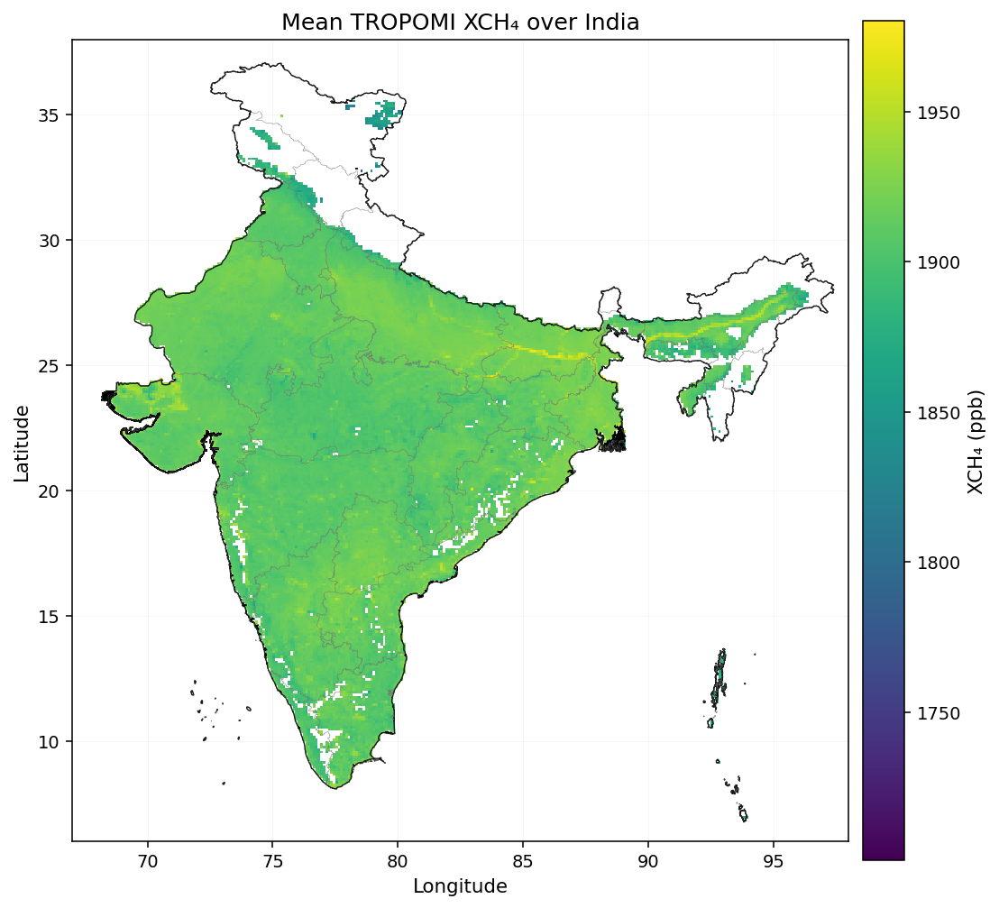

Saved /content/drive/MyDrive/Final---S5P_CH4_India_v16_EDGAR_LULC_Punjab/figures/valid_month_count.png


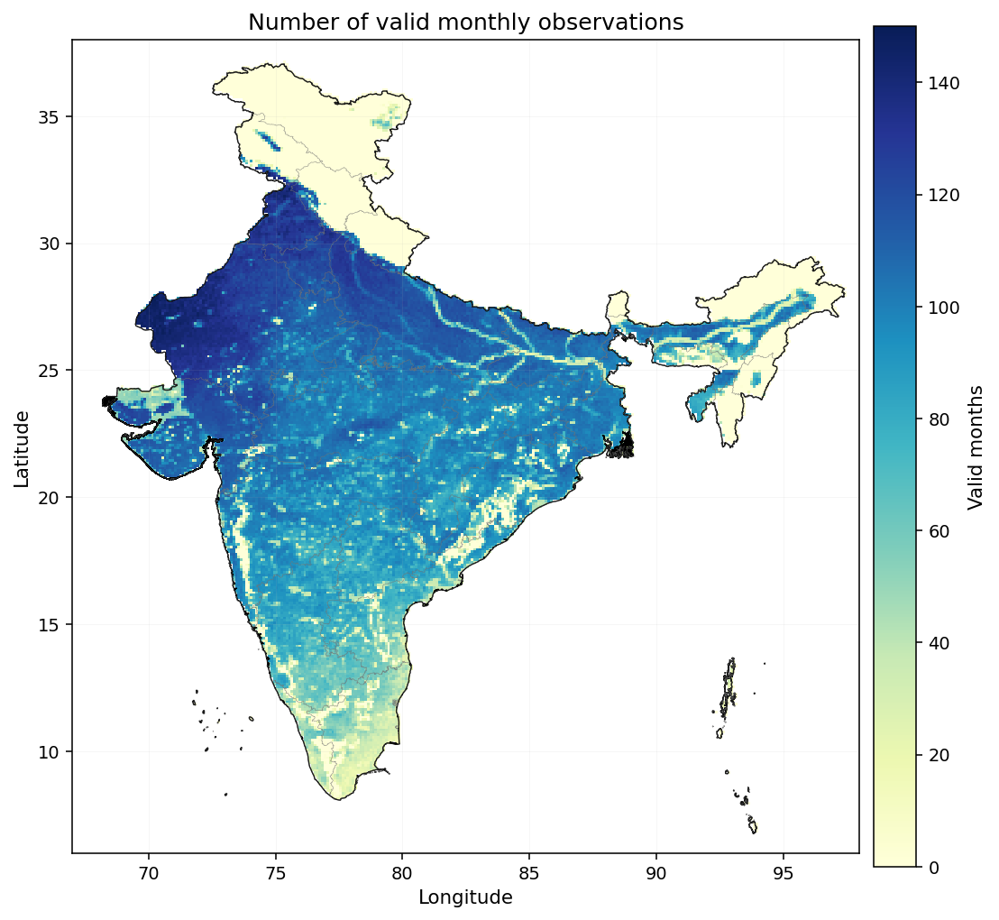

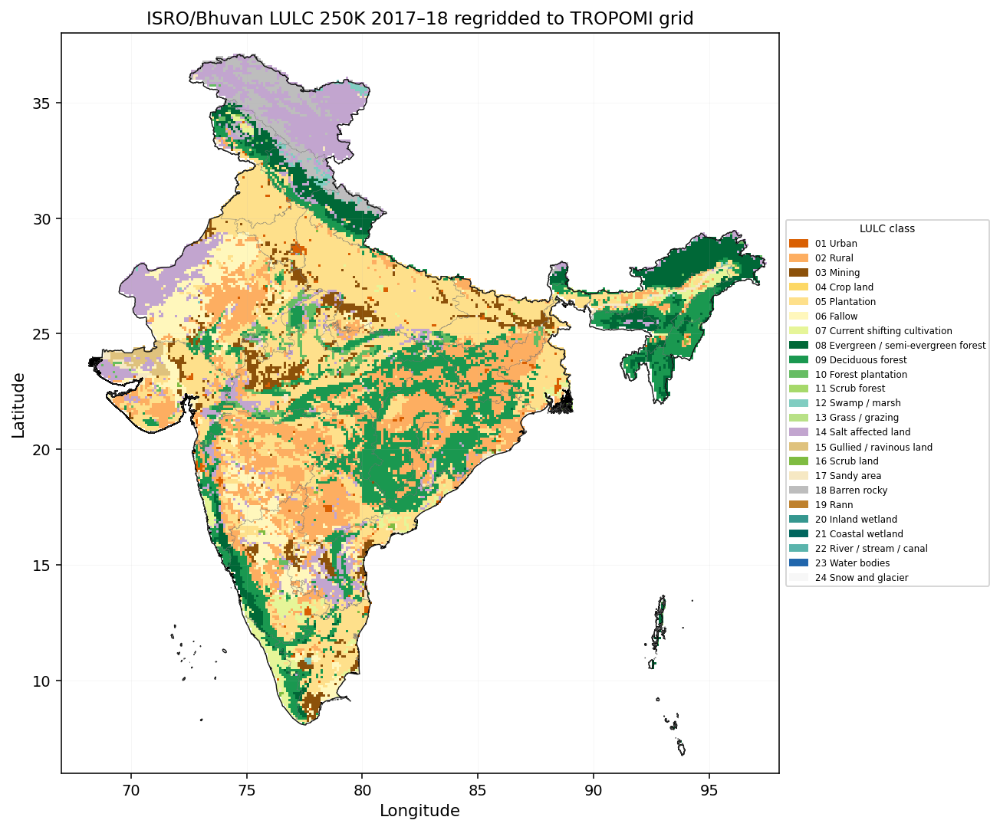

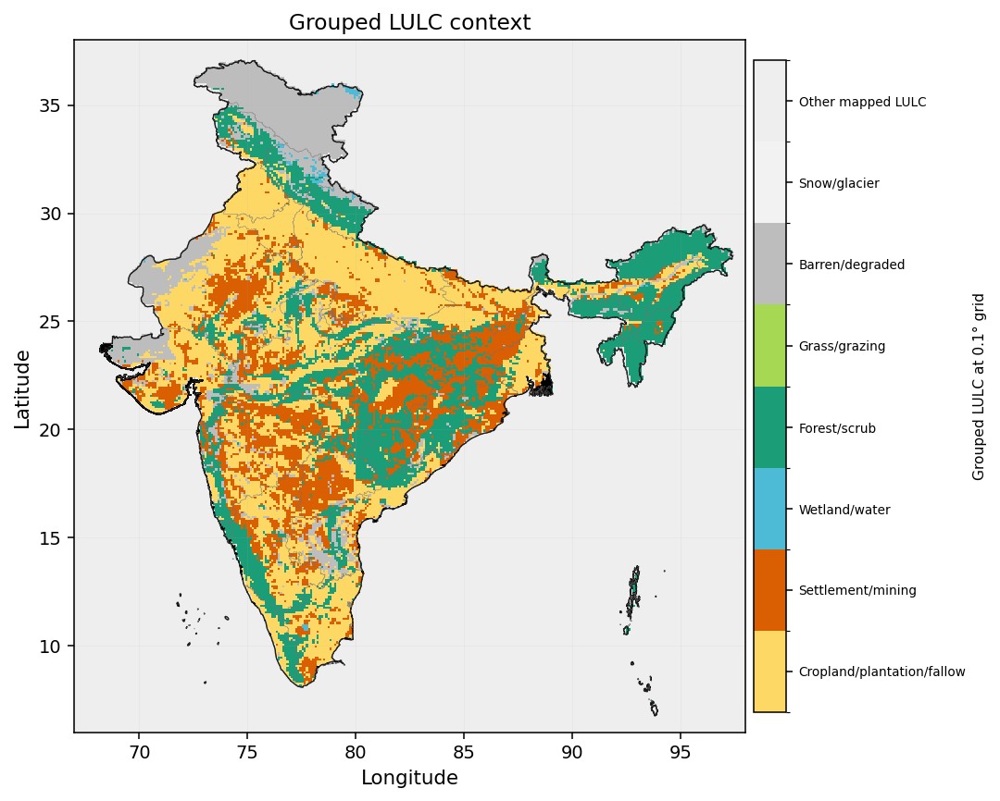

In [20]:
def processed_months():
    paths = sorted(glob.glob(f"{OUT_MONTHLY}/s5p_ch4_india_*.nc"))
    for d in PREVIOUS_MONTHLY_GRID_DIRS:
        paths.extend(sorted(glob.glob(f"{d}/s5p_ch4_india_*.nc")))
    paths = sorted(set(paths))
    out = []
    for p in paths:
        m = re.search(r"(20\d{4})", os.path.basename(p))
        if m:
            out.append(m.group(1))
    return sorted(out)

proc_months = processed_months()
print("Processed months:", len(proc_months), proc_months[:3], proc_months[-3:] if proc_months else [])

def load_stack(varname, month_list=None):
    if month_list is None:
        month_list = proc_months
    arrs = []
    keep_months = []
    for m in month_list:
        try:
            d = read_monthly_nc(m)
            arrs.append(d[varname].astype(np.float32))
            keep_months.append(m)
        except Exception as e:
            print("Skip", m, e)
    if not arrs:
        raise ValueError(f"No arrays loaded for {varname}")
    return np.stack(arrs, axis=0), keep_months

xch4_stack, stack_months = load_stack("xch4_mean")
anom_stack, _ = load_stack("anomaly_ppb", stack_months)
det_stack, _  = load_stack("detected", stack_months)
valid_stack,_ = load_stack("valid", stack_months)
valid_stack = valid_stack.astype(bool)
det_stack = det_stack.astype(bool)

dates = pd.to_datetime([m + "01" for m in stack_months], format="%Y%m%d")
month_numbers = np.array([d.month for d in dates])
years = np.array([d.year for d in dates])

mean_xch4 = np.nanmean(xch4_stack, axis=0)
mean_anom = np.nanmean(anom_stack, axis=0)
valid_month_count = np.sum(np.isfinite(xch4_stack), axis=0)

plot_spatial_pattern(mean_xch4, "Mean TROPOMI XCH₄ over India", "XCH₄ (ppb)", "viridis", "mean_xch4_india")
plot_spatial_pattern(valid_month_count.astype(float), "Number of valid monthly observations", "Valid months", "YlGnBu", "valid_month_count")

# LULC maps are plotted after the TROPOMI grid is available.
plot_lulc_24class_map(fname="lulc_24class_india_regridded")
plot_lulc_category_map(fname="lulc_grouped_india_regridded")

## 17. Monthly and seasonal patterns

Prepare monthly climatology and seasonal maps to examine recurring spatial and seasonal methane patterns.


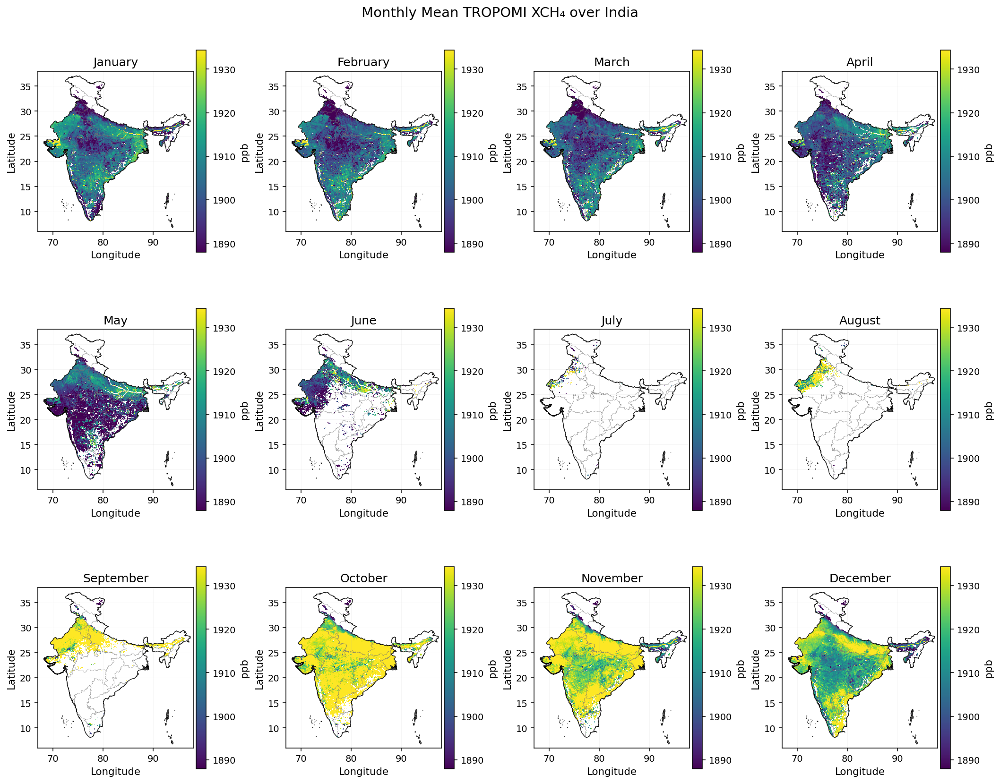

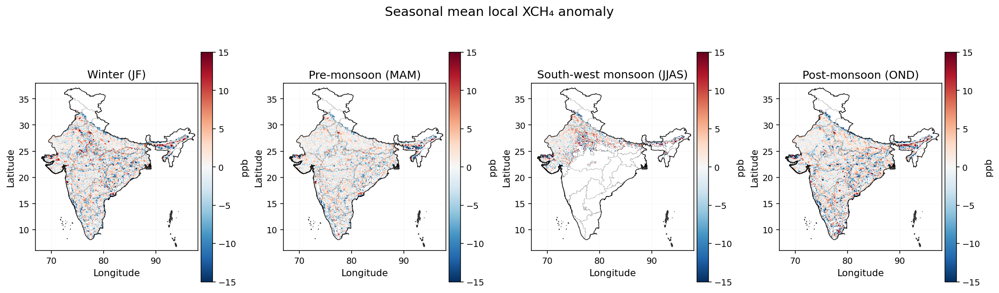

In [21]:
def season_from_month(m):
    # IMD-style seasonal classification requested for v15.
    if m in [1, 2]: return "JF"       # Winter
    if m in [3, 4, 5]: return "MAM"   # Pre-monsoon
    if m in [6, 7, 8, 9]: return "JJAS" # South-west monsoon
    return "OND"                       # Post-monsoon

SEASON_LABELS = {"JF": "Winter (JF)", "MAM": "Pre-monsoon (MAM)", "JJAS": "South-west monsoon (JJAS)", "OND": "Post-monsoon (OND)"}
seasons = np.array([season_from_month(m) for m in month_numbers])
season_order = ["JF", "MAM", "JJAS", "OND"]

# Monthly climatology figure
fig, axs = plt.subplots(3, 4, figsize=(15, 12), constrained_layout=True)
vmin = np.nanpercentile(mean_xch4[INDIA_MASK & np.isfinite(mean_xch4)], 2)
vmax = np.nanpercentile(mean_xch4[INDIA_MASK & np.isfinite(mean_xch4)], 98)
for mon in range(1, 13):
    ax = axs.ravel()[mon-1]
    sel = month_numbers == mon
    arr = np.nanmean(xch4_stack[sel], axis=0) if sel.any() else np.full((nLat,nLon), np.nan)
    pcolor_india(ax, arr, cmap="viridis", vmin=vmin, vmax=vmax, label="ppb")
    ax.set_title(datetime.date(2000, mon, 1).strftime("%B"))
fig.suptitle("Monthly Mean TROPOMI XCH₄ over India")
fig.savefig(f"{OUT_FIGS}/monthly_climatology_xch4.png", bbox_inches="tight")
plt.show()

# Seasonal mean anomaly maps
fig, axs = plt.subplots(1, 4, figsize=(16, 5), constrained_layout=True)
lim = np.nanpercentile(np.abs(mean_anom[INDIA_MASK & np.isfinite(mean_anom)]), 98)
lim = max(15, min(50, lim))
for ax, s in zip(axs, season_order):
    sel = seasons == s
    arr = np.nanmean(anom_stack[sel], axis=0) if sel.any() else np.full((nLat,nLon), np.nan)
    pcolor_india(ax, arr, cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), label="ppb")
    ax.set_title(SEASON_LABELS.get(s, s))
fig.suptitle("Seasonal mean local XCH₄ anomaly")
fig.savefig(f"{OUT_FIGS}/seasonal_mean_anomaly.png", bbox_inches="tight")
plt.show()

## 18. India-wide time-series analysis

Calculate area-weighted monthly means and trend statistics for XCH₄, anomaly, and hotspot activity.


,series,n,trend,p,sen_slope_per_month,sen_slope_per_year
0,India area-weighted monthly XCH4,166,increasing,0.000000,0.480199,5.762394
1,India area-weighted local anomaly,152,decreasing,0.001385,-0.001452,-0.017426
2,India deseasonalized XCH4,166,increasing,0.000000,0.459057,5.508689


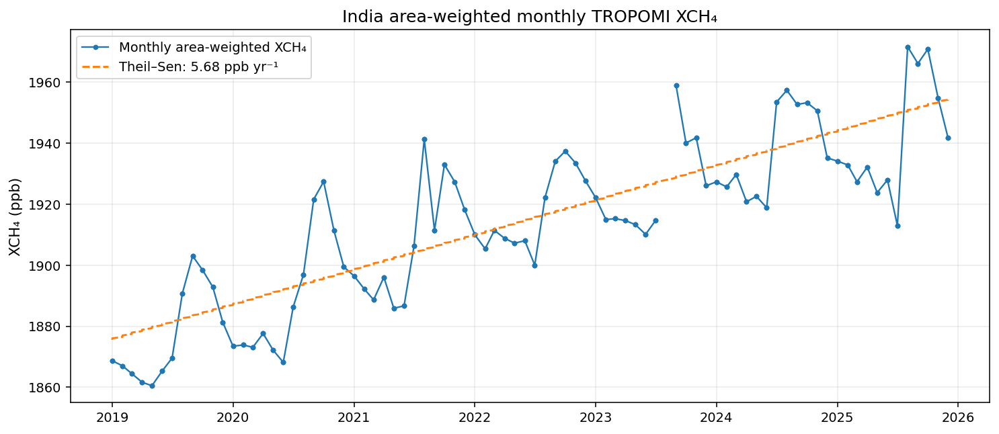

In [22]:
def area_weighted_mean_stack(stack, mask=INDIA_MASK):
    w = np.where(mask, AREA_KM2, np.nan)
    out = []
    for arr in stack:
        m = mask & np.isfinite(arr)
        if m.sum() == 0:
            out.append(np.nan)
        else:
            out.append(float(np.nansum(arr[m] * w[m]) / np.nansum(w[m])))
    return np.array(out)

india_xch4_ts = area_weighted_mean_stack(xch4_stack)
india_anom_ts = area_weighted_mean_stack(anom_stack)

# deseasonalized XCH4 by removing month climatology
xch4_deseason = india_xch4_ts.copy()
for mon in range(1, 13):
    sel = month_numbers == mon
    xch4_deseason[sel] = india_xch4_ts[sel] - np.nanmean(india_xch4_ts[sel])

def safe_mk_test(y, dates=None):
    y = np.asarray(y, dtype=float)
    ok = np.isfinite(y)
    if ok.sum() < 8:
        return {"n": int(ok.sum()), "trend": "insufficient", "p": np.nan, "sen_slope_per_month": np.nan, "sen_slope_per_year": np.nan}
    try:
        res = mk.original_test(y[ok])
        return {"n": int(ok.sum()), "trend": res.trend, "p": float(res.p), "sen_slope_per_month": float(res.slope), "sen_slope_per_year": float(res.slope*12)}
    except Exception:
        x = np.arange(ok.sum())
        slope, intercept, lo, hi = stats.theilslopes(y[ok], x)
        tau, p = stats.kendalltau(x, y[ok])
        return {"n": int(ok.sum()), "trend": "increasing" if slope>0 else "decreasing", "p": float(p), "sen_slope_per_month": float(slope), "sen_slope_per_year": float(slope*12)}

ts_tests = pd.DataFrame([
    {"series": "India area-weighted monthly XCH4", **safe_mk_test(india_xch4_ts)},
    {"series": "India area-weighted local anomaly", **safe_mk_test(india_anom_ts)},
    {"series": "India deseasonalized XCH4", **safe_mk_test(xch4_deseason)},
])
ts_tests.to_csv(f"{OUT_TABLES}/india_timeseries_trend_tests.csv", index=False)
display(ts_tests)

fig, ax = plt.subplots(figsize=(10.5, 4.5), constrained_layout=True)
ax.plot(dates, india_xch4_ts, marker="o", linewidth=1.2, markersize=3, label="Monthly area-weighted XCH₄")
ok = np.isfinite(india_xch4_ts)
if ok.sum() >= 8:
    x = np.arange(len(india_xch4_ts))[ok]
    slope, intercept, _, _ = stats.theilslopes(india_xch4_ts[ok], x)
    ax.plot(dates[ok], intercept + slope*x, linestyle="--", label=f"Theil–Sen: {slope*12:.2f} ppb yr⁻¹")
ax.set_ylabel("XCH₄ (ppb)")
ax.set_title("India area-weighted monthly TROPOMI XCH₄")
ax.grid(True, alpha=0.25)
ax.legend()
fig.savefig(f"{OUT_FIGS}/india_monthly_xch4_timeseries.png", bbox_inches="tight")
plt.show()

## 19. Pixel-wise trend analysis

Estimate deseasonalized XCH₄ trends for each grid cell and map statistically significant areas.


Pixel trends:   0%|          | 0/321 [00:00<?, ?it/s]

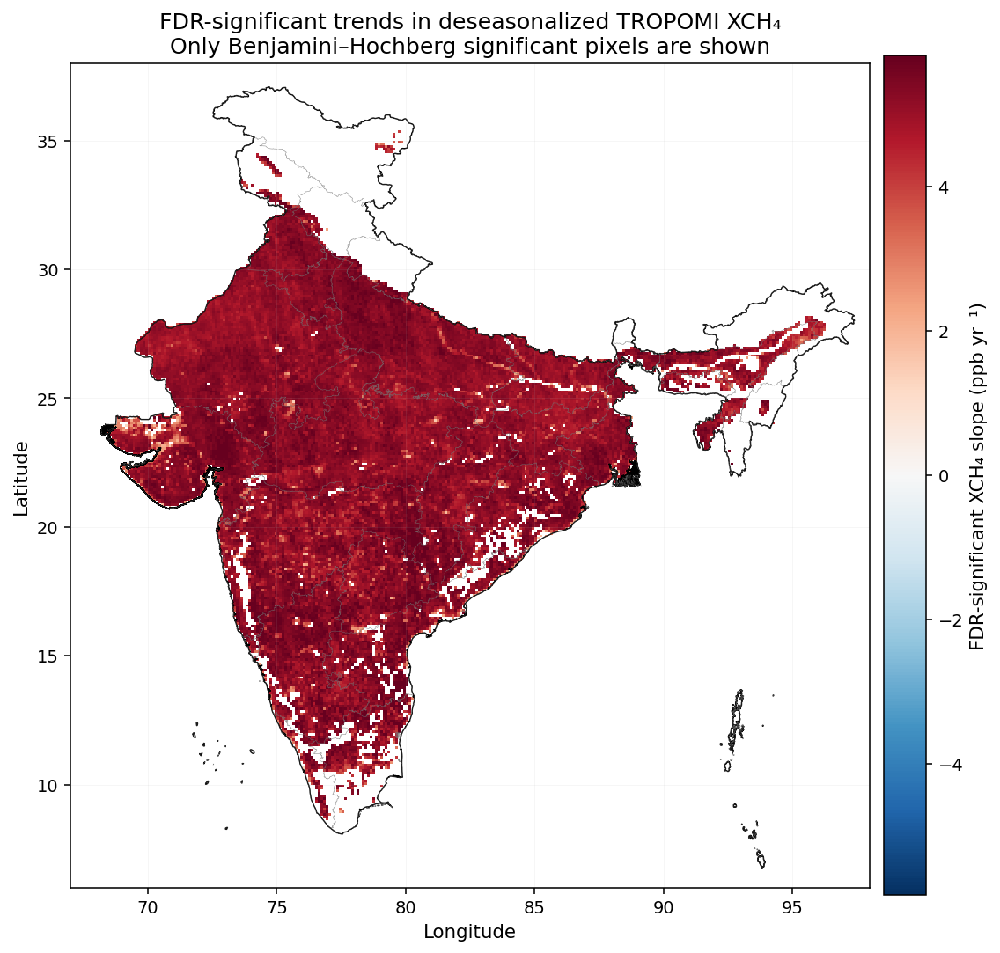

,metric,value
0,valid trend cells,2.280500e+04
1,FDR significant cells,2.275100e+04
2,FDR significant area km2,2.590304e+06
3,median slope ppb/yr,5.214569e+00
4,mean slope ppb/yr,5.115739e+00
5,median significant slope ppb/yr,5.215425e+00


In [23]:

def pixelwise_kendall_theilsen(stack, min_n=MIN_MONTHS_FOR_TREND):
    T, nr, nc = stack.shape
    slopes = np.full((nr, nc), np.nan, dtype=np.float32)
    pvals = np.full((nr, nc), np.nan, dtype=np.float32)
    taus = np.full((nr, nc), np.nan, dtype=np.float32)
    nobs = np.zeros((nr, nc), dtype=np.int16)
    x_all = np.arange(T, dtype=float)
    for i in tqdm(range(nr), desc="Pixel trends"):
        for j in range(nc):
            if not INDIA_MASK[i,j]:
                continue
            y = stack[:, i, j].astype(float)
            ok = np.isfinite(y)
            n = int(ok.sum())
            nobs[i,j] = n
            if n < min_n:
                continue
            x = x_all[ok]
            yy = y[ok]
            try:
                slope, intercept, lo, hi = stats.theilslopes(yy, x)
                tau, p = stats.kendalltau(x, yy)
                slopes[i,j] = slope * 12.0  # ppb per year
                taus[i,j] = tau
                pvals[i,j] = p
            except Exception:
                continue
    fdr_sig = np.zeros((nr, nc), dtype=bool)
    valid_p = np.isfinite(pvals) & INDIA_MASK
    qvals = np.full((nr, nc), np.nan, dtype=np.float32)
    if valid_p.sum() > 0:
        reject, p_adj, _, _ = multipletests(pvals[valid_p], alpha=FDR_ALPHA, method="fdr_bh")
        qvals[valid_p] = p_adj.astype(np.float32)
        fdr_sig[valid_p] = reject
    return slopes, pvals, qvals, fdr_sig, taus, nobs

# Remove the recurring seasonal cycle at each pixel before trend estimation.
xch4_deseason_stack = xch4_stack.copy().astype(np.float32)
for mon in range(1, 13):
    sel = month_numbers == mon
    if sel.any():
        clim = np.nanmean(xch4_stack[sel], axis=0)
        xch4_deseason_stack[sel] = xch4_stack[sel] - clim

trend_xch4_path = f"{OUT_MONTHLY}/trend_deseasonalized_xch4_outputs_v16.npz"
if os.path.exists(trend_xch4_path):
    npz = np.load(trend_xch4_path)
    xch4_slope = npz["slope"]; xch4_p = npz["p"]; xch4_q = npz["q"]; xch4_sig = npz["sig"].astype(bool); xch4_tau = npz["tau"]; xch4_n = npz["n"]
    print("Loaded existing v16 deseasonalized XCH₄ trend outputs.")
else:
    xch4_slope, xch4_p, xch4_q, xch4_sig, xch4_tau, xch4_n = pixelwise_kendall_theilsen(xch4_deseason_stack)
    np.savez_compressed(trend_xch4_path, slope=xch4_slope, p=xch4_p, q=xch4_q, sig=xch4_sig, tau=xch4_tau, n=xch4_n)

vals = xch4_slope[INDIA_MASK & np.isfinite(xch4_slope)]
lim = np.nanpercentile(np.abs(vals), 97) if vals.size else 5
lim = max(2, min(20, lim))

sig_slope = np.where(xch4_sig & INDIA_MASK, xch4_slope, np.nan)
fig, ax = plt.subplots(figsize=(8.0, 8.6), constrained_layout=True)
pcolor_india(ax, sig_slope, cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), label="FDR-significant XCH₄ slope (ppb yr⁻¹)")
ax.set_title("FDR-significant trends in deseasonalized TROPOMI XCH₄\nOnly Benjamini–Hochberg significant pixels are shown")
fig.savefig(f"{OUT_FIGS}/trend_deseasonalized_xch4_fdr_significant_only.png", bbox_inches="tight", dpi=300)
plt.show()

trend_summary = pd.DataFrame({
    "metric": ["valid trend cells", "FDR significant cells", "FDR significant area km2", "median slope ppb/yr", "mean slope ppb/yr", "median significant slope ppb/yr"],
    "value": [
        int(np.isfinite(xch4_slope).sum()),
        int(xch4_sig.sum()),
        float(np.nansum(AREA_KM2[xch4_sig & INDIA_MASK])),
        float(np.nanmedian(xch4_slope[INDIA_MASK & np.isfinite(xch4_slope)])),
        float(np.nanmean(xch4_slope[INDIA_MASK & np.isfinite(xch4_slope)])),
        float(np.nanmedian(sig_slope[INDIA_MASK & np.isfinite(sig_slope)])) if np.isfinite(sig_slope).any() else np.nan,
    ]
})
trend_summary.to_csv(f"{OUT_TABLES}/pixel_trend_summary_deseasonalized_xch4.csv", index=False)
display(trend_summary)


## 20. Hotspot frequency and persistent regions

Map recurrent enhancement frequency and identify persistent regions using neighbourhood-based recurrence.


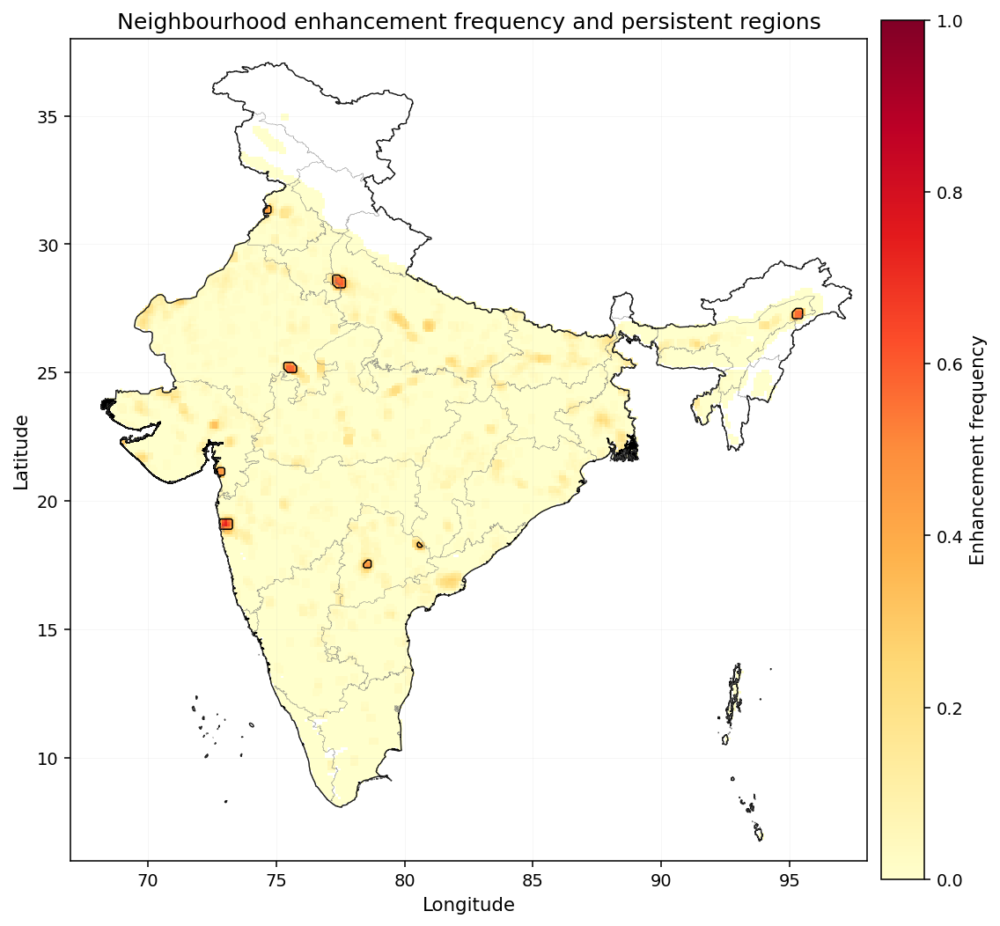

Persistent cells: 103 Area km²: 11566.35557689326


In [24]:
def compute_persistence(det_stack, valid_stack, month_list=None, hotspot_month_filter=None):
    if month_list is None:
        month_list = stack_months
    use = np.ones(len(month_list), dtype=bool)
    if hotspot_month_filter is not None:
        use = np.array([hotspot_month_filter(int(m[:4]), int(m[4:6])) for m in month_list], dtype=bool)
    N_meas = np.zeros((nLat, nLon), dtype=np.int16)
    N_enh = np.zeros((nLat, nLon), dtype=np.int16)
    for t in range(len(month_list)):
        if not use[t]:
            continue
        v = valid_stack[t].astype(bool) & INDIA_MASK
        d = det_stack[t].astype(bool) & v
        v_nei = maximum_filter(v.astype(np.int8), size=PERSISTENCE_NEIGHBOR_SIZE, mode="constant", cval=0) > 0
        d_nei = maximum_filter(d.astype(np.int8), size=PERSISTENCE_NEIGHBOR_SIZE, mode="constant", cval=0) > 0
        N_meas += v_nei.astype(np.int16)
        N_enh += d_nei.astype(np.int16)
    F = np.full((nLat, nLon), np.nan, dtype=np.float32)
    ok = INDIA_MASK & (N_meas > 0)
    F[ok] = N_enh[ok] / N_meas[ok]
    persistent = INDIA_MASK & (N_meas >= PERSISTENCE_MIN_MONTHS) & (F >= PERSISTENCE_FENH_MIN)
    return N_meas, N_enh, F, persistent

# hotspot month filter: exclude months for hotspot analysis if requested
if SKIP_MONTHS_FOR_HOTSPOTS:
    hfilter = lambda y,m: m not in SKIP_MONTHS_FOR_HOTSPOTS
else:
    hfilter = None

N_meas, N_enh, F_enh, persistent_mask = compute_persistence(det_stack, valid_stack, stack_months, hfilter)
np.savez_compressed(f"{OUT_MONTHLY}/hotspot_persistence_outputs.npz", N_meas=N_meas, N_enh=N_enh, F_enh=F_enh, persistent=persistent_mask)

fig, ax = plt.subplots(figsize=(8, 8.8), constrained_layout=True)
pcolor_india(ax, F_enh, cmap="YlOrRd", vmin=0, vmax=1, label="Enhancement frequency")
# Outline persistent regions
ax.contour(lon_centers, lat_centers, persistent_mask.astype(float), levels=[0.5], colors="black", linewidths=0.8)
ax.set_title("Neighbourhood enhancement frequency and persistent regions")
fig.savefig(f"{OUT_FIGS}/hotspot_enhancement_frequency.png", bbox_inches="tight")
plt.show()

print("Persistent cells:", int(persistent_mask.sum()), "Area km²:", float(np.nansum(AREA_KM2[persistent_mask])))

## 21. Persistent-region summary table

Create a table of persistent enhancement regions with centroid locations, area, frequency, anomaly, and other summary values.


,persistent_region_id,state_at_centroid,centroid_lat,centroid_lon,n_cells,area_km2,mean_F_enh,max_F_enh,mean_N_meas_months,mean_N_enh_months,...,lulc_dominant_fraction,lulc_frac_cropland_plantation_fallow,lulc_frac_settlement_mining,lulc_frac_wetland_water,lulc_frac_forest_scrub,lulc_frac_grass_grazing,lulc_frac_barren_degraded,lulc_frac_snow_glacier,lulc_frac_other,lulc_top3_classes
2,3,MH,19.102118,73.048522,20,2336.730290,0.563656,0.735849,100.500000,56.900000,...,0.449864,0.050045,0.599849,0.0,0.149985,0.0,0.200121,0.0,0.0,Urban (45.0%); Sandy area (15.0%); Rural (15.0%)
5,6,AS,27.285796,95.318890,15,1648.220905,0.512614,0.584906,112.933333,57.733333,...,0.799868,0.799868,0.066631,0.0,0.133501,0.0,0.000000,0.0,0.0,Current shifting cultivation (80.0%); Evergree...
4,5,RJ,25.191954,75.555850,18,2013.763284,0.504979,0.589286,116.666667,58.888889,...,0.722200,0.111065,0.000000,0.0,0.833448,0.0,0.055487,0.0,0.0,Forest plantation (72.2%); Deciduous forest (1...
6,7,UP,28.535292,77.450839,22,2389.585822,0.499529,0.593750,127.818182,63.818182,...,0.545062,0.409444,0.545062,0.0,0.045494,0.0,0.000000,0.0,0.0,Urban (54.5%); Plantation (40.9%); Forest plan...
3,4,GJ,21.148401,72.846633,9,1037.831245,0.448915,0.482143,116.888889,52.444444,...,0.250190,0.374863,0.500127,0.0,0.000000,0.0,0.125011,0.0,0.0,Rural (25.0%); Urban (25.0%); Fallow (25.0%)
0,1,TS,17.532193,78.562242,8,943.171026,0.427541,0.488889,92.500000,39.500000,...,0.750155,0.000000,1.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,Urban (75.0%); Rural (25.0%)
7,8,PB,31.337749,74.661002,8,844.848554,0.408136,0.432432,147.000000,60.000000,...,1.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,Plantation (100.0%)
1,2,TS,18.282854,80.583004,3,352.204450,0.360755,0.369565,88.666667,32.000000,...,0.666603,0.333397,0.000000,0.0,0.000000,0.0,0.666603,0.0,0.0,Sandy area (66.7%); Plantation (33.3%)


,persistent_region_id,state_at_centroid,centroid_lat,centroid_lon,area_km2,mean_F_enh,lulc_dominant_code,lulc_dominant_label,lulc_dominant_category,lulc_dominant_fraction,lulc_frac_cropland_plantation_fallow,lulc_frac_settlement_mining,lulc_frac_wetland_water,lulc_frac_forest_scrub,lulc_frac_grass_grazing,lulc_frac_barren_degraded,lulc_frac_snow_glacier,lulc_frac_other,lulc_top3_classes
2,3,MH,19.102118,73.048522,2336.730290,0.563656,1,Urban,settlement_mining,0.449864,0.050045,0.599849,0.0,0.149985,0.0,0.200121,0.0,0.0,Urban (45.0%); Sandy area (15.0%); Rural (15.0%)
5,6,AS,27.285796,95.318890,1648.220905,0.512614,7,Current shifting cultivation,cropland_plantation_fallow,0.799868,0.799868,0.066631,0.0,0.133501,0.0,0.000000,0.0,0.0,Current shifting cultivation (80.0%); Evergree...
4,5,RJ,25.191954,75.555850,2013.763284,0.504979,10,Forest plantation,forest_scrub,0.722200,0.111065,0.000000,0.0,0.833448,0.0,0.055487,0.0,0.0,Forest plantation (72.2%); Deciduous forest (1...
6,7,UP,28.535292,77.450839,2389.585822,0.499529,1,Urban,settlement_mining,0.545062,0.409444,0.545062,0.0,0.045494,0.0,0.000000,0.0,0.0,Urban (54.5%); Plantation (40.9%); Forest plan...
3,4,GJ,21.148401,72.846633,1037.831245,0.448915,2,Rural,settlement_mining,0.250190,0.374863,0.500127,0.0,0.000000,0.0,0.125011,0.0,0.0,Rural (25.0%); Urban (25.0%); Fallow (25.0%)
0,1,TS,17.532193,78.562242,943.171026,0.427541,1,Urban,settlement_mining,0.750155,0.000000,1.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,Urban (75.0%); Rural (25.0%)
7,8,PB,31.337749,74.661002,844.848554,0.408136,5,Plantation,cropland_plantation_fallow,1.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,Plantation (100.0%)
1,2,TS,18.282854,80.583004,352.204450,0.360755,17,Sandy area,barren_degraded,0.666603,0.333397,0.000000,0.0,0.000000,0.0,0.666603,0.0,0.0,Sandy area (66.7%); Plantation (33.3%)


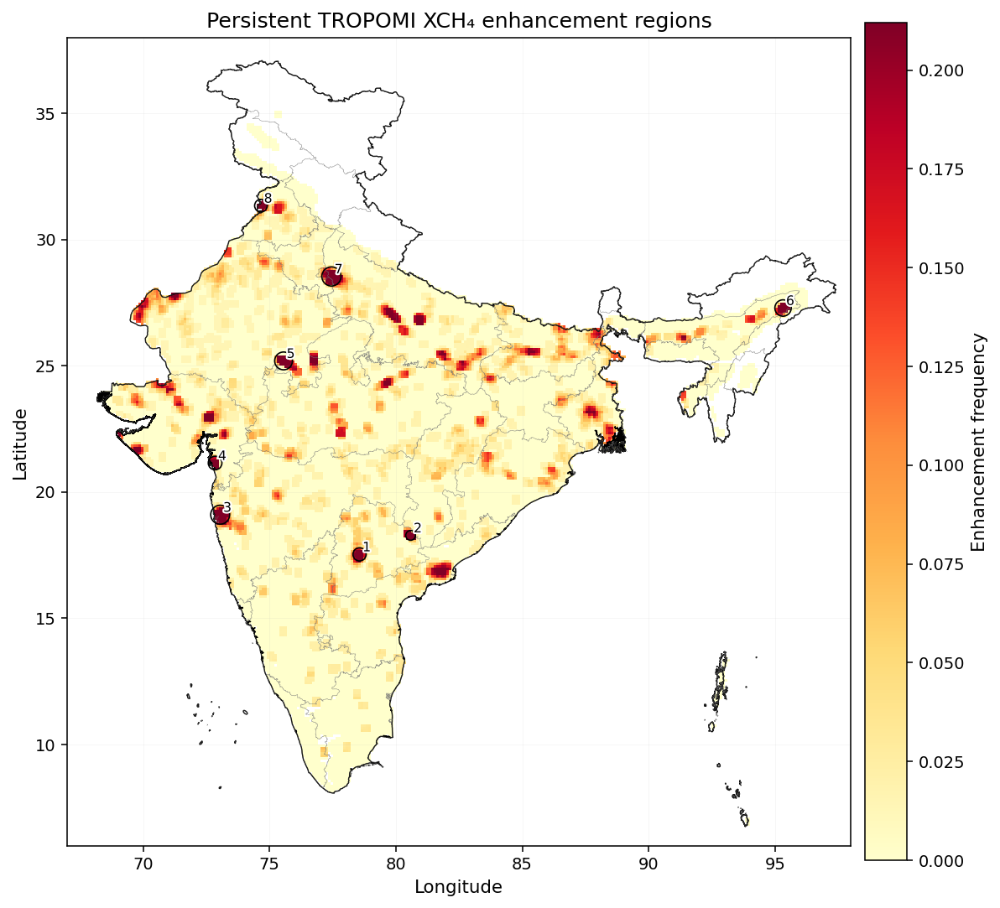

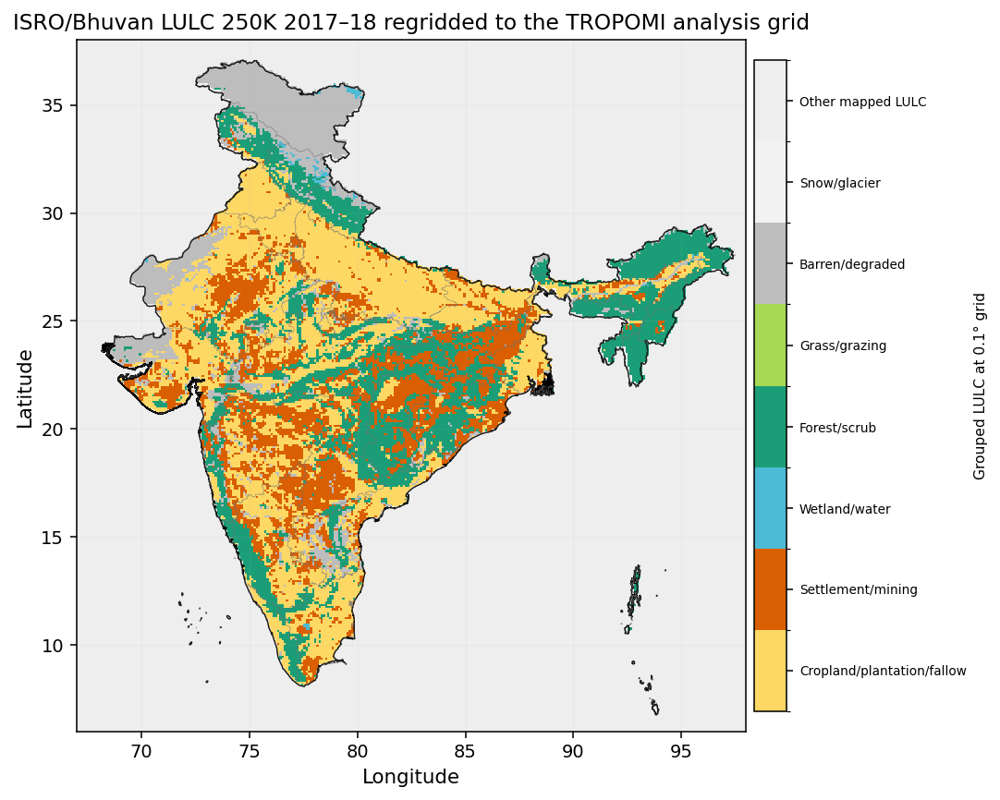

In [25]:

def nearest_context_place(lon, lat, max_km=150):
    if not HAS_POINTS:
        return {"nearest_place": None, "nearest_place_type": None, "nearest_place_km": np.nan}
    frames = [g for g in POINT_LAYERS.values() if g is not None and len(g)]
    if not frames:
        return {"nearest_place": None, "nearest_place_type": None, "nearest_place_km": np.nan}
    pts = pd.concat(frames, ignore_index=True)
    # approximate distance; adequate for table context, not geodesic analysis
    dx = (pts["lon"].values - lon) * 111.32 * np.cos(np.deg2rad(lat))
    dy = (pts["lat"].values - lat) * 110.57
    dist = np.sqrt(dx*dx + dy*dy)
    k = int(np.nanargmin(dist))
    if not np.isfinite(dist[k]) or dist[k] > max_km:
        return {"nearest_place": None, "nearest_place_type": None, "nearest_place_km": np.nan}
    return {"nearest_place": str(pts.iloc[k]["label"]), "nearest_place_type": str(pts.iloc[k]["layer_type"]), "nearest_place_km": float(dist[k])}


def state_at_centroid(lon, lat):
    if not HAS_STATES:
        return None
    try:
        p = Point(lon, lat)
        name_col = guess_name_column(states_gdf)
        hit = states_gdf[states_gdf.geometry.contains(p)]
        if len(hit) and name_col:
            return str(hit.iloc[0][name_col])
    except Exception:
        pass
    return None


def persistent_region_table(persistent_mask, F_enh, N_meas, N_enh, anom_stack):
    lab, n = label(persistent_mask, structure=CONNECTIVITY)
    rows = []
    mean_anom_all = np.nanmean(anom_stack, axis=0)
    max_anom_all = np.nanmax(anom_stack, axis=0)
    for ridx in range(1, n+1):
        m = lab == ridx
        if m.sum() < MIN_CLUSTER_CELLS:
            continue
        weights = np.where(m, np.nan_to_num(F_enh, nan=0), 0)
        if np.nansum(weights) > 0:
            lat_c = float(np.nansum(LAT2D * weights) / np.nansum(weights))
            lon_c = float(np.nansum(LON2D * weights) / np.nansum(weights))
        else:
            lat_c = float(np.nanmean(LAT2D[m])); lon_c = float(np.nanmean(LON2D[m]))
        row = {
            "persistent_region_id": ridx,
            "state_at_centroid": state_at_centroid(lon_c, lat_c),
            "centroid_lat": lat_c,
            "centroid_lon": lon_c,
            "n_cells": int(m.sum()),
            "area_km2": float(np.nansum(AREA_KM2[m])),
            "mean_F_enh": float(np.nanmean(F_enh[m])),
            "max_F_enh": float(np.nanmax(F_enh[m])),
            "mean_N_meas_months": float(np.nanmean(N_meas[m])),
            "mean_N_enh_months": float(np.nanmean(N_enh[m])),
            "mean_local_anomaly_ppb": float(np.nanmean(mean_anom_all[m])),
            "max_local_anomaly_ppb": float(np.nanmax(max_anom_all[m])),
            "mean_trend_ppb_per_year": float(np.nanmean(anom_slope[m])) if 'anom_slope' in globals() else np.nan,
            "frac_cells_FDR_trend_sig": float(np.nanmean(anom_sig[m])) if 'anom_sig' in globals() else np.nan,
        }
        row.update(nearest_context_place(lon_c, lat_c))
        row.update(lulc_composition_for_mask(m, prefix="lulc"))
        rows.append(row)
    df = pd.DataFrame(rows).sort_values(["mean_F_enh", "area_km2"], ascending=[False, False]) if rows else pd.DataFrame()
    return df

persistent_regions = persistent_region_table(persistent_mask, F_enh, N_meas, N_enh, anom_stack)
persistent_regions.to_csv(f"{OUT_TABLES}/persistent_enhancement_regions_with_lulc_context.csv", index=False)
# Backward-compatible filename for downstream writing.
persistent_regions.to_csv(f"{OUT_TABLES}/persistent_enhancement_regions.csv", index=False)
display(persistent_regions.head(25))

# LULC composition table for all persistent clusters.
if len(persistent_regions) and HAS_LULC:
    lulc_cols = [c for c in persistent_regions.columns if c.startswith("lulc_")]
    display(persistent_regions[["persistent_region_id", "state_at_centroid", "centroid_lat", "centroid_lon", "area_km2", "mean_F_enh"] + lulc_cols].head(25))

fig, ax = plt.subplots(figsize=(8.4, 9.0), constrained_layout=True)
pcolor_india(ax, F_enh, cmap="YlOrRd", vmin=0, vmax=min(1, max(0.2, finite_percentile(F_enh, 99, INDIA_MASK))), label="Enhancement frequency")
if len(persistent_regions):
    sizes = 18 + 120 * (persistent_regions["area_km2"] / persistent_regions["area_km2"].max())
    ax.scatter(persistent_regions["centroid_lon"], persistent_regions["centroid_lat"], s=sizes, facecolor="none", edgecolor="black", linewidth=0.85, zorder=7)
    for _, r in persistent_regions.head(12).iterrows():
        ax.text(r.centroid_lon+0.12, r.centroid_lat+0.12, str(int(r.persistent_region_id)), fontsize=8, zorder=8,
                path_effects=[pe.withStroke(linewidth=2.2, foreground="white")])
ax.set_title("Persistent TROPOMI XCH₄ enhancement regions")
fig.savefig(f"{OUT_FIGS}/persistent_regions_centroids.png", bbox_inches="tight")
plt.show()

# Optional all-India LULC category map for context.
if HAS_LULC:
    plot_lulc_category_map(title="ISRO/Bhuvan LULC 250K 2017–18 regridded to the TROPOMI analysis grid", fname="lulc_250k_1718_regridded_category_map")


## 21A. Hotspot context map

Add towns and administrative headquarters to help interpret persistent enhancement regions without overcrowding the map.


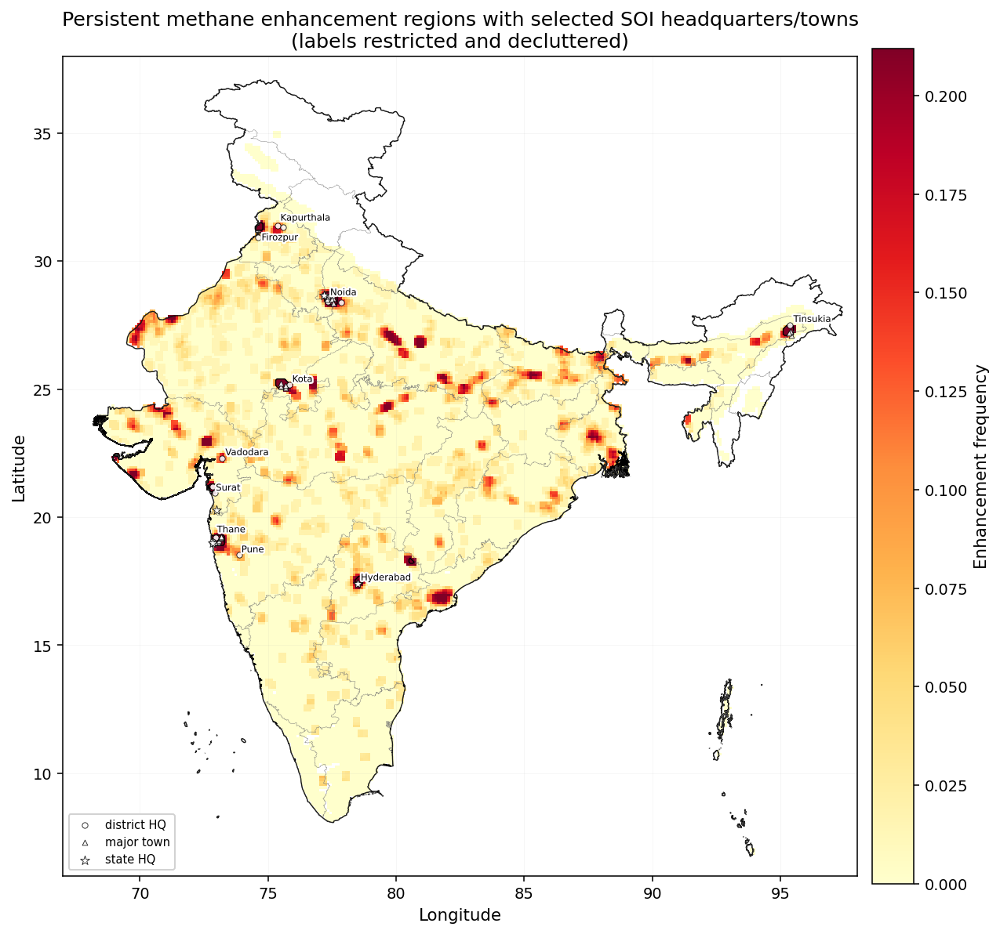

In [26]:

# v16: cleaner hotspot/context map with Survey of India headquarters and selected towns.
# Labels are restricted to the highest-context points and decluttered to avoid the overlap seen in v15.
try:
    pmask_to_plot = persistent_mask if 'persistent_mask' in globals() else persistent_all
    context_pts = context_points_for_mask(mask_arr=pmask_to_plot, value_arr=F_enh, value_percentile=95,
                                          max_state_hq=10, max_district_hq=18, max_major_towns=18,
                                          include_state_hq=True, buffer_cells=10)
    if len(context_pts):
        context_pts.to_file(f"{OUT_TABLES}/context_points_on_hotspots.geojson", driver="GeoJSON")
    fig, ax = plt.subplots(figsize=(9.0, 9.6), constrained_layout=True)
    pcolor_india(ax, F_enh, cmap="YlOrRd", vmin=0, vmax=min(1, max(0.2, finite_percentile(F_enh, 99, INDIA_MASK))), label="Enhancement frequency")
    ax.contour(lon_centers, lat_centers, pmask_to_plot.astype(float), levels=[0.5], colors="black", linewidths=0.75)
    plot_context_points(ax, context_pts, label_limit=20, fontsize=6.0, label_state_hq=False, min_label_sep_deg=0.65)
    ax.set_title("Persistent methane enhancement regions with selected SOI headquarters/towns\n(labels restricted and decluttered)")
    fig.savefig(f"{OUT_FIGS}/persistent_hotspots_with_towns_hq_decluttered.png", bbox_inches="tight")
    plt.show()
except Exception as e:
    print("Context point hotspot map skipped:", e)


## 22. Hotspot activity time series

Analyse changes and seasonality in monthly hotspot activity.


,yyyymm,date,year,month,season,valid_area_km2,hotspot_area_km2,hotspot_area_fraction_of_valid,detected_cells,mean_hotspot_anomaly_ppb,max_hotspot_anomaly_ppb,india_mean_anomaly_ppb
0,201901,2019-01-01,2019,1,JF,2.494557e+06,6648.041411,0.002665,59,20.089043,56.855225,-0.391653
1,201901,2019-01-01,2019,1,JF,2.494557e+06,6648.041411,0.002665,59,20.089043,56.855225,-0.391653
2,201902,2019-02-01,2019,2,JF,2.441989e+06,12207.130947,0.004999,108,18.434023,71.334839,-0.288852
3,201902,2019-02-01,2019,2,JF,2.441989e+06,12207.130947,0.004999,108,18.434023,71.334839,-0.288852
4,201903,2019-03-01,2019,3,MAM,2.472325e+06,9460.346227,0.003826,84,16.621935,39.928467,-0.286428


,metric,n,trend,p,sen_slope_per_month,sen_slope_per_year
0,hotspot_area_km2,168,no trend,0.697523,0.000000,0.000000
1,hotspot_area_fraction_of_valid,166,no trend,0.729893,0.000000,0.000000
2,detected_cells,168,no trend,0.776162,0.000000,0.000000
3,mean_hotspot_anomaly_ppb,146,increasing,0.002552,0.014939,0.179266
4,max_hotspot_anomaly_ppb,146,decreasing,0.003047,-0.066378,-0.796538


,metric,test,H,p
0,hotspot_area_km2,Kruskal-Wallis,118.838347,1.372804e-25
1,hotspot_area_fraction_of_valid,Kruskal-Wallis,15.697269,1.308099e-03
2,mean_hotspot_anomaly_ppb,Kruskal-Wallis,35.692654,8.696834e-08


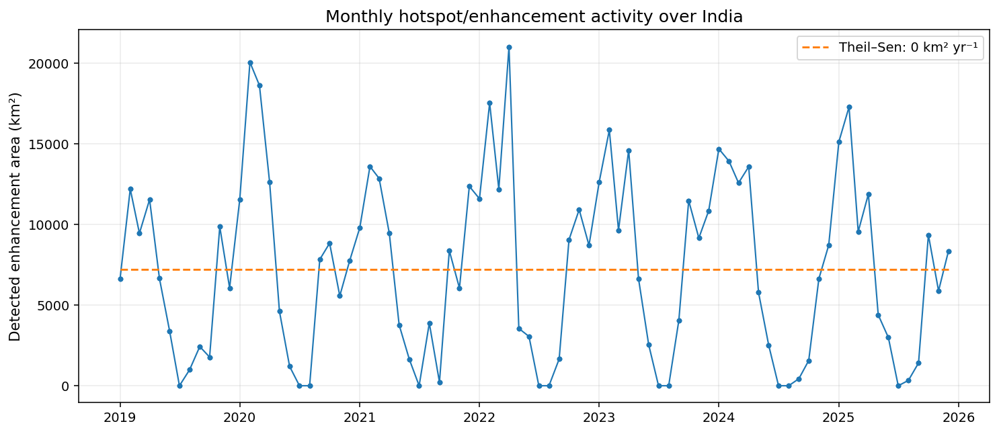

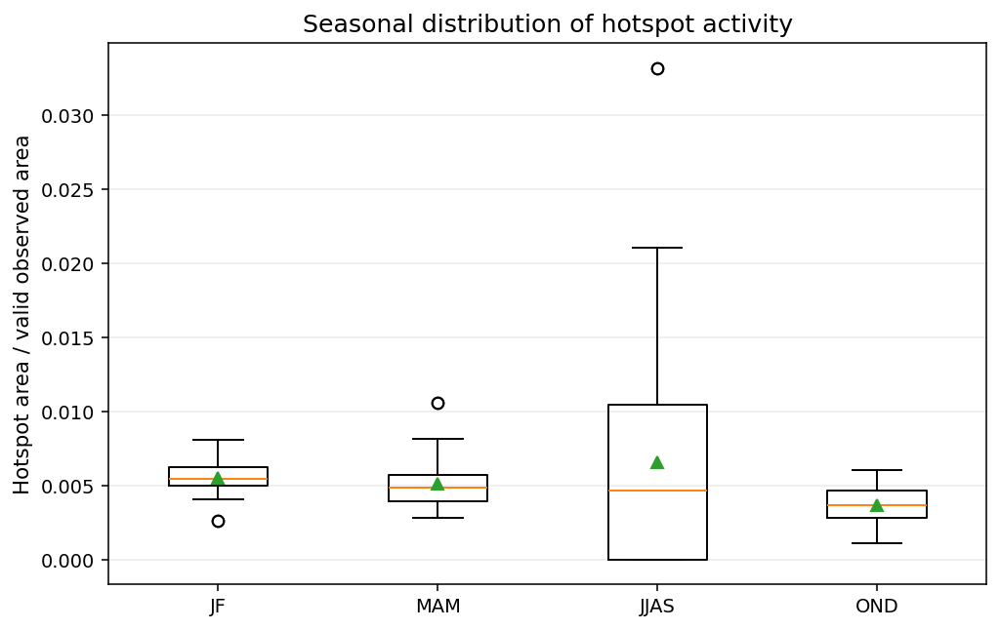

In [27]:
def monthly_hotspot_summary():
    rows = []
    for idx, m in enumerate(stack_months):
        det = det_stack[idx] & INDIA_MASK
        valid = valid_stack[idx] & INDIA_MASK
        anom = anom_stack[idx]
        area = float(np.nansum(AREA_KM2[det]))
        rows.append({
            "yyyymm": m,
            "date": pd.to_datetime(m + "01", format="%Y%m%d"),
            "year": int(m[:4]),
            "month": int(m[4:6]),
            "season": season_from_month(int(m[4:6])),
            "valid_area_km2": float(np.nansum(AREA_KM2[valid])),
            "hotspot_area_km2": area,
            "hotspot_area_fraction_of_valid": area / float(np.nansum(AREA_KM2[valid])) if valid.sum() else np.nan,
            "detected_cells": int(det.sum()),
            "mean_hotspot_anomaly_ppb": float(np.nanmean(anom[det])) if det.sum() else np.nan,
            "max_hotspot_anomaly_ppb": float(np.nanmax(anom[det])) if det.sum() else np.nan,
            "india_mean_anomaly_ppb": float(np.nanmean(anom[valid])) if valid.sum() else np.nan,
        })
    return pd.DataFrame(rows)

hot_ts = monthly_hotspot_summary()
hot_ts.to_csv(f"{OUT_TABLES}/monthly_hotspot_activity_summary.csv", index=False)
display(hot_ts.head())

# Mann-Kendall tests for hotspot metrics
metric_tests = []
for metric in ["hotspot_area_km2", "hotspot_area_fraction_of_valid", "detected_cells", "mean_hotspot_anomaly_ppb", "max_hotspot_anomaly_ppb"]:
    metric_tests.append({"metric": metric, **safe_mk_test(hot_ts[metric].values)})
metric_tests = pd.DataFrame(metric_tests)
metric_tests.to_csv(f"{OUT_TABLES}/hotspot_timeseries_trend_tests.csv", index=False)
display(metric_tests)

# Seasonal Kruskal-Wallis tests
season_tests = []
for metric in ["hotspot_area_km2", "hotspot_area_fraction_of_valid", "mean_hotspot_anomaly_ppb"]:
    groups = [hot_ts.loc[hot_ts.season == s, metric].dropna().values for s in season_order]
    groups = [g for g in groups if len(g) >= 3]
    if len(groups) >= 2:
        H, p = stats.kruskal(*groups)
        season_tests.append({"metric": metric, "test": "Kruskal-Wallis", "H": float(H), "p": float(p)})
season_tests = pd.DataFrame(season_tests)
season_tests.to_csv(f"{OUT_TABLES}/hotspot_seasonality_tests.csv", index=False)
display(season_tests)

fig, ax = plt.subplots(figsize=(10.5, 4.5), constrained_layout=True)
ax.plot(hot_ts["date"], hot_ts["hotspot_area_km2"], marker="o", markersize=3, linewidth=1.1)
ok = np.isfinite(hot_ts["hotspot_area_km2"].values)
if ok.sum() >= 8:
    x = np.arange(len(hot_ts))[ok]
    y = hot_ts["hotspot_area_km2"].values[ok]
    slope, intercept, _, _ = stats.theilslopes(y, x)
    ax.plot(hot_ts["date"].values[ok], intercept+slope*x, linestyle="--", label=f"Theil–Sen: {slope*12:.0f} km² yr⁻¹")
ax.set_ylabel("Detected enhancement area (km²)")
ax.set_title("Monthly hotspot/enhancement activity over India")
ax.grid(True, alpha=0.25)
ax.legend()
fig.savefig(f"{OUT_FIGS}/monthly_hotspot_area_timeseries.png", bbox_inches="tight")
plt.show()

# Seasonal boxplot
fig, ax = plt.subplots(figsize=(7.2, 4.5), constrained_layout=True)
data = [hot_ts.loc[hot_ts.season==s, "hotspot_area_fraction_of_valid"].dropna().values for s in season_order]
ax.boxplot(data, labels=season_order, showmeans=True)
ax.set_ylabel("Hotspot area / valid observed area")
ax.set_title("Seasonal distribution of hotspot activity")
ax.grid(True, axis="y", alpha=0.25)
fig.savefig(f"{OUT_FIGS}/seasonal_hotspot_activity_boxplot.png", bbox_inches="tight")
plt.show()

## 23. Spatial autocorrelation

Use hotspot frequency to calculate spatial clustering statistics, including Moran's I and local cluster maps.


Global Moran's I for enhancement frequency: {'I': 0.8084805304627005, 'p_perm': 0.005, 'n': 25131, 'permutations': 199}


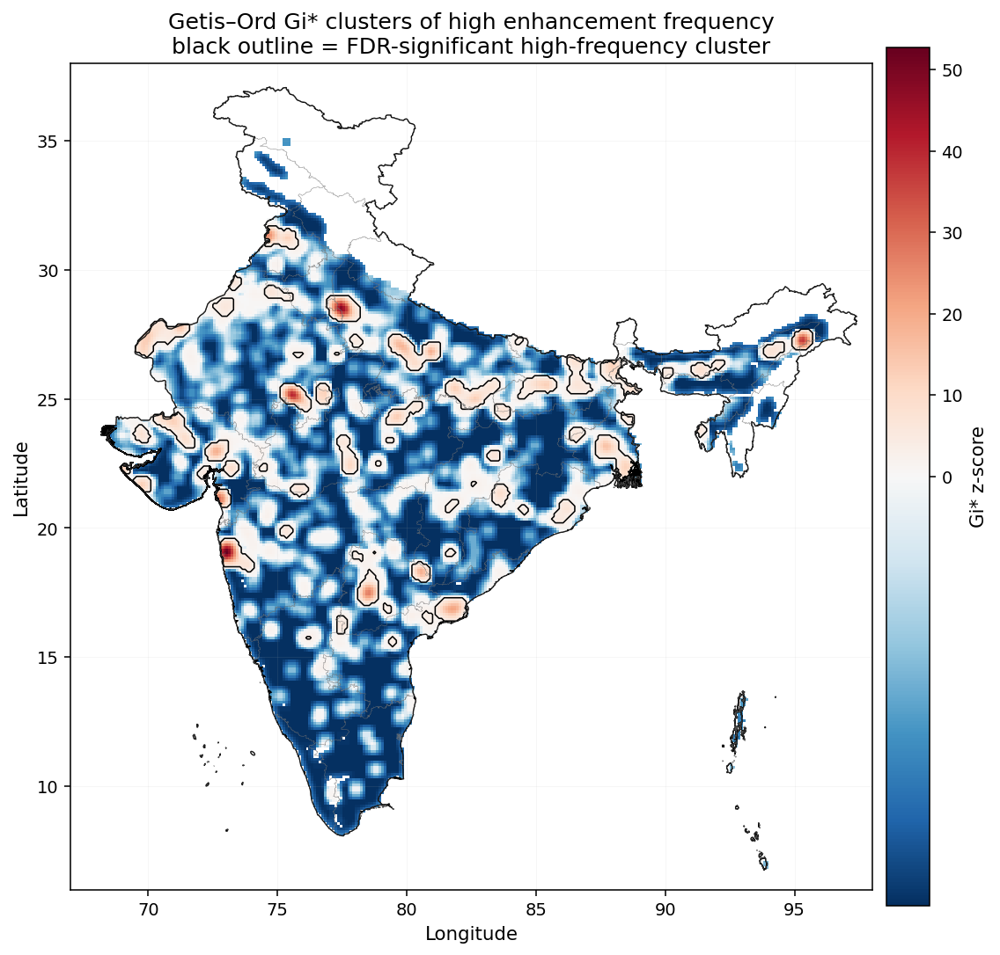

FDR-significant high Gi* cells: 2564


In [28]:
def queen_neighbor_offsets(radius=1):
    offsets = []
    for di in range(-radius, radius+1):
        for dj in range(-radius, radius+1):
            if di == 0 and dj == 0:
                continue
            offsets.append((di, dj))
    return offsets

def global_moran_i_grid(arr, mask, radius=1, permutations=199, seed=42):
    rng = np.random.default_rng(seed)
    x = arr.copy().astype(float)
    ok = mask & np.isfinite(x)
    xvals = x[ok]
    if xvals.size < 20:
        return {"I": np.nan, "p_perm": np.nan, "n": int(xvals.size)}
    xmean = np.nanmean(xvals)
    denom = np.nansum((xvals - xmean)**2)
    offsets = queen_neighbor_offsets(radius)
    def calc_I(vals_grid):
        num = 0.0; W = 0.0
        for di, dj in offsets:
            shifted = np.full_like(vals_grid, np.nan, dtype=float)
            src_i0 = max(0, -di); src_i1 = min(nLat, nLat-di)
            src_j0 = max(0, -dj); src_j1 = min(nLon, nLon-dj)
            dst_i0 = max(0, di); dst_i1 = min(nLat, nLat+di)
            dst_j0 = max(0, dj); dst_j1 = min(nLon, nLon+dj)
            shifted[dst_i0:dst_i1, dst_j0:dst_j1] = vals_grid[src_i0:src_i1, src_j0:src_j1]
            pair = ok & np.isfinite(shifted)
            num += np.nansum((vals_grid[pair]-xmean)*(shifted[pair]-xmean))
            W += pair.sum()
        return (xvals.size / W) * (num / denom) if W > 0 and denom > 0 else np.nan
    vals_grid = np.full_like(x, np.nan)
    vals_grid[ok] = x[ok]
    I_obs = calc_I(vals_grid)
    perm_Is = []
    flat = xvals.copy()
    for _ in range(permutations):
        rng.shuffle(flat)
        pg = np.full_like(x, np.nan)
        pg[ok] = flat
        perm_Is.append(calc_I(pg))
    perm_Is = np.array(perm_Is)
    p = (np.sum(np.abs(perm_Is) >= abs(I_obs)) + 1) / (np.isfinite(perm_Is).sum() + 1)
    return {"I": float(I_obs), "p_perm": float(p), "n": int(xvals.size), "permutations": permutations}

def getis_ord_gi_star_grid(arr, mask, radius=1):
    x = np.where(mask & np.isfinite(arr), arr, np.nan).astype(float)
    ok = mask & np.isfinite(x)
    xvals = x[ok]
    n = xvals.size
    z = np.full_like(x, np.nan, dtype=np.float32)
    p = np.full_like(x, np.nan, dtype=np.float32)
    if n < 20:
        return z, p, np.zeros_like(mask, dtype=bool)
    Xbar = np.nanmean(xvals)
    S = np.nanstd(xvals, ddof=1)
    if S == 0 or not np.isfinite(S):
        return z, p, np.zeros_like(mask, dtype=bool)
    kernel_size = 2*radius + 1
    # include self for Gi*
    x0 = np.where(ok, x, 0.0)
    w0 = ok.astype(float)
    sum_wx = uniform_filter(x0, size=kernel_size, mode="constant", cval=0.0) * kernel_size**2
    sum_w = uniform_filter(w0, size=kernel_size, mode="constant", cval=0.0) * kernel_size**2
    sum_w2 = sum_w  # binary weights
    denom = S * np.sqrt((n*sum_w2 - sum_w**2) / max(1, n-1))
    zi = (sum_wx - Xbar*sum_w) / denom
    zi[~ok] = np.nan
    z = zi.astype(np.float32)
    p = (2 * stats.norm.sf(np.abs(z))).astype(np.float32)
    sig_fdr = np.zeros_like(mask, dtype=bool)
    validp = ok & np.isfinite(p)
    if validp.sum() > 0:
        reject, q, _, _ = multipletests(p[validp], alpha=FDR_ALPHA, method="fdr_bh")
        sig_fdr[validp] = reject
    return z, p, sig_fdr

moran = global_moran_i_grid(F_enh, INDIA_MASK & np.isfinite(F_enh), radius=1, permutations=199)
pd.DataFrame([moran]).to_csv(f"{OUT_TABLES}/global_moran_hotspot_frequency.csv", index=False)
print("Global Moran's I for enhancement frequency:", moran)

gi_z, gi_p, gi_sig = getis_ord_gi_star_grid(F_enh, INDIA_MASK & np.isfinite(F_enh), radius=2)
# significant high-frequency clusters only
high_gi = gi_sig & (gi_z > 0) & np.isfinite(F_enh)
np.savez_compressed(f"{OUT_MONTHLY}/getis_ord_gistar_outputs.npz", gi_z=gi_z, gi_p=gi_p, gi_sig=gi_sig, high_gi=high_gi)

fig, ax = plt.subplots(figsize=(8, 8.8), constrained_layout=True)
pcolor_india(ax, gi_z, cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0), label="Gi* z-score")
ax.contour(lon_centers, lat_centers, high_gi.astype(float), levels=[0.5], colors="black", linewidths=0.8)
ax.set_title("Getis–Ord Gi* clusters of high enhancement frequency\nblack outline = FDR-significant high-frequency cluster")
fig.savefig(f"{OUT_FIGS}/getis_ord_gistar_hotspot_frequency.png", bbox_inches="tight")
plt.show()

print("FDR-significant high Gi* cells:", int(high_gi.sum()))

## 24. Emerging and intensifying hotspots

Classify persistent regions by recurrence and trend behaviour. The categories are used for interpretation, not source attribution.


In [29]:
def classify_persistent_regions(df):
    if df is None or len(df) == 0:
        return df
    out = df.copy()
    cats = []
    for _, r in out.iterrows():
        slope = r.get("mean_trend_ppb_per_year", np.nan)
        sigfrac = r.get("frac_cells_FDR_trend_sig", 0)
        if np.isfinite(slope) and sigfrac >= 0.25 and slope > 0:
            cats.append("intensifying persistent")
        elif np.isfinite(slope) and sigfrac >= 0.25 and slope < 0:
            cats.append("weakening persistent")
        else:
            cats.append("persistent")
    out["interpretive_class"] = cats
    return out

persistent_regions_classified = classify_persistent_regions(persistent_regions)
persistent_regions_classified.to_csv(f"{OUT_TABLES}/persistent_regions_classified.csv", index=False)
display(persistent_regions_classified.head(20))

,persistent_region_id,state_at_centroid,centroid_lat,centroid_lon,n_cells,area_km2,mean_F_enh,max_F_enh,mean_N_meas_months,mean_N_enh_months,...,lulc_frac_cropland_plantation_fallow,lulc_frac_settlement_mining,lulc_frac_wetland_water,lulc_frac_forest_scrub,lulc_frac_grass_grazing,lulc_frac_barren_degraded,lulc_frac_snow_glacier,lulc_frac_other,lulc_top3_classes,interpretive_class
2,3,MH,19.102118,73.048522,20,2336.730290,0.563656,0.735849,100.500000,56.900000,...,0.050045,0.599849,0.0,0.149985,0.0,0.200121,0.0,0.0,Urban (45.0%); Sandy area (15.0%); Rural (15.0%),persistent
5,6,AS,27.285796,95.318890,15,1648.220905,0.512614,0.584906,112.933333,57.733333,...,0.799868,0.066631,0.0,0.133501,0.0,0.000000,0.0,0.0,Current shifting cultivation (80.0%); Evergree...,persistent
4,5,RJ,25.191954,75.555850,18,2013.763284,0.504979,0.589286,116.666667,58.888889,...,0.111065,0.000000,0.0,0.833448,0.0,0.055487,0.0,0.0,Forest plantation (72.2%); Deciduous forest (1...,persistent
6,7,UP,28.535292,77.450839,22,2389.585822,0.499529,0.593750,127.818182,63.818182,...,0.409444,0.545062,0.0,0.045494,0.0,0.000000,0.0,0.0,Urban (54.5%); Plantation (40.9%); Forest plan...,persistent
3,4,GJ,21.148401,72.846633,9,1037.831245,0.448915,0.482143,116.888889,52.444444,...,0.374863,0.500127,0.0,0.000000,0.0,0.125011,0.0,0.0,Rural (25.0%); Urban (25.0%); Fallow (25.0%),persistent
0,1,TS,17.532193,78.562242,8,943.171026,0.427541,0.488889,92.500000,39.500000,...,0.000000,1.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,Urban (75.0%); Rural (25.0%),persistent
7,8,PB,31.337749,74.661002,8,844.848554,0.408136,0.432432,147.000000,60.000000,...,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,Plantation (100.0%),persistent
1,2,TS,18.282854,80.583004,3,352.204450,0.360755,0.369565,88.666667,32.000000,...,0.333397,0.000000,0.0,0.000000,0.0,0.666603,0.0,0.0,Sandy area (66.7%); Plantation (33.3%),persistent


## 25. Threshold sensitivity

Test how hotspot area and persistent area change under different z-score and ppb thresholds.


,z_threshold,anomaly_threshold_ppb,F_enh_threshold,persistent_min_months,monthly_mean_detected_area_km2,monthly_median_detected_area_km2,persistent_area_km2,persistent_cells
0,1.75,8,0.25,3,22106.602887,24323.274682,115582.614314,1022
1,1.75,8,0.35,3,22106.602887,24323.274682,48833.286151,433
2,1.75,8,0.50,3,22106.602887,24323.274682,14935.510876,133
3,1.75,8,0.60,3,22106.602887,24323.274682,9260.791020,83
4,1.75,10,0.25,3,15844.397084,15854.157669,67536.203973,600
...,...,...,...,...,...,...,...,...
75,3.00,15,0.60,3,1951.238701,1629.832897,116.871999,1
76,3.00,20,0.25,3,1151.648055,884.154481,5815.143627,52
77,3.00,20,0.35,3,1151.648055,884.154481,3368.732206,30
78,3.00,20,0.50,3,1151.648055,884.154481,233.673385,2


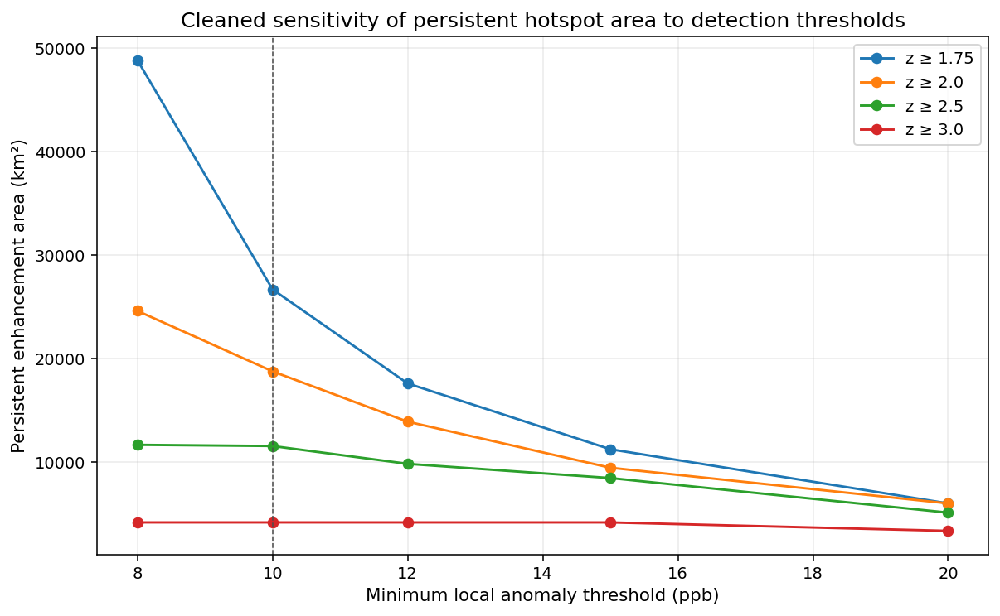

In [30]:
def clean_detection_stack(det0, min_cells=None):
    """Apply the same monthly connected-component cleaning used in the main detector."""
    if min_cells is None:
        min_cells = MIN_CLUSTER_CELLS
    out = np.zeros_like(det0, dtype=bool)
    for t in range(det0.shape[0]):
        lab, n = label(det0[t].astype(bool), structure=CONNECTIVITY)
        for ridx in range(1, n + 1):
            m = lab == ridx
            if int(m.sum()) >= min_cells:
                out[t] |= m
    return out

def compute_persistence_with_threshold(det_alt, valid_stack, month_list, fenh_threshold, hotspot_filter=None):
    Nm, Ne, F, _ = compute_persistence(det_alt, valid_stack, month_list, hotspot_filter)
    pm = INDIA_MASK & (Nm >= PERSISTENCE_MIN_MONTHS) & (F >= fenh_threshold)
    return Nm, Ne, F, pm

def sensitivity_analysis(z_values=[1.75, 2.0, 2.5, 3.0], anomaly_values=[8, 10, 12, 15, 20], fenh_values=[0.25, 0.35, 0.50, 0.60]):
    rows = []
    z_stack, _ = load_stack("z_score", stack_months)
    for zt in z_values:
        for at in anomaly_values:
            det_alt_raw = (z_stack >= zt) & (anom_stack >= at) & valid_stack & INDIA_MASK
            det_alt = clean_detection_stack(det_alt_raw, MIN_CLUSTER_CELLS)
            monthly_areas = [np.nansum(AREA_KM2[det_alt[t]]) for t in range(det_alt.shape[0])]
            for ft in fenh_values:
                Nm, Ne, F, pm = compute_persistence_with_threshold(det_alt, valid_stack, stack_months, ft, hfilter)
                rows.append({
                    "z_threshold": zt,
                    "anomaly_threshold_ppb": at,
                    "F_enh_threshold": ft,
                    "persistent_min_months": PERSISTENCE_MIN_MONTHS,
                    "monthly_mean_detected_area_km2": float(np.nanmean(monthly_areas)),
                    "monthly_median_detected_area_km2": float(np.nanmedian(monthly_areas)),
                    "persistent_area_km2": float(np.nansum(AREA_KM2[pm])),
                    "persistent_cells": int(np.nansum(pm)),
                })
    return pd.DataFrame(rows)

sens = sensitivity_analysis()
sens.to_csv(f"{OUT_TABLES}/threshold_sensitivity_analysis_cleaned.csv", index=False)
display(sens)

fig, ax = plt.subplots(figsize=(8.5, 5.2), constrained_layout=True)
for zt in sorted(sens.z_threshold.unique()):
    sub = sens[(sens.z_threshold == zt) & (sens.F_enh_threshold == PERSISTENCE_FENH_MIN)]
    ax.plot(sub["anomaly_threshold_ppb"], sub["persistent_area_km2"], marker="o", label=f"z ≥ {zt}")
ax.axvline(MIN_ANOMALY_PPB, color="0.3", lw=0.8, ls="--")
ax.set_xlabel("Minimum local anomaly threshold (ppb)")
ax.set_ylabel("Persistent enhancement area (km²)")
ax.set_title("Cleaned sensitivity of persistent hotspot area to detection thresholds")
ax.grid(True, alpha=0.25)
ax.legend()
fig.savefig(f"{OUT_FIGS}/threshold_sensitivity_persistent_area_cleaned.png", bbox_inches="tight")
plt.show()


## 26. Annual TROPOMI panels

Create annual maps of XCH₄, local anomaly, and hotspot frequency for comparison across years.


Annual TROPOMI years available: [2019, 2020, 2021, 2022, 2023, 2024, 2025]


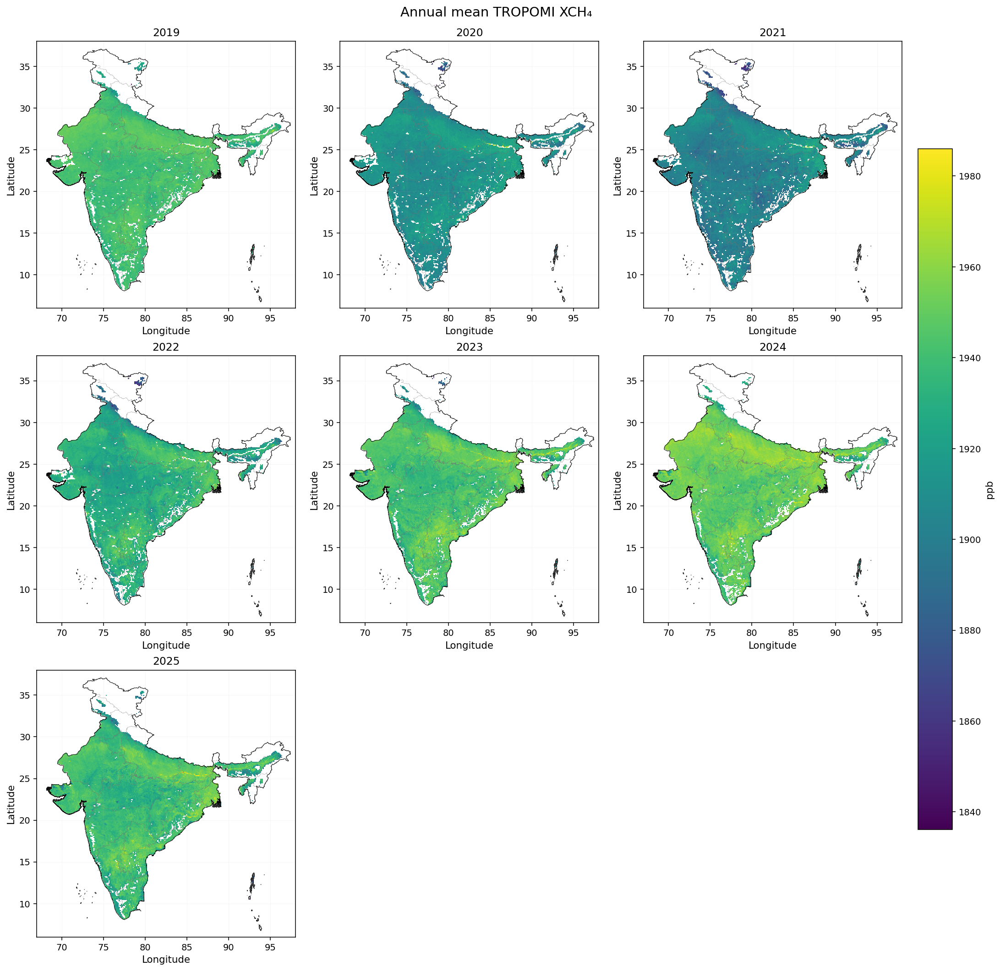

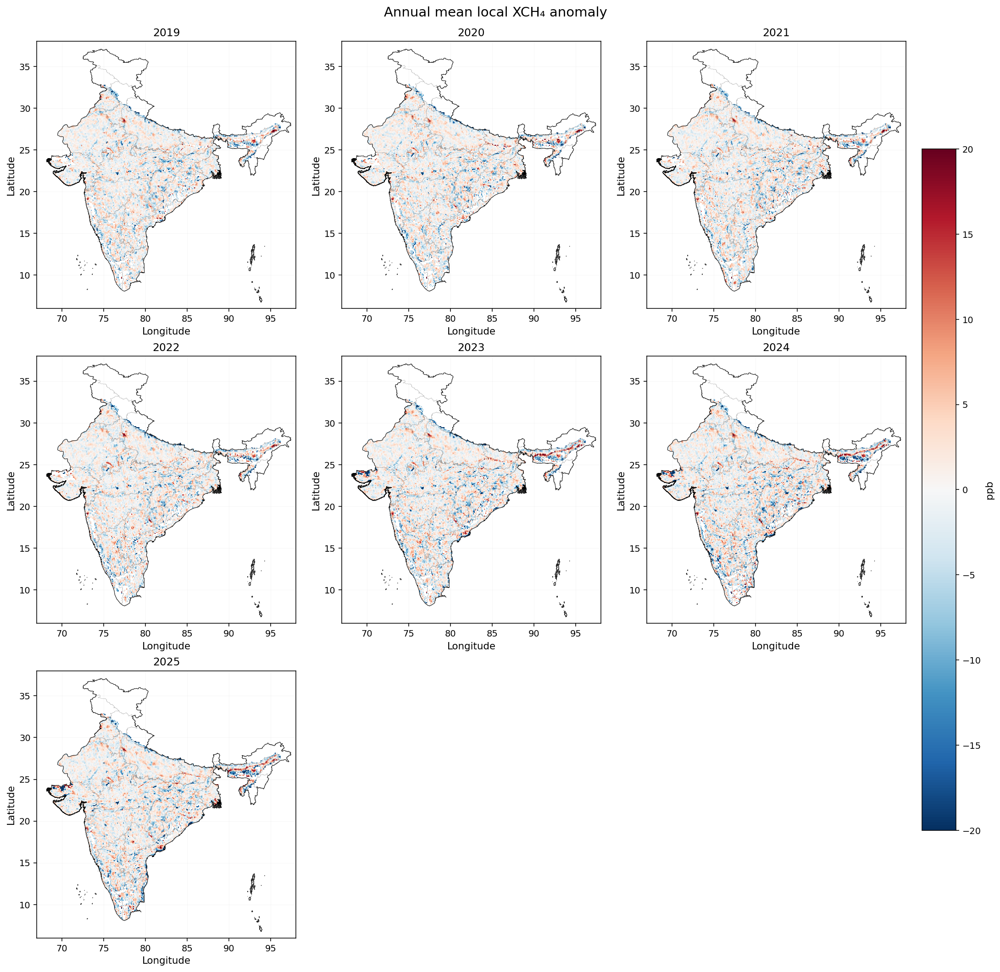

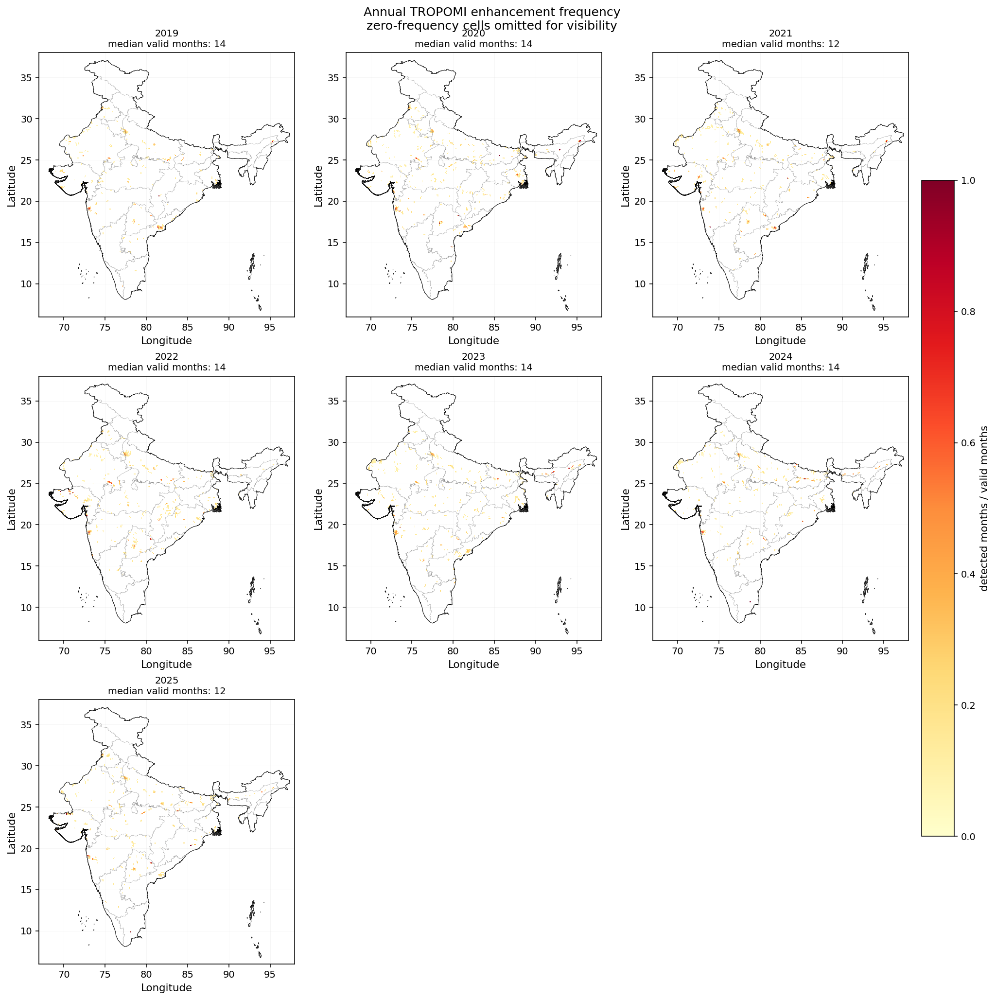

In [31]:

ANALYSIS_YEARS = list(range(2019, YEAR_END + 1))

def annual_tropomi_summary(year):
    idx = np.where(years == year)[0]
    if len(idx) == 0:
        return None
    x = np.nanmean(xch4_stack[idx], axis=0)
    a = np.nanmean(anom_stack[idx], axis=0)
    v = valid_stack[idx].astype(bool)
    d = det_stack[idx].astype(bool) & v
    n_valid = np.sum(v, axis=0)
    n_det = np.sum(d, axis=0)
    f = np.full((nLat, nLon), np.nan, dtype=np.float32)
    ok = INDIA_MASK & (n_valid > 0)
    f[ok] = n_det[ok] / n_valid[ok]
    return {"xch4": x, "anomaly": a, "freq": f, "n_valid": n_valid, "n_detected": n_det}

annual_tropomi = {y: annual_tropomi_summary(y) for y in ANALYSIS_YEARS}
annual_tropomi = {y:v for y,v in annual_tropomi.items() if v is not None}
print("Annual TROPOMI years available:", list(annual_tropomi.keys()))

plot_year_panel({y:annual_tropomi[y]["xch4"] for y in annual_tropomi},
                "Annual mean TROPOMI XCH₄", "ppb", "viridis", fname="annual_tropomi_xch4_panel", ncols=3)

all_anom_vals = np.concatenate([annual_tropomi[y]["anomaly"][INDIA_MASK & np.isfinite(annual_tropomi[y]["anomaly"])] for y in annual_tropomi])
lim_a = np.nanpercentile(np.abs(all_anom_vals), 98) if all_anom_vals.size else 40
lim_a = max(20, min(80, lim_a))
plot_year_panel({y:annual_tropomi[y]["anomaly"] for y in annual_tropomi},
                "Annual mean local XCH₄ anomaly", "ppb", "RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim_a, vmax=lim_a), fname="annual_tropomi_anomaly_panel", ncols=3)


def plot_annual_frequency_panel(year_to_freq, year_to_nvalid=None, title="Annual TROPOMI enhancement frequency", fname="annual_tropomi_enhancement_frequency_visible", ncols=3):
    yrs = [y for y in sorted(year_to_freq) if year_to_freq[y] is not None]
    if not yrs:
        print("No annual frequency maps to plot.")
        return
    positive_vals = np.concatenate([year_to_freq[y][INDIA_MASK & np.isfinite(year_to_freq[y]) & (year_to_freq[y] > 0)] for y in yrs])
    vmax = float(np.nanpercentile(positive_vals, 99)) if positive_vals.size else 1.0
    vmax = max(0.20, min(1.0, vmax))
    ncols = min(ncols, len(yrs)); nrows = int(math.ceil(len(yrs)/ncols))
    fig, axs = plt.subplots(nrows, ncols, figsize=(4.9*ncols, 4.75*nrows), constrained_layout=True)
    axs = np.atleast_1d(axs).ravel()
    last_im = None
    for ax, y in zip(axs, yrs):
        arr = np.where(INDIA_MASK, year_to_freq[y], np.nan)
        # Hide zero-frequency cells so annual detections are visible.
        arr = np.where(arr > 0, arr, np.nan)
        last_im = ax.pcolormesh(lon_edges, lat_edges, arr, shading="auto", cmap="YlOrRd", vmin=0, vmax=vmax)
        add_boundary(ax, lw=0.55, state_lw=0.18)
        if year_to_nvalid is not None:
            med_valid = np.nanmedian(year_to_nvalid[y][INDIA_MASK])
            ax.set_title(f"{y}\nmedian valid months: {med_valid:.0f}", fontsize=10)
        else:
            ax.set_title(str(y), fontsize=10)
    for ax in axs[len(yrs):]:
        ax.axis("off")
    fig.suptitle(title + "\nzero-frequency cells omitted for visibility", y=1.02, fontsize=13)
    cb = fig.colorbar(last_im, ax=axs[:len(yrs)], shrink=0.72, pad=0.014)
    cb.set_label("detected months / valid months")
    fig.savefig(f"{OUT_FIGS}/{fname}.png", bbox_inches="tight", dpi=300)
    plt.show()

plot_annual_frequency_panel({y:annual_tropomi[y]["freq"] for y in annual_tropomi},
                            {y:annual_tropomi[y]["n_valid"] for y in annual_tropomi},
                            fname="annual_tropomi_enhancement_frequency_visible_panel", ncols=3)


## 27. EDGAR CH₄ processing

Load EDGAR methane flux and emissions, clip them to India, and prepare annual summaries for comparison.


EDGAR 2019: 2 file(s)
 - EDGAR_2025_GHG_CH4_2019_TOTALS_emi.nc | sector: TOTALS
 - EDGAR_2025_GHG_CH4_2019_TOTALS_flx.nc | sector: TOTALS
EDGAR 2020: 2 file(s)
 - EDGAR_2025_GHG_CH4_2020_TOTALS_emi.nc | sector: TOTALS
 - EDGAR_2025_GHG_CH4_2020_TOTALS_flx.nc | sector: TOTALS
EDGAR 2021: 2 file(s)
 - EDGAR_2025_GHG_CH4_2021_TOTALS_emi.nc | sector: TOTALS
 - EDGAR_2025_GHG_CH4_2021_TOTALS_flx.nc | sector: TOTALS
EDGAR 2022: 2 file(s)
 - EDGAR_2025_GHG_CH4_2022_TOTALS_emi.nc | sector: TOTALS
 - EDGAR_2025_GHG_CH4_2022_TOTALS_flx.nc | sector: TOTALS
EDGAR 2023: 2 file(s)
 - EDGAR_2025_GHG_CH4_2023_TOTALS_emi.nc | sector: TOTALS
 - EDGAR_2025_GHG_CH4_2023_TOTALS_flx.nc | sector: TOTALS
EDGAR 2024: 2 file(s)
 - EDGAR_2025_GHG_CH4_2024_TOTALS_emi.nc | sector: TOTALS
 - EDGAR_2025_GHG_CH4_2024_TOTALS_flx.nc | sector: TOTALS
EDGAR years loaded: [2019, 2020, 2021, 2022, 2023, 2024]


,year,file,sector_guess,variable,units,unit_action
0,2019,EDGAR_2025_GHG_CH4_2019_TOTALS_emi.nc,TOTALS,emissions,Tonnes,tonnes_cell_yr-1_to_flux
1,2019,EDGAR_2025_GHG_CH4_2019_TOTALS_flx.nc,TOTALS,fluxes,kg m-2 s-1,kg_m-2_s-1
2,2020,EDGAR_2025_GHG_CH4_2020_TOTALS_emi.nc,TOTALS,emissions,Tonnes,tonnes_cell_yr-1_to_flux
3,2020,EDGAR_2025_GHG_CH4_2020_TOTALS_flx.nc,TOTALS,fluxes,kg m-2 s-1,kg_m-2_s-1
4,2021,EDGAR_2025_GHG_CH4_2021_TOTALS_emi.nc,TOTALS,emissions,Tonnes,tonnes_cell_yr-1_to_flux
5,2021,EDGAR_2025_GHG_CH4_2021_TOTALS_flx.nc,TOTALS,fluxes,kg m-2 s-1,kg_m-2_s-1
6,2022,EDGAR_2025_GHG_CH4_2022_TOTALS_emi.nc,TOTALS,emissions,Tonnes,tonnes_cell_yr-1_to_flux
7,2022,EDGAR_2025_GHG_CH4_2022_TOTALS_flx.nc,TOTALS,fluxes,kg m-2 s-1,kg_m-2_s-1
8,2023,EDGAR_2025_GHG_CH4_2023_TOTALS_emi.nc,TOTALS,emissions,Tonnes,tonnes_cell_yr-1_to_flux
9,2023,EDGAR_2025_GHG_CH4_2023_TOTALS_flx.nc,TOTALS,fluxes,kg m-2 s-1,kg_m-2_s-1


,year,edgar_total_CH4_Tg_yr,mean_flux_mg_m2_day,median_flux_mg_m2_day,p95_cell_emission_Gg_yr,p99_cell_emission_Gg_yr,top_5pct_cell_count,share_from_top_10pct_cells,emission_gini_weighted_by_area,n_files_used,india_total_sen_slope_Tg_yr_per_year
0,2019,55.631655,44.888951,13.601660,3.024439,11.344577,1462,0.686428,0.767875,2,1.166072
1,2020,56.094057,45.274368,13.811003,3.089096,11.412420,1462,0.683394,0.765861,2,1.166072
2,2021,57.033016,46.040615,13.879421,3.119085,11.844665,1462,0.686456,0.768195,2,1.166072
3,2022,58.426200,47.180948,14.047442,3.186013,12.553003,1462,0.689428,0.770491,2,1.166072
4,2023,60.089771,48.527097,14.275736,3.222450,13.281414,1462,0.693390,0.773116,2,1.166072
5,2024,61.037588,49.305578,14.469089,3.283364,13.670250,1462,0.693228,0.773234,2,1.166072


,state,year,edgar_CH4_Tg_yr,area_km2
186,TN,2019,19.632598,131274.732803
210,UP,2019,4.004302,240994.993237
6,AP,2019,3.129081,164726.032691
216,WB,2019,2.804248,84995.805110
120,MH,2019,2.747767,309139.355545
138,MP,2019,2.555033,313227.649154
66,GJ,2019,2.530262,187779.965465
174,RJ,2019,2.008146,345014.970907
198,TS,2019,1.959160,113327.369734
84,JH,2019,1.894254,80705.321701


,year,sector_guess,CH4_Tg_yr
0,2019,TOTALS,55.631655
1,2020,TOTALS,56.094057
2,2021,TOTALS,57.033016
3,2022,TOTALS,58.426200
4,2023,TOTALS,60.089771
5,2024,TOTALS,61.037588


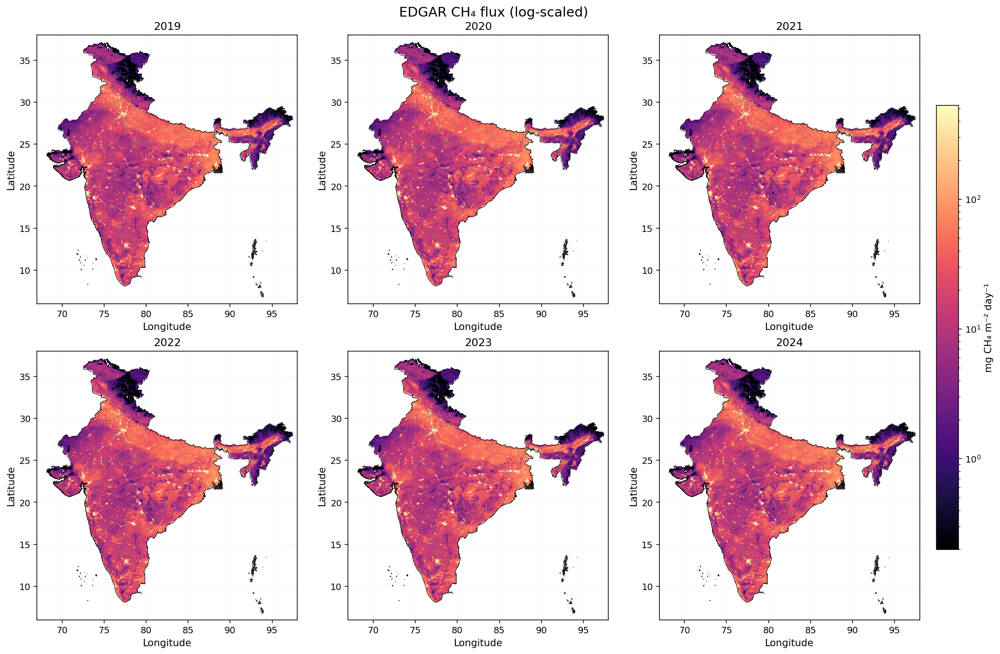

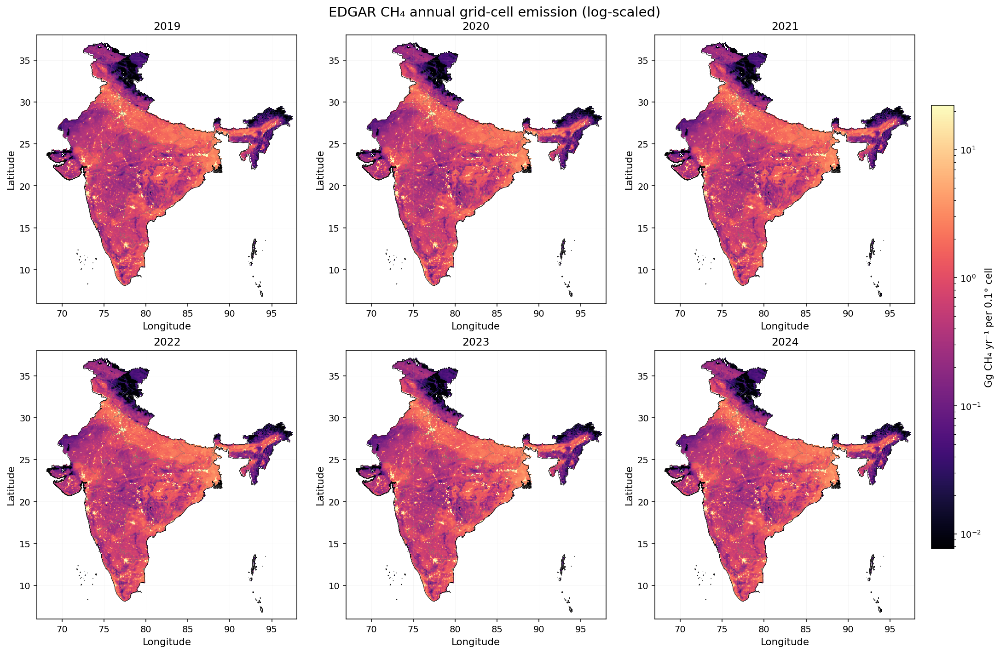

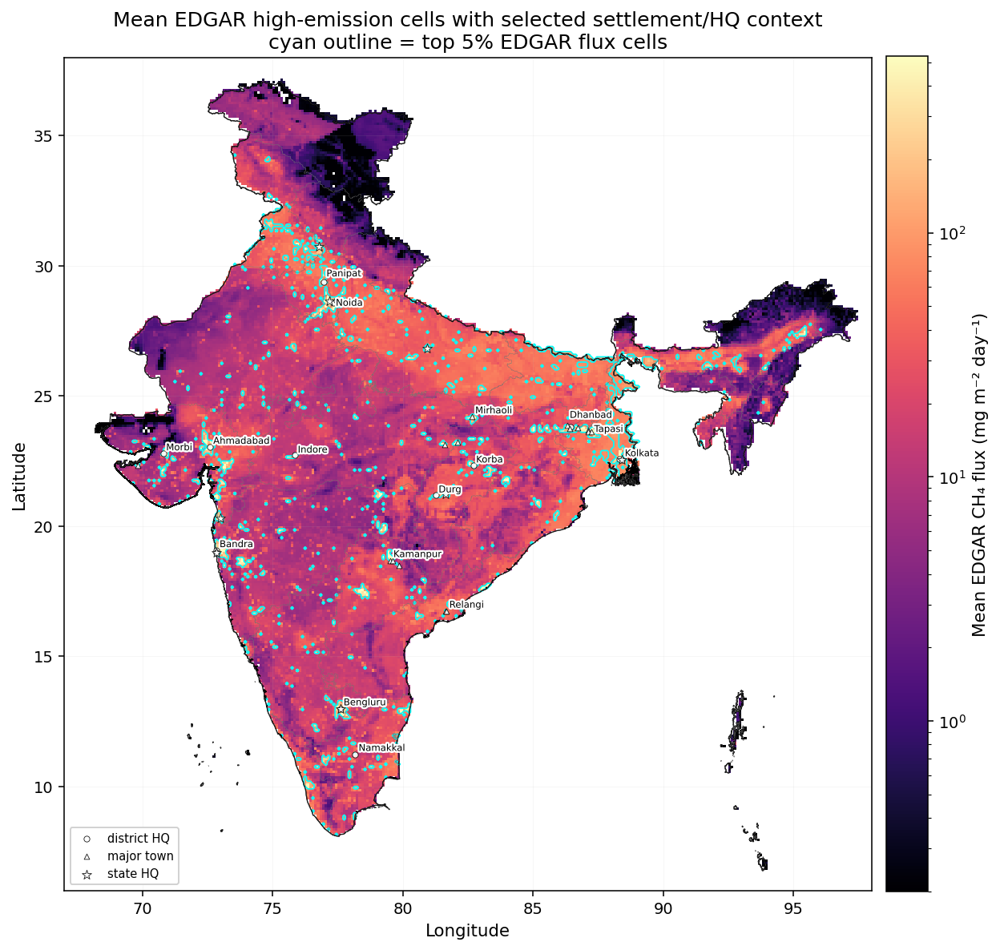

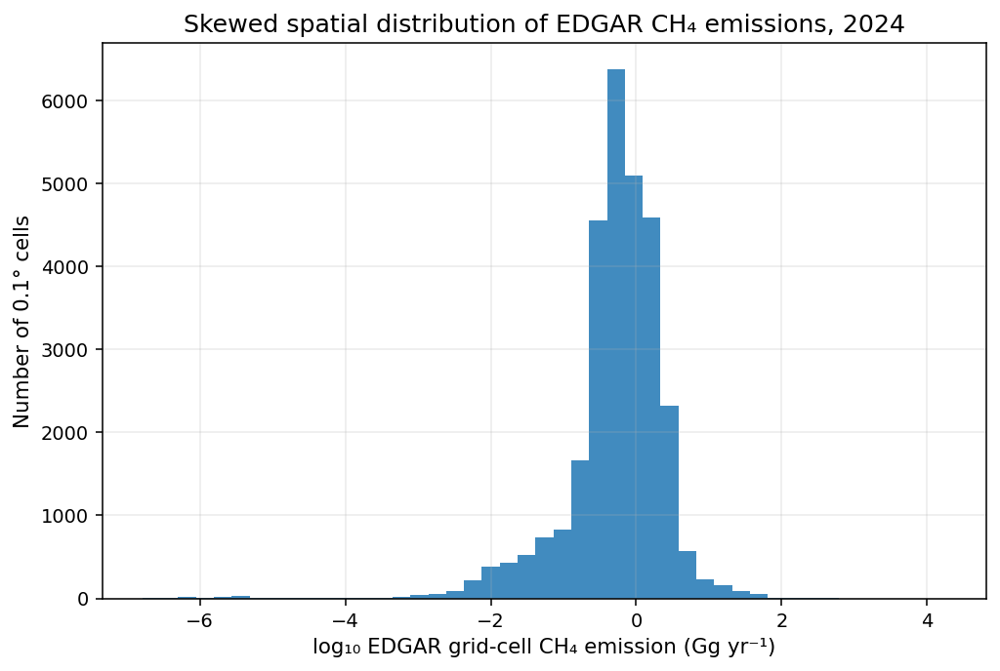

In [32]:
SECONDS_PER_YEAR = 365.25 * 24 * 3600
AREA_M2 = AREA_KM2 * 1e6
EDGAR_ANALYSIS_YEARS = list(range(2019, min(YEAR_END, 2024) + 1))  # EDGAR may not yet have 2025; code will auto-skip if missing.


def extract_edgar_zips_if_needed():
    if not os.path.exists(EDGAR_DIR):
        return []
    cache = os.path.join(EDGAR_DIR, "_extracted_for_v15")
    os.makedirs(cache, exist_ok=True)
    zips = glob.glob(os.path.join(EDGAR_DIR, "**", "*.zip"), recursive=True)
    extracted = []
    for zpath in zips:
        target = os.path.join(cache, Path(zpath).stem)
        os.makedirs(target, exist_ok=True)
        try:
            if not glob.glob(os.path.join(target, "**", "*"), recursive=True):
                with zipfile.ZipFile(zpath) as z:
                    z.extractall(target)
            extracted.append(target)
        except Exception as e:
            print("Could not extract EDGAR zip:", zpath, e)
    return extracted


def all_edgar_files():
    if not os.path.exists(EDGAR_DIR):
        return []
    extract_edgar_zips_if_needed()
    exts = ["*.nc", "*.nc4", "*.cdf", "*.tif", "*.tiff"]
    files = []
    for ext in exts:
        files.extend(glob.glob(os.path.join(EDGAR_DIR, "**", ext), recursive=True))
    files = sorted(set(files))
    # Keep methane files, avoid obvious CO2/N2O files.
    return [f for f in files if re.search(r"ch4|methane", os.path.basename(f), flags=re.I) and not re.search(r"co2|n2o", os.path.basename(f), flags=re.I)]


def infer_edgar_sector(path):
    b = os.path.basename(path)
    # EDGAR filenames often contain sector between gas and year; keep a readable token.
    low = b.lower()
    if re.search(r"total|totals", low): return "TOTALS"
    sector_keywords = {
        "agriculture": ["agr", "agri", "livestock", "enteric", "manure", "rice"],
        "waste": ["waste", "solid", "landfill", "wwt", "wastewater"],
        "energy": ["fuel", "oil", "gas", "coal", "ene", "power", "fugit"],
        "biomass_burning": ["fire", "burn", "gfed"],
        "other": ["ind", "ipr", "solvents"]
    }
    for sec, keys in sector_keywords.items():
        if any(k in low for k in keys): return sec
    return "unknown_sector"


def find_edgar_year_files(year):
    files = all_edgar_files()
    yr = str(year)
    cand = [f for f in files if yr in os.path.basename(f)]
    totals = [f for f in cand if re.search(r"total|totals", os.path.basename(f), flags=re.I)]
    # Use TOTALS to avoid double counting. If absent, sum sector files.
    return sorted(totals if totals else cand)


def pick_edgar_variable(ds):
    candidates = []
    for v in ds.data_vars:
        da = ds[v]
        if da.ndim < 2:
            continue
        name = v.lower()
        attrs = " ".join(str(da.attrs.get(k, "")) for k in ["long_name", "standard_name", "units"]).lower()
        score = 0
        if "ch4" in name or "methane" in name or "ch4" in attrs or "methane" in attrs: score += 3
        if any(k in name for k in ["emi", "emission", "flux"]): score += 2
        if any(k in attrs for k in ["emission", "flux"]): score += 1
        candidates.append((score, v))
    if not candidates:
        raise ValueError("No usable EDGAR variable found")
    candidates.sort(reverse=True)
    return candidates[0][1]


def standardize_latlon_names(ds):
    ren = {}
    for name in list(ds.coords) + list(ds.dims):
        low = str(name).lower()
        if low in ["latitude", "lat", "y"] and name != "lat": ren[name] = "lat"
        if low in ["longitude", "lon", "x"] and name != "lon": ren[name] = "lon"
    if ren:
        ds = ds.rename(ren)
    return ds


def convert_edgar_units_to_flux(arr, units, source_path=""):
    """Return flux kg CH4 m-2 s-1; handles common EDGAR and raster-export unit variants."""
    u0 = units or ""
    u = u0.lower().replace("**", "^").replace(" ", "").replace("−", "-")
    a = np.array(arr, dtype=float)
    a[a < 0] = np.nan
    # Already flux: kg m-2 s-1 or kg/m2/s
    if (("kg" in u and ("m-2" in u or "m^-2" in u or "/m2" in u) and ("s-1" in u or "s^-1" in u or "/s" in u)) or "kg/m2/s" in u):
        return a, "kg_m-2_s-1"
    # kg m-2 yr-1
    if "kg" in u and ("m-2" in u or "m^-2" in u or "/m2" in u) and any(k in u for k in ["yr-1", "year-1", "/yr", "/year"]):
        return a / SECONDS_PER_YEAR, "kg_m-2_yr-1_to_flux"
    # tonnes/grid/year or tonne per cell per year
    if any(k in u for k in ["ton", "tonne", "t/yr", "tgrid", "tcell"]):
        return (a * 1000.0) / (AREA_M2 * SECONDS_PER_YEAR), "tonnes_cell_yr-1_to_flux"
    # kg/year per grid cell
    if "kg" in u and any(k in u for k in ["yr", "year"] ) and not any(k in u for k in ["m-2", "m^-2", "/m2"]):
        return a / (AREA_M2 * SECONDS_PER_YEAR), "kg_cell_yr-1_to_flux"
    # mol units (rare for EDGAR exports); CH4 molar mass 16.04 g/mol
    if "mol" in u and ("m-2" in u or "m^-2" in u or "/m2" in u) and ("s-1" in u or "s^-1" in u or "/s" in u):
        return a * 0.01604, "mol_m-2_s-1_to_flux"
    print(f"⚠️ Unrecognized EDGAR units in {os.path.basename(source_path)}: {u0!r}. Assuming kg m-2 s-1. Check metadata if totals look unrealistic.")
    return a, "assumed_kg_m-2_s-1"


def read_edgar_nc_to_grid(path):
    ds = xr.open_dataset(path)
    ds = standardize_latlon_names(ds)
    v = pick_edgar_variable(ds)
    da = ds[v]
    # Select/sum non-spatial dims cautiously. If a sector/time dimension exists with multiple slices, sum over it.
    for dim in list(da.dims):
        if dim not in ["lat", "lon"]:
            if da.sizes.get(dim, 1) == 1:
                da = da.isel({dim: 0})
            else:
                # EDGAR annual data should not have multi-time dimensions, but if it does, sum only sector-like dims and mean time-like dims.
                if "time" in dim.lower() or "year" in dim.lower():
                    da = da.mean(dim)
                else:
                    da = da.sum(dim)
    if "lon" not in da.dims or "lat" not in da.dims:
        raise ValueError(f"Cannot find lat/lon dims in {path}; dims={da.dims}")
    if float(da["lon"].max()) > 180:
        da = da.assign_coords(lon=(((da["lon"] + 180) % 360) - 180)).sortby("lon")
    if np.any(np.diff(da["lat"].values) < 0):
        da = da.sortby("lat")
    # EDGAR is usually 0.1°; nearest keeps native grid values aligned to analysis grid.
    da_i = da.interp(lon=lon_centers, lat=lat_centers, method="nearest")
    arr = da_i.values.astype(float)
    units = da.attrs.get("units", ds.attrs.get("units", ""))
    flux, unit_action = convert_edgar_units_to_flux(arr, units, path)
    ds.close()
    return flux, v, units, unit_action


def read_edgar_tif_to_grid(path):
    with rasterio.open(path) as src:
        # Reproject/resample to analysis grid in north-up orientation, then flip to notebook row orientation.
        dst_north = np.full((nLat, nLon), src.nodata if src.nodata is not None else np.nan, dtype=np.float32)
        dst_transform = from_bounds(LON_MIN, LAT_MIN, LON_MAX, LAT_MAX, nLon, nLat)
        reproject(source=rasterio.band(src, 1), destination=dst_north,
                  src_transform=src.transform, src_crs=src.crs or "EPSG:4326",
                  dst_transform=dst_transform, dst_crs="EPSG:4326", resampling=Resampling.nearest)
        arr = np.flipud(dst_north).astype(float)
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
        units = src.tags().get("units", "")
    flux, unit_action = convert_edgar_units_to_flux(arr, units, path)
    return flux, "tif_band1", units, unit_action


def read_edgar_year(year):
    files = find_edgar_year_files(year)
    print(f"EDGAR {year}: {len(files)} file(s)")
    for f in files[:10]: print(" -", os.path.basename(f), "| sector:", infer_edgar_sector(f))
    if not files:
        return None
    flux_sum = np.zeros((nLat, nLon), dtype=float)
    n = 0; meta = []
    sector_flux = {}
    for f in files:
        try:
            if f.lower().endswith((".tif", ".tiff")):
                flx, var, units, unit_action = read_edgar_tif_to_grid(f)
            else:
                flx, var, units, unit_action = read_edgar_nc_to_grid(f)
            flx = np.where(INDIA_MASK & np.isfinite(flx), flx, 0.0)
            flux_sum += flx
            sec = infer_edgar_sector(f)
            sector_flux[sec] = sector_flux.get(sec, np.zeros_like(flux_sum)) + flx
            n += 1
            meta.append({"year": year, "file": os.path.basename(f), "sector_guess": sec, "variable": var, "units": units, "unit_action": unit_action})
        except Exception as e:
            print("EDGAR read failed:", os.path.basename(f), e)
    if n == 0:
        return None
    flux_sum = np.where(INDIA_MASK, flux_sum, np.nan)
    emission_kg_yr = flux_sum * AREA_M2 * SECONDS_PER_YEAR
    sector_emis = {sec: flx * AREA_M2 * SECONDS_PER_YEAR for sec, flx in sector_flux.items()}
    return {"flux_kg_m2_s": flux_sum, "emission_kg_yr_cell": emission_kg_yr, "sector_emission_kg_yr_cell": sector_emis, "metadata": meta, "n_files": n}


def weighted_gini(values, weights=None):
    x = np.asarray(values, dtype=float)
    if weights is None:
        weights = np.ones_like(x)
    w = np.asarray(weights, dtype=float)
    ok = np.isfinite(x) & np.isfinite(w) & (x >= 0) & (w > 0)
    x = x[ok]; w = w[ok]
    if x.size == 0 or np.sum(x*w) == 0:
        return np.nan
    order = np.argsort(x)
    x = x[order]; w = w[order]
    cw = np.cumsum(w)
    cxw = np.cumsum(x*w)
    relw = cw / cw[-1]
    relx = cxw / cxw[-1]
    return float(1 - 2 * np.trapz(relx, relw))

edgar_by_year = {y: read_edgar_year(y) for y in EDGAR_ANALYSIS_YEARS}
edgar_by_year = {y:v for y,v in edgar_by_year.items() if v is not None}
print("EDGAR years loaded:", list(edgar_by_year.keys()))

# Metadata diagnostics
edgar_meta = []
for y, d in edgar_by_year.items():
    edgar_meta.extend(d["metadata"])
edgar_meta_df = pd.DataFrame(edgar_meta)
edgar_meta_df.to_csv(f"{OUT_TABLES}/edgar_file_metadata_diagnostics.csv", index=False)
display(edgar_meta_df.head(30))

# India-level EDGAR statistics
edgar_summary_rows = []
for y, d in edgar_by_year.items():
    emis = d["emission_kg_yr_cell"]
    flux = d["flux_kg_m2_s"]
    m = INDIA_MASK & np.isfinite(emis) & (emis >= 0)
    vals_gg = emis[m] / 1e6
    total_tg = np.nansum(vals_gg) / 1000.0
    top5_thresh = np.nanpercentile(vals_gg, 95) if vals_gg.size else np.nan
    top10_contribution = np.nansum(np.sort(vals_gg)[-max(1, int(0.10*len(vals_gg))):]) / np.nansum(vals_gg) if np.nansum(vals_gg) > 0 else np.nan
    edgar_summary_rows.append({
        "year": y,
        "edgar_total_CH4_Tg_yr": total_tg,
        "mean_flux_mg_m2_day": float(np.nanmean(flux[m] * 1e6 * 86400)),
        "median_flux_mg_m2_day": float(np.nanmedian(flux[m] * 1e6 * 86400)),
        "p95_cell_emission_Gg_yr": float(np.nanpercentile(vals_gg, 95)) if vals_gg.size else np.nan,
        "p99_cell_emission_Gg_yr": float(np.nanpercentile(vals_gg, 99)) if vals_gg.size else np.nan,
        "top_5pct_cell_count": int(np.sum(vals_gg >= top5_thresh)) if vals_gg.size else 0,
        "share_from_top_10pct_cells": float(top10_contribution),
        "emission_gini_weighted_by_area": weighted_gini(emis[m], AREA_M2[m]),
        "n_files_used": d["n_files"]
    })
edgar_summary = pd.DataFrame(edgar_summary_rows)
if len(edgar_summary) >= 2:
    x = edgar_summary["year"].values.astype(float)
    yv = edgar_summary["edgar_total_CH4_Tg_yr"].values.astype(float)
    ok = np.isfinite(yv)
    if ok.sum() >= 2:
        slope, intercept, lo, hi = stats.theilslopes(yv[ok], x[ok])
        edgar_summary["india_total_sen_slope_Tg_yr_per_year"] = slope
edgar_summary.to_csv(f"{OUT_TABLES}/edgar_india_ch4_totals_and_statistics.csv", index=False)
display(edgar_summary)

# Optional state-level EDGAR summary if states are available
if HAS_STATES and edgar_by_year:
    state_rows = []
    # rasterize state geometries one by one to current grid
    for idx, row in states_gdf.iterrows():
        geom = row.geometry
        sname_col = guess_name_column(states_gdf) or states_gdf.columns[0]
        sname = str(row.get(sname_col, f"state_{idx}"))
        st_north = rasterize([(geom, 1)], out_shape=(nLat, nLon), transform=transform, fill=0, dtype="uint8")
        st_mask = np.flipud(st_north).astype(bool) & INDIA_MASK
        if st_mask.sum() == 0:
            continue
        for y, d in edgar_by_year.items():
            total_tg = np.nansum(d["emission_kg_yr_cell"][st_mask]) / 1e9
            state_rows.append({"state": sname, "year": y, "edgar_CH4_Tg_yr": total_tg, "area_km2": float(np.nansum(AREA_KM2[st_mask]))})
    edgar_state_df = pd.DataFrame(state_rows)
    edgar_state_df.to_csv(f"{OUT_TABLES}/edgar_state_ch4_totals.csv", index=False)
    display(edgar_state_df.sort_values(["year", "edgar_CH4_Tg_yr"], ascending=[True, False]).head(20))

# Optional sector summary if sector files were used
sector_rows = []
for y, d in edgar_by_year.items():
    for sec, emis in d.get("sector_emission_kg_yr_cell", {}).items():
        sector_rows.append({"year": y, "sector_guess": sec, "CH4_Tg_yr": np.nansum(emis[INDIA_MASK]) / 1e9})
edgar_sector_df = pd.DataFrame(sector_rows)
edgar_sector_df.to_csv(f"{OUT_TABLES}/edgar_sector_guess_summary.csv", index=False)
display(edgar_sector_df.head(30))


# EDGAR map panels and distribution diagnostics (publication version)
if edgar_by_year:
    flux_maps = {y: edgar_by_year[y]["flux_kg_m2_s"] * 1e6 * 86400 for y in edgar_by_year}  # mg/m²/day
    emis_maps = {y: edgar_by_year[y]["emission_kg_yr_cell"] / 1e6 for y in edgar_by_year}  # Gg/yr/cell

    # EDGAR values are highly skewed. Log-normalized panels preserve national gradients while still showing hotspots.
    plot_year_panel(flux_maps, "EDGAR CH₄ flux (log-scaled)", "mg CH₄ m⁻² day⁻¹", "magma", fname="edgar_ch4_flux_panel_log", ncols=3, log_positive=True)
    plot_year_panel(emis_maps, "EDGAR CH₄ annual grid-cell emission (log-scaled)", "Gg CH₄ yr⁻¹ per 0.1° cell", "magma", fname="edgar_ch4_emission_panel_log", ncols=3, log_positive=True)

    mean_edgar_flux = np.nanmean(np.stack([edgar_by_year[y]["flux_kg_m2_s"] for y in edgar_by_year]), axis=0)
    mean_flux_mg = mean_edgar_flux * 1e6 * 86400
    vals = mean_flux_mg[INDIA_MASK & np.isfinite(mean_flux_mg) & (mean_flux_mg > 0)]
    if vals.size:
        hi_edgar = INDIA_MASK & (mean_edgar_flux >= np.nanpercentile(mean_edgar_flux[INDIA_MASK & np.isfinite(mean_edgar_flux)], 95))
        fig, ax = plt.subplots(figsize=(8.8, 9.4), constrained_layout=True)
        norm = LogNorm(vmin=max(np.nanpercentile(vals, 2), 1e-6), vmax=np.nanpercentile(vals, 99.5))
        pcolor_india(ax, mean_flux_mg, cmap="magma", norm=norm, label="Mean EDGAR CH₄ flux (mg m⁻² day⁻¹)")
        ax.contour(lon_centers, lat_centers, hi_edgar.astype(float), levels=[0.5], colors="cyan", linewidths=0.9)
        pts = context_points_for_mask(mask_arr=hi_edgar, value_arr=mean_edgar_flux, value_percentile=95,
                                      max_state_hq=8, max_district_hq=15, max_major_towns=15, include_state_hq=True, buffer_cells=8)
        plot_context_points(ax, pts, label_limit=16, fontsize=6.0, label_state_hq=False, min_label_sep_deg=0.65)
        ax.set_title("Mean EDGAR high-emission cells with selected settlement/HQ context\ncyan outline = top 5% EDGAR flux cells")
        fig.savefig(f"{OUT_FIGS}/edgar_high_flux_with_towns_hq_log_decluttered.png", bbox_inches="tight")
        plt.show()

        # Histogram / Lorenz-style concentration diagnostic for EDGAR grid emissions.
        latest_y = max(edgar_by_year)
        v = edgar_by_year[latest_y]["emission_kg_yr_cell"][INDIA_MASK]
        v = v[np.isfinite(v) & (v > 0)] / 1e6  # Gg/yr per cell
        if v.size:
            fig, ax = plt.subplots(figsize=(7.2, 4.8), constrained_layout=True)
            ax.hist(np.log10(v), bins=45, alpha=0.85)
            ax.set_xlabel("log₁₀ EDGAR grid-cell CH₄ emission (Gg yr⁻¹)")
            ax.set_ylabel("Number of 0.1° cells")
            ax.set_title(f"Skewed spatial distribution of EDGAR CH₄ emissions, {latest_y}")
            ax.grid(True, alpha=0.25)
            fig.savefig(f"{OUT_FIGS}/edgar_gridcell_emission_distribution_{latest_y}.png", bbox_inches="tight")
            plt.show()


## 28. TROPOMI–EDGAR comparison

Compare TROPOMI atmospheric methane patterns with EDGAR bottom-up methane emissions. The two datasets represent different quantities, so the comparison is contextual rather than direct validation.


,year,tropomi_variable,spearman_rho_logEDGAR,p_value,n_cells
0,2019,annual_mean_xch4,0.229045,2.530470e-272,23072
1,2019,annual_mean_local_anomaly,0.132340,3.693898e-89,22686
2,2019,annual_hotspot_frequency,0.051264,9.841078e-15,22776
3,2020,annual_mean_xch4,0.299870,0.000000e+00,23075
4,2020,annual_mean_local_anomaly,0.137946,1.103791e-96,22663
5,2020,annual_hotspot_frequency,0.069168,1.478714e-25,22770
6,2021,annual_mean_xch4,0.376573,0.000000e+00,23081
7,2021,annual_mean_local_anomaly,0.139232,1.354304e-98,22691
8,2021,annual_hotspot_frequency,0.054031,3.336223e-16,22780
9,2022,annual_mean_xch4,0.325871,0.000000e+00,23057


,decile,mean_anomaly_ppb,median_anomaly_ppb,mean_hotspot_freq,n,year
0,1,-2.341988,-0.893821,0.004960,2269,2019
1,2,-0.714399,-0.244287,0.001947,2269,2019
2,3,-0.655714,-0.388221,0.002288,2268,2019
3,4,-0.636315,-0.338082,0.002015,2269,2019
4,5,-0.537617,-0.251596,0.001968,2268,2019
5,6,-0.636075,-0.298462,0.001979,2269,2019
6,7,-0.278427,-0.054584,0.002192,2268,2019
7,8,0.159536,0.145044,0.003832,2269,2019
8,9,0.412330,0.262169,0.008517,2268,2019
9,10,0.755613,0.529890,0.012427,2269,2019


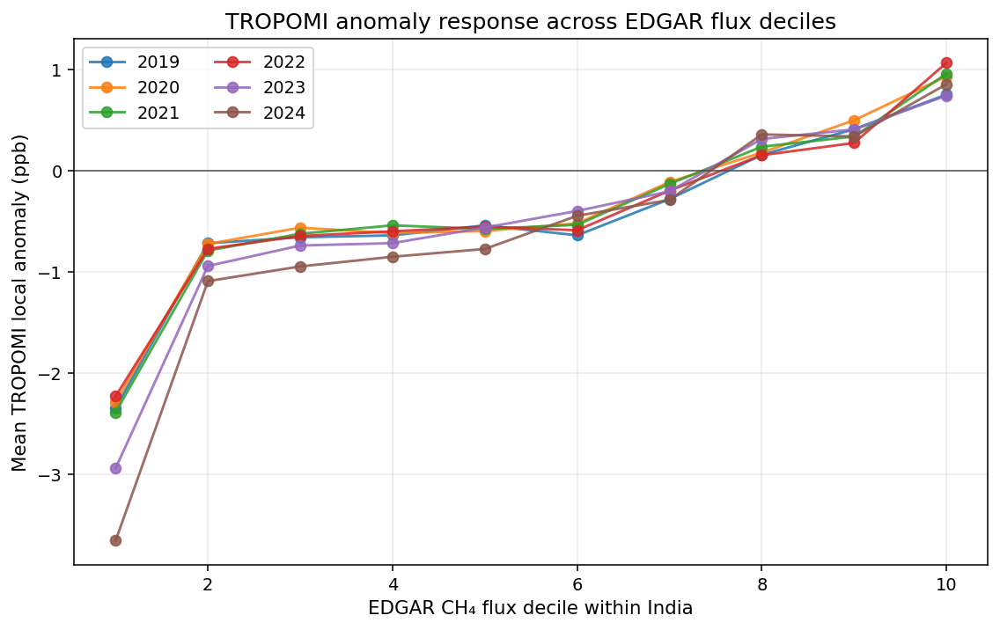

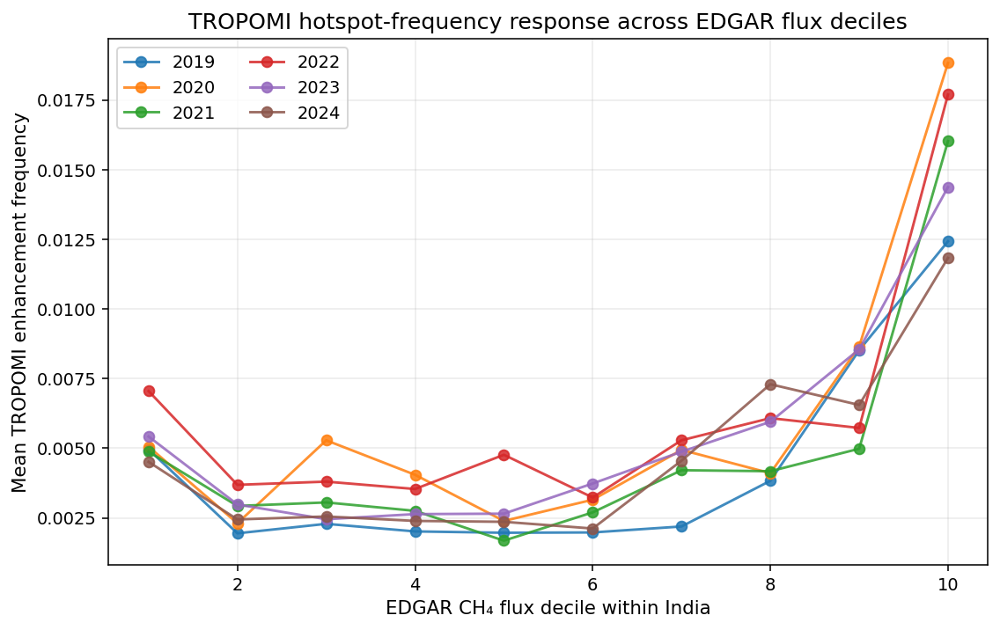

,common_years,top5_EDGAR_area_km2,top5_TROPOMI_frequency_area_km2,overlap_area_km2,overlap_share_of_EDGAR_top5,overlap_share_of_TROPOMI_top5
0,2019-2024,165591.334572,138837.246061,24109.08081,0.145594,0.17365


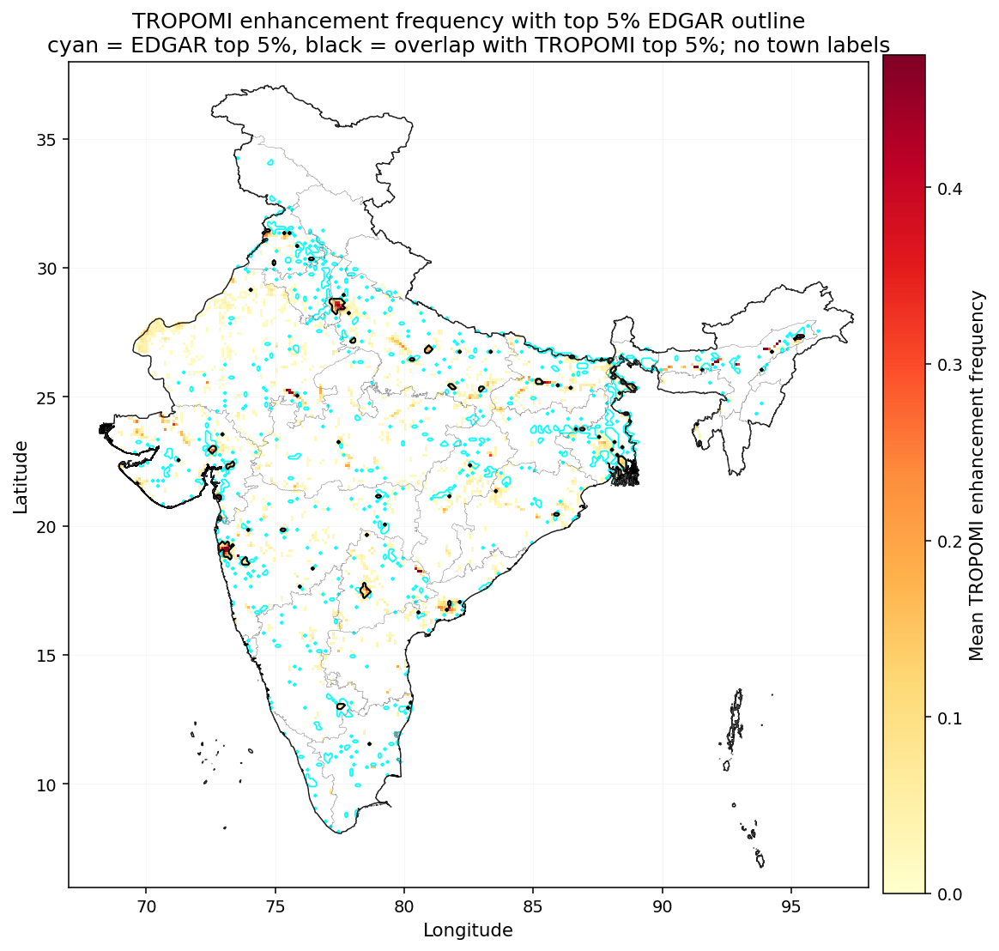

In [33]:
def safe_spearman(x, y):
    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 20:
        return np.nan, np.nan, int(m.sum())
    r, p = stats.spearmanr(x[m], y[m])
    return float(r), float(p), int(m.sum())

comp_rows = []
for y in sorted(set(annual_tropomi.keys()) & set(edgar_by_year.keys())):
    eflux = edgar_by_year[y]["flux_kg_m2_s"]
    loge = np.log10(np.where(eflux > 0, eflux, np.nan))
    a = annual_tropomi[y]["anomaly"]
    x = annual_tropomi[y]["xch4"]
    f = annual_tropomi[y]["freq"]
    base = INDIA_MASK & np.isfinite(eflux)
    for name, arr in [("annual_mean_xch4", x), ("annual_mean_local_anomaly", a), ("annual_hotspot_frequency", f)]:
        rho, p, n = safe_spearman(loge[base], arr[base])
        comp_rows.append({"year": y, "tropomi_variable": name, "spearman_rho_logEDGAR": rho, "p_value": p, "n_cells": n})
comp_df = pd.DataFrame(comp_rows)
comp_df.to_csv(f"{OUT_TABLES}/tropomi_edgar_spatial_spearman.csv", index=False)
display(comp_df)

# EDGAR decile analysis for local anomaly and hotspot frequency
rows = []
for y in sorted(set(annual_tropomi.keys()) & set(edgar_by_year.keys())):
    eflux = edgar_by_year[y]["flux_kg_m2_s"]
    a = annual_tropomi[y]["anomaly"]
    f = annual_tropomi[y]["freq"]
    m = INDIA_MASK & np.isfinite(eflux) & (eflux > 0) & np.isfinite(a)
    if m.sum() < 100:
        continue
    dec = pd.qcut(eflux[m].ravel(), 10, labels=False, duplicates="drop") + 1
    tmp = pd.DataFrame({"decile": dec, "anomaly": a[m].ravel(), "freq": f[m].ravel()})
    g = tmp.groupby("decile").agg(mean_anomaly_ppb=("anomaly", "mean"), median_anomaly_ppb=("anomaly", "median"), mean_hotspot_freq=("freq", "mean"), n=("anomaly", "size")).reset_index()
    g["year"] = y
    rows.append(g)
edgar_decile_df = pd.concat(rows, ignore_index=True) if rows else pd.DataFrame()
edgar_decile_df.to_csv(f"{OUT_TABLES}/edgar_decile_tropomi_response.csv", index=False)
display(edgar_decile_df.head(30))

if len(edgar_decile_df):
    fig, ax = plt.subplots(figsize=(8,5), constrained_layout=True)
    for y, sub in edgar_decile_df.groupby("year"):
        ax.plot(sub["decile"], sub["mean_anomaly_ppb"], marker="o", label=str(y), alpha=0.85)
    ax.axhline(0, color="0.3", lw=0.8)
    ax.set_xlabel("EDGAR CH₄ flux decile within India")
    ax.set_ylabel("Mean TROPOMI local anomaly (ppb)")
    ax.set_title("TROPOMI anomaly response across EDGAR flux deciles")
    ax.grid(True, alpha=0.25)
    ax.legend(ncol=2)
    fig.savefig(f"{OUT_FIGS}/edgar_decile_tropomi_anomaly_response.png", bbox_inches="tight")
    plt.show()

    fig, ax = plt.subplots(figsize=(8,5), constrained_layout=True)
    for y, sub in edgar_decile_df.groupby("year"):
        ax.plot(sub["decile"], sub["mean_hotspot_freq"], marker="o", label=str(y), alpha=0.85)
    ax.set_xlabel("EDGAR CH₄ flux decile within India")
    ax.set_ylabel("Mean TROPOMI enhancement frequency")
    ax.set_title("TROPOMI hotspot-frequency response across EDGAR flux deciles")
    ax.grid(True, alpha=0.25)
    ax.legend(ncol=2)
    fig.savefig(f"{OUT_FIGS}/edgar_decile_tropomi_frequency_response.png", bbox_inches="tight")
    plt.show()

# Overlay map for mean EDGAR vs TROPOMI frequency
if edgar_by_year:
    common_years = sorted(set(edgar_by_year.keys()) & set(annual_tropomi.keys()))
    if common_years:
        mean_edgar_flux = np.nanmean(np.stack([edgar_by_year[y]["flux_kg_m2_s"] for y in common_years]), axis=0)
        mean_trop_freq = np.nanmean(np.stack([annual_tropomi[y]["freq"] for y in common_years]), axis=0)
        hi_edgar = INDIA_MASK & (mean_edgar_flux >= np.nanpercentile(mean_edgar_flux[INDIA_MASK & np.isfinite(mean_edgar_flux)], 95))
        hi_trop = INDIA_MASK & np.isfinite(mean_trop_freq) & (mean_trop_freq >= np.nanpercentile(mean_trop_freq[INDIA_MASK & np.isfinite(mean_trop_freq)], 95))
        overlap = hi_edgar & hi_trop
        overlap_stats = pd.DataFrame([{
            "common_years": f"{min(common_years)}-{max(common_years)}",
            "top5_EDGAR_area_km2": float(np.nansum(AREA_KM2[hi_edgar])),
            "top5_TROPOMI_frequency_area_km2": float(np.nansum(AREA_KM2[hi_trop])),
            "overlap_area_km2": float(np.nansum(AREA_KM2[overlap])),
            "overlap_share_of_EDGAR_top5": float(np.nansum(AREA_KM2[overlap]) / np.nansum(AREA_KM2[hi_edgar])) if np.nansum(AREA_KM2[hi_edgar]) > 0 else np.nan,
            "overlap_share_of_TROPOMI_top5": float(np.nansum(AREA_KM2[overlap]) / np.nansum(AREA_KM2[hi_trop])) if np.nansum(AREA_KM2[hi_trop]) > 0 else np.nan,
        }])
        overlap_stats.to_csv(f"{OUT_TABLES}/tropomi_edgar_top5_overlap_stats.csv", index=False)
        display(overlap_stats)

        fig, ax = plt.subplots(figsize=(8.2,8.8), constrained_layout=True)
        visible_freq = np.where(mean_trop_freq > 0, mean_trop_freq, np.nan)
        vmax_freq = np.nanpercentile(visible_freq[INDIA_MASK & np.isfinite(visible_freq)], 99) if np.isfinite(visible_freq).any() else 1
        vmax_freq = max(0.20, min(1.0, float(vmax_freq)))
        pcolor_india(ax, visible_freq, cmap="YlOrRd", vmin=0, vmax=vmax_freq, label="Mean TROPOMI enhancement frequency")
        ax.contour(lon_centers, lat_centers, hi_edgar.astype(float), levels=[0.5], colors="cyan", linewidths=0.9)
        ax.contour(lon_centers, lat_centers, overlap.astype(float), levels=[0.5], colors="black", linewidths=1.15)
        ax.set_title("TROPOMI enhancement frequency with top 5% EDGAR outline\ncyan = EDGAR top 5%, black = overlap with TROPOMI top 5%; no town labels")
        fig.savefig(f"{OUT_FIGS}/tropomi_frequency_edgar_top5_overlay_no_towns.png", bbox_inches="tight", dpi=300)
        plt.show()


## 29. ERA5 wind and IME screening

Use ERA5 monthly wind speed to prepare IME-style screening estimates for detected enhancement clusters. These estimates are approximate and should be interpreted carefully.


Monthly IME screening:   0%|          | 0/168 [00:00<?, ?it/s]

,yyyymm,year,month,cluster_id_month,n_cells,area_km2,centroid_lat,centroid_lon,mean_anomaly_ppb,max_anomaly_ppb,...,Ueff_ms,Q_IME_screening_t_h,Q_low_t_h,Q_high_t_h,sustained_month_equiv_Gg,annualized_if_continuous_Tg_yr,wind_source,wind_note,low_wind_flag,monthly_composite_caution
0,201901,2019,1,1,2,243.751449,9.691892,77.150000,27.954407,32.487427,...,0.764537,6.782202,2.479377,11.085028,5.045959,0.059412,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
1,201901,2019,1,2,2,234.848140,18.250000,80.601221,19.977539,20.465210,...,0.497325,3.094666,1.131320,5.058011,2.302431,0.027109,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
2,201901,2019,1,3,4,468.878524,18.547900,73.874814,13.316925,14.293945,...,0.658096,3.857149,1.410062,6.304236,2.869719,0.033789,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
3,201901,2019,1,4,4,467.134575,19.169877,73.040394,17.055725,22.336792,...,1.001092,7.500953,2.742132,12.259773,5.580709,0.065708,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
4,201901,2019,1,5,2,233.531803,19.206040,79.393960,11.855286,13.287354,...,0.575189,2.117957,0.774264,3.461650,1.575760,0.018553,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
5,201901,2019,1,6,2,229.842004,21.650000,69.797927,12.272766,12.781616,...,1.310253,4.955072,1.811431,8.098712,3.686573,0.043406,era5_land_india_2019_01.nc,ERA5,False,IME screening only; monthly composite is not a...
6,201901,2019,1,7,2,229.037104,22.150000,72.202789,13.170227,13.904785,...,1.433530,5.807521,2.123062,9.491980,4.320796,0.050874,era5_land_india_2019_01.nc,ERA5,False,IME screening only; monthly composite is not a...
7,201901,2019,1,8,2,228.792143,22.299428,77.800572,16.496033,16.684814,...,0.746540,3.786105,1.384091,6.188119,2.816862,0.033166,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
8,201901,2019,1,9,2,227.628692,22.997253,72.597253,11.560730,12.195923,...,1.079923,3.828582,1.399619,6.257546,2.848465,0.033538,era5_land_india_2019_01.nc,ERA5,True,IME screening only; monthly composite is not a...
9,201901,2019,1,10,2,226.776844,23.500605,69.899395,11.743408,11.885620,...,1.167003,4.194701,1.533462,6.855940,3.120858,0.036746,era5_land_india_2019_01.nc,ERA5,False,IME screening only; monthly composite is not a...


,year,n_clusters,median_Q_t_h,sum_Q_t_h,sum_sustained_month_equiv_Gg,median_U10_ms,low_wind_fraction
0,2019,406,4.723198,2229.350615,1613.471245,1.104844,0.876847
1,2020,520,4.290701,2788.594202,2031.827554,0.864383,0.915385
2,2021,448,4.901848,2555.294363,1857.950018,1.063003,0.906250
3,2022,528,4.075523,2528.554915,1829.189464,0.751834,0.962121
4,2023,518,5.161080,3254.787965,2360.230881,1.130724,0.818533
5,2024,452,5.340111,2784.415788,2029.146969,1.124884,0.823009
6,2025,482,5.138896,3047.359158,2210.634095,1.022862,0.838174


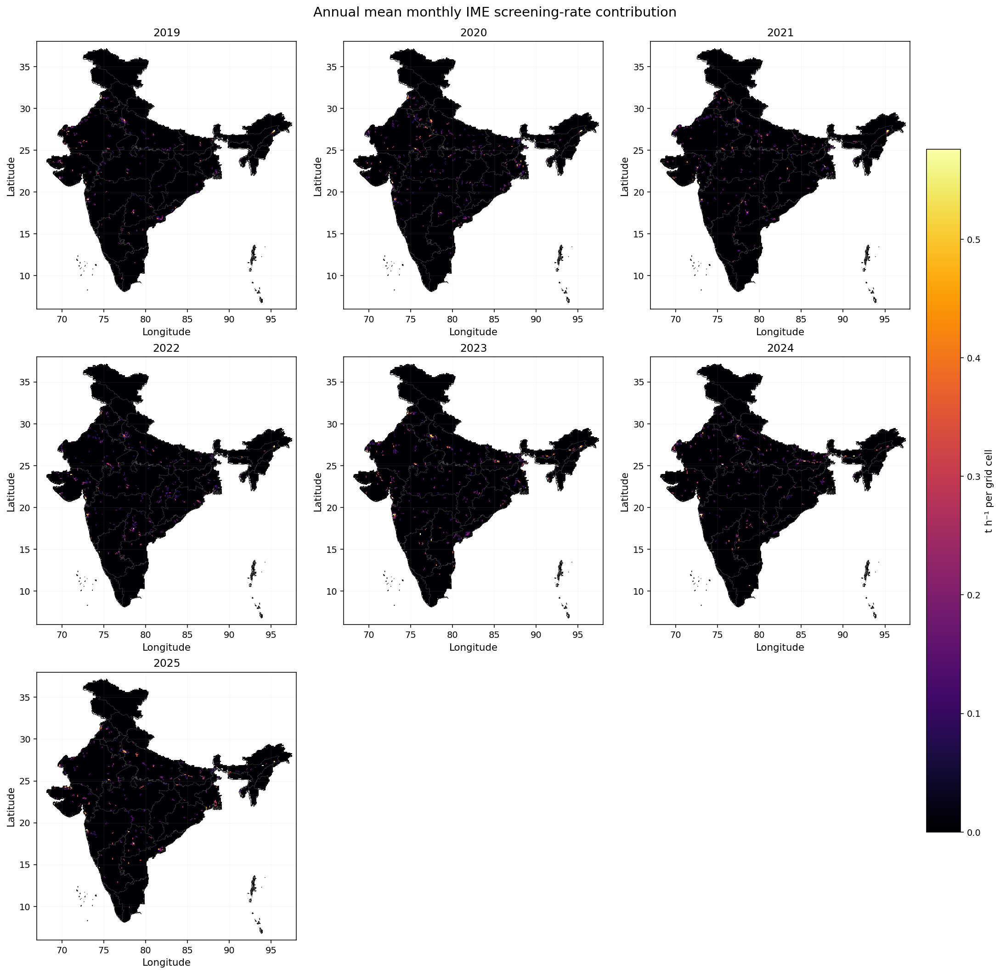

In [34]:
KG_M2_PER_PPB_XCH4 = (100000.0 / 9.80665) * (16.04 / 28.97) * 1e-9  # approx kg CH4 m-2 per ppb XCH4
USE_DEFAULT_WIND_IF_MISSING = True
DEFAULT_U10_MS = 3.0

def find_era5_file(year, month):
    if not os.path.exists(ERA5_DIR):
        return None
    pats = [f"*{year}{month:02d}*.nc", f"*{year}_{month:02d}*.nc", f"*{year}-{month:02d}*.nc", f"*{year}*.nc"]
    files = []
    for p in pats:
        files.extend(glob.glob(os.path.join(ERA5_DIR, "**", p), recursive=True))
    files = sorted(set(files))
    return files[0] if files else None

def pick_wind_vars(ds):
    names = list(ds.data_vars)
    lower = {n:n.lower() for n in names}
    u = next((n for n,l in lower.items() if l in ["u10", "10u", "u_component_of_wind_10m"] or "u10" in l), None)
    v = next((n for n,l in lower.items() if l in ["v10", "10v", "v_component_of_wind_10m"] or "v10" in l), None)
    return u, v

def read_era5_monthly_wind(year, month):
    f = find_era5_file(year, month)
    if f is None:
        if USE_DEFAULT_WIND_IF_MISSING:
            return np.full((nLat, nLon), DEFAULT_U10_MS, dtype=np.float32), "default", "ERA5 missing; default wind used"
        return np.full((nLat, nLon), np.nan, dtype=np.float32), "missing", "ERA5 missing"
    try:
        ds = xr.open_dataset(f)
        ds = standardize_latlon_names(ds)
        uvar, vvar = pick_wind_vars(ds)
        if uvar is None or vvar is None:
            raise ValueError(f"Could not identify u10/v10 in {os.path.basename(f)}; variables={list(ds.data_vars)}")
        u = ds[uvar]; v = ds[vvar]
        # select target month if a file contains many times
        for da_name in [uvar, vvar]:
            pass
        if "time" in u.dims:
            tt = pd.to_datetime(ds["time"].values)
            idx = np.where((tt.year == year) & (tt.month == month))[0]
            if len(idx):
                u = u.isel(time=idx).mean("time"); v = v.isel(time=idx).mean("time")
            else:
                u = u.mean("time"); v = v.mean("time")
        if "valid_time" in u.dims:
            tt = pd.to_datetime(ds["valid_time"].values)
            idx = np.where((tt.year == year) & (tt.month == month))[0]
            if len(idx):
                u = u.isel(valid_time=idx).mean("valid_time"); v = v.isel(valid_time=idx).mean("valid_time")
            else:
                u = u.mean("valid_time"); v = v.mean("valid_time")
        # Longitude conversion if needed
        if "lon" in u.coords and float(u["lon"].max()) > 180:
            u = u.assign_coords(lon=(((u["lon"] + 180) % 360) - 180)).sortby("lon")
            v = v.assign_coords(lon=(((v["lon"] + 180) % 360) - 180)).sortby("lon")
        if "lat" in u.coords and np.any(np.diff(u["lat"].values) < 0):
            u = u.sortby("lat"); v = v.sortby("lat")
        ui = u.interp(lon=lon_centers, lat=lat_centers, method="nearest")
        vi = v.interp(lon=lon_centers, lat=lat_centers, method="nearest")
        spd = np.sqrt(ui.values.astype(float)**2 + vi.values.astype(float)**2)
        ds.close()
        return np.where(INDIA_MASK, spd, np.nan).astype(np.float32), f, "ERA5"
    except Exception as e:
        print("ERA5 read failed:", f, e)
        if USE_DEFAULT_WIND_IF_MISSING:
            return np.full((nLat, nLon), DEFAULT_U10_MS, dtype=np.float32), "default", f"ERA5 read failed; default wind used: {e}"
        return np.full((nLat, nLon), np.nan, dtype=np.float32), "failed", str(e)

def ime_for_month(yyyymm, min_cells=MIN_CLUSTER_CELLS):
    d = read_monthly_nc(yyyymm)
    anom = d["anomaly_ppb"]
    det = d["detected"].astype(bool) & INDIA_MASK
    yr, mo = int(yyyymm[:4]), int(yyyymm[4:6])
    wind, wind_source, wind_note = read_era5_monthly_wind(yr, mo)
    lab, n = label(det, structure=CONNECTIVITY)
    rows = []
    q_grid = np.zeros((nLat, nLon), dtype=float)
    for ridx in range(1, n + 1):
        m = lab == ridx
        if m.sum() < min_cells:
            continue
        enh = np.where(m, np.maximum(anom, 0), 0.0)
        if np.nansum(enh) <= 0:
            continue
        area_m2 = float(np.nansum(AREA_M2[m]))
        ime_kg = float(np.nansum(enh * KG_M2_PER_PPB_XCH4 * AREA_M2))
        L_m = math.sqrt(max(area_m2, 1.0))
        u10 = float(np.nanmean(wind[m])) if np.isfinite(wind[m]).any() else np.nan
        ueff = 0.34 * u10 + 0.44 if np.isfinite(u10) else np.nan
        q_kg_s = ueff * ime_kg / L_m if np.isfinite(ueff) else np.nan
        q_t_h = q_kg_s * 3600.0 / 1000.0 if np.isfinite(q_kg_s) else np.nan
        # sustained-month equivalent only; not a verified monthly emission
        hours = pd.Period(yyyymm, freq="M").days_in_month * 24
        sustained_month_Gg = q_t_h * hours / 1000.0 if np.isfinite(q_t_h) else np.nan
        annualized_Tg_yr = q_t_h * 8760.0 / 1e6 if np.isfinite(q_t_h) else np.nan
        rel_unc = math.sqrt(0.50**2 + 0.30**2 + 0.25**2)  # wind + mask/background + column assumptions
        q_low = q_t_h * max(0, 1 - rel_unc) if np.isfinite(q_t_h) else np.nan
        q_high = q_t_h * (1 + rel_unc) if np.isfinite(q_t_h) else np.nan
        weights = enh / np.nansum(enh)
        q_grid += np.where(m, q_t_h * weights, 0.0)
        rows.append({
            "yyyymm": yyyymm, "year": yr, "month": mo, "cluster_id_month": ridx,
            "n_cells": int(m.sum()), "area_km2": area_m2/1e6,
            "centroid_lat": float(np.nansum(LAT2D * enh) / np.nansum(enh)),
            "centroid_lon": float(np.nansum(LON2D * enh) / np.nansum(enh)),
            "mean_anomaly_ppb": float(np.nanmean(anom[m])), "max_anomaly_ppb": float(np.nanmax(anom[m])),
            "IME_kg": ime_kg, "L_m": L_m, "ERA5_U10_ms": u10, "Ueff_ms": ueff,
            "Q_IME_screening_t_h": q_t_h, "Q_low_t_h": q_low, "Q_high_t_h": q_high,
            "sustained_month_equiv_Gg": sustained_month_Gg,
            "annualized_if_continuous_Tg_yr": annualized_Tg_yr,
            "wind_source": os.path.basename(wind_source) if isinstance(wind_source, str) else wind_source,
            "wind_note": wind_note,
            "low_wind_flag": bool(np.isfinite(u10) and u10 < 2.0),
            "monthly_composite_caution": "IME screening only; monthly composite is not an instantaneous plume"
        })
    return pd.DataFrame(rows), q_grid

ime_rows = []
ime_year_grids = {y: [] for y in ANALYSIS_YEARS}
for m in tqdm(stack_months, desc="Monthly IME screening"):
    y = int(m[:4])
    if y not in ANALYSIS_YEARS:
        continue
    try:
        dfm, gridm = ime_for_month(m)
        if len(dfm):
            ime_rows.append(dfm)
        ime_year_grids[y].append(gridm)
    except Exception as e:
        print("IME failed", m, e)

ime_df = pd.concat(ime_rows, ignore_index=True) if ime_rows else pd.DataFrame()
ime_df.to_csv(f"{OUT_TABLES}/monthly_cluster_IME_screening_estimates.csv", index=False)
display(ime_df.head(20))

if len(ime_df):
    ime_year_summary = ime_df.groupby("year").agg(
        n_clusters=("Q_IME_screening_t_h", "size"),
        median_Q_t_h=("Q_IME_screening_t_h", "median"),
        sum_Q_t_h=("Q_IME_screening_t_h", "sum"),
        sum_sustained_month_equiv_Gg=("sustained_month_equiv_Gg", "sum"),
        median_U10_ms=("ERA5_U10_ms", "median"),
        low_wind_fraction=("low_wind_flag", "mean")
    ).reset_index()
    ime_year_summary.to_csv(f"{OUT_TABLES}/yearly_IME_screening_summary.csv", index=False)
    display(ime_year_summary)

    annual_ime_maps = {y: np.nanmean(np.stack(ime_year_grids[y]), axis=0) if len(ime_year_grids[y]) else None for y in ANALYSIS_YEARS}
    annual_ime_maps = {y:v for y,v in annual_ime_maps.items() if v is not None}
    vals = np.concatenate([annual_ime_maps[y][INDIA_MASK & np.isfinite(annual_ime_maps[y])] for y in annual_ime_maps])
    vmax = float(np.nanpercentile(vals[vals>0], 98)) if np.any(vals>0) else None
    plot_year_panel(annual_ime_maps, "Annual mean monthly IME screening-rate contribution", "t h⁻¹ per grid cell", "inferno", vmin=0, vmax=vmax, fname="annual_IME_screening_rate_panel")


## 32. Notes for results interpretation

Use cautious language: TROPOMI measures column-averaged methane, not direct surface emissions. Hotspot regions should be interpreted as recurrent atmospheric enhancement areas.


## Older EDGAR placeholder

The final EDGAR workflow is implemented above. This placeholder is kept only to preserve notebook structure.


In [36]:
print("EDGAR analysis already completed in Section 27–28 above. This older placeholder cell is intentionally disabled.")

EDGAR analysis already completed in Section 27–28 above. This older placeholder cell is intentionally disabled.


## 27. Optional daily candidate-plume screening

This optional section screens daily candidate enhancements. It is exploratory and should not be treated as a full source-rate estimation workflow.


In [37]:
def process_day(date_str, z_thresh=3.0, min_anom=25.0, min_cells=2):
    date = pd.to_datetime(date_str).date()
    sub = file_index[file_index["date"] == date]
    if len(sub) == 0:
        raise ValueError(f"No files for {date_str}")
    total_sum = np.zeros((nLat, nLon), dtype=np.float64)
    total_sum2 = np.zeros((nLat, nLon), dtype=np.float64)
    total_count = np.zeros((nLat, nLon), dtype=np.int32)
    for path in sub["path"].values:
        obs = read_s5p_ch4_file(path)
        s, s2, c, _, _ = grid_observations(obs)
        total_sum += s; total_sum2 += s2; total_count += c
    mean, std, _ = finalize_grid(total_sum, total_sum2, total_count)
    valid = INDIA_MASK & TERRAIN_VALID_MASK & np.isfinite(mean) & (total_count >= 1)
    # Daily detection uses local background but stricter thresholds
    old_z, old_a = Z_THRESH, MIN_ANOMALY_PPB
    # reuse local_background directly to avoid changing globals
    xdet = apply_elevation_correction_for_detection(mean)
    bg, sig, cov = local_background_sigma(np.where(valid, xdet, np.nan), hpfa_deg=1.0, analysis_mask=valid)
    anom = xdet - bg
    z = anom / sig
    det = valid & np.isfinite(z) & (z >= z_thresh) & (anom >= min_anom)
    # remove tiny noise
    lab, n = label(det, structure=CONNECTIVITY)
    clean = np.zeros_like(det)
    for ridx in range(1, n+1):
        if (lab == ridx).sum() >= min_cells:
            clean |= lab == ridx
    cl = cluster_detected_regions(clean, anom, z, pd.to_datetime(date_str).strftime("%Y%m%d"))
    cl.to_csv(f"{OUT_DAILY}/daily_candidate_clusters_{date_str}.csv", index=False)
    return {"xch4_mean": mean, "anomaly_ppb": anom, "z_score": z, "detected": clean, "valid": valid}, cl

# Example:
daily_data, daily_clusters = process_day("2019-01-15")
display(daily_clusters)

,yyyymm,year,month,cluster_id_month,n_cells,area_km2,centroid_lat,centroid_lon,mean_anomaly_ppb,median_anomaly_ppb,max_anomaly_ppb,mean_z,max_z,broad_region_flag
0,20190115,2019,1,1,2,219.644329,27.350000,95.403084,77.945923,77.945923,82.753784,4.401037,4.685985,False
1,20190115,2019,1,2,2,219.545018,27.401861,95.701861,82.656311,82.656311,85.732666,3.963456,3.996370,False


## 28. Export results and reproducibility report

Export the main tables, figures, and a short reproducibility summary.


In [38]:
def write_methodology_summary():
    summary = {
        "project_dir": PROJECT_DIR,
        "s5p_dir": S5P_DIR,
        "output_dir": OUT_BASE,
        "date_created": datetime.datetime.now().isoformat(),
        "version": "Final v16",
        "grid": {"lat_min": LAT_MIN, "lat_max": LAT_MAX, "lon_min": LON_MIN, "lon_max": LON_MAX, "grid_res": GRID_RES},
        "time_span": {"start_year": YEAR_START, "end_year": YEAR_END, "processed_months": len(proc_months) if 'proc_months' in globals() else None},
        "qa_min": QA_MIN,
        "min_valid_days_month": MIN_VALID_DAYS_MONTH,
        "hpfa_deg_list": HPFA_DEG_LIST,
        "hpfa_min_coverage": HPFA_MIN_COVERAGE,
        "z_thresh": Z_THRESH,
        "min_anomaly_ppb": MIN_ANOMALY_PPB,
        "persistence_fenh_min": PERSISTENCE_FENH_MIN,
        "persistence_min_months": PERSISTENCE_MIN_MONTHS,
        "dem_used": HAS_DEM,
        "elevation_correction": APPLY_ELEVATION_CORRECTION and HAS_DEM,
        "fdr_alpha": FDR_ALPHA,
        "interpretation": "Outputs are XCH4 patterns/trends, candidate persistent enhancement regions, EDGAR context, LULC/town overlays, and IME screening estimates; not national methane emissions from TROPOMI alone.",
        "context_layers": {"state_hq": STATE_HQ_SHP, "district_hq": DISTRICT_HQ_SHP, "major_towns": MAJOR_TOWNS_SHP, "lulc_raster": LULC_RASTER},
        "lulc_known_class_table": LULC_KNOWN_LABELS if "LULC_KNOWN_LABELS" in globals() else {},
        "season_definition": SEASON_LABELS if 'SEASON_LABELS' in globals() else {"JF":"Winter", "MAM":"Pre-monsoon", "JJAS":"South-west monsoon", "OND":"Post-monsoon"},
        "edgar_years_loaded": sorted(list(edgar_by_year.keys())) if 'edgar_by_year' in globals() else [],
        "punjab_case_study": PUNJAB_MASK is not None if 'PUNJAB_MASK' in globals() else False,
    }
    with open(f"{OUT_BASE}/methodology_run_summary.json", "w") as f:
        json.dump(summary, f, indent=2)
    return summary

run_summary = write_methodology_summary()
print(json.dumps(run_summary, indent=2))

{
  "project_dir": "/content/drive/MyDrive/India_GHG_Research",
  "s5p_dir": "/content/drive/MyDrive/India_GHG_Research/S5P_CH4_India",
  "output_dir": "/content/drive/MyDrive/Final---S5P_CH4_India_v16_EDGAR_LULC_Punjab",
  "date_created": "2026-05-10T04:08:13.856264",
  "version": "Final v16",
  "grid": {
    "lat_min": 6.0,
    "lat_max": 38.0,
    "lon_min": 67.0,
    "lon_max": 98.0,
    "grid_res": 0.1
  },
  "time_span": {
    "start_year": 2019,
    "end_year": 2025,
    "processed_months": 168
  },
  "qa_min": 0.5,
  "min_valid_days_month": 3,
  "hpfa_deg_list": [
    1,
    2,
    3,
    4,
    5
  ],
  "hpfa_min_coverage": 0.25,
  "z_thresh": 2.5,
  "min_anomaly_ppb": 10.0,
  "persistence_fenh_min": 0.35,
  "persistence_min_months": 3,
  "dem_used": true,
  "elevation_correction": true,
  "fdr_alpha": 0.05,
  "interpretation": "Outputs are XCH4 patterns/trends, candidate persistent enhancement regions, EDGAR context, LULC/town overlays, and IME screening estimates; not nation

## 29. Suggested wording for the paper

Use careful wording in the term paper: the study analyses TROPOMI XCH₄, identifies recurrent atmospheric enhancements, and compares them with EDGAR and LULC context.


## 34. References for methods and interpretation

Keep the main product manuals, methane remote sensing studies, EDGAR references, and IME/hotspot detection papers in the term-paper bibliography.


In [39]:
import geopandas as gpd

# Load the shapefile into a GeoDataFrame
gdf = gpd.read_file(STATE_SHP)

attribute_table = gdf.drop(columns='geometry')

# Force Pandas to display all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the full table
print(attribute_table)

   State state_code    st_area_sh    st_length_
0     AN         35  7.577361e+09  3.478660e+06
1     AP         28  1.602555e+11  5.153705e+06
2     AR         12  7.933909e+10  2.614955e+06
3     AS         18  7.557303e+10  3.214852e+06
4     BR         10  9.068070e+10  2.971479e+06
5     CG         22  1.303459e+11  3.321120e+06
6     CH         04  1.117512e+08  6.119707e+04
7     DD         38  9.542731e+07  9.348928e+04
8     DL         07  1.437058e+09  2.343643e+05
9     DN         38  4.751582e+08  2.215819e+05
10    GA         30  3.628408e+09  4.013682e+05
11    GJ         24  1.804951e+11  4.814697e+06
12    HP         02  5.466320e+10  1.673429e+06
13    HR         06  4.285305e+10  2.527175e+06
14    JH         20  7.671509e+10  3.022885e+06
15    JK         01  5.276967e+10  1.471965e+06
16    KA         29  1.893747e+11  4.644736e+06
17    KL         32  3.948254e+10  1.837935e+06
18    LD         31  6.697142e+08  4.007943e+05
19    LK         37  1.694628e+11  3.062

## Publication-quality figure regeneration section

The following cells are merged from the separate figure-regeneration notebook. They use the existing processed outputs and overwrite figures with larger, publication-quality versions.


# Publication-quality figure regeneration notebook

This notebook regenerates larger, publication-ready figures from the already processed outputs of the main Sentinel-5P methane workflow.

It does not reprocess raw Sentinel-5P granules. It reads existing monthly NetCDF grids, tables, and saved outputs from the project folder and overwrites the figures with improved versions for use in the term paper.


In [ ]:
# Install only the packages needed to regenerate figures from existing processed grids.
# This avoids reprocessing raw Sentinel-5P granules.
%%capture
!pip install -q netCDF4 geopandas shapely rasterio scipy statsmodels pandas numpy matplotlib openpyxl

In [ ]:
import os, re, glob, json, math, warnings
from pathlib import Path

import numpy as np
import pandas as pd
import netCDF4 as nc
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from rasterio.transform import from_bounds

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, LogNorm, Normalize, ListedColormap, BoundaryNorm
from matplotlib.ticker import MaxNLocator
import matplotlib.patheffects as pe
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import stats
from scipy.ndimage import uniform_filter, label, maximum_filter
from statsmodels.stats.multitest import multipletests

warnings.filterwarnings("ignore")
np.set_printoptions(suppress=True, precision=4)

# ---------------------------------------------------------------------
# Publication style: deliberately larger than default, suitable for A4 PDFs.
# ---------------------------------------------------------------------
PUB = {
    "single_figsize": (8.8, 9.2),
    "panel_figsize_3x3": (15.5, 16.0),
    "panel_figsize_2x2": (13.5, 12.0),
    "panel_figsize_4x3": (17.5, 15.0),
    "dpi": 600,
    "font_size": 15,
    "title_size": 18,
    "panel_title_size": 16,
    "label_size": 15,
    "tick_size": 13,
    "cbar_label_size": 15,
    "cbar_tick_size": 12,
    "legend_size": 12,
    "boundary_lw": 0.95,
    "state_lw": 0.38,
    "grid_lw": 0.35,
}

mpl.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": PUB["dpi"],
    "font.size": PUB["font_size"],
    "axes.titlesize": PUB["title_size"],
    "axes.labelsize": PUB["label_size"],
    "xtick.labelsize": PUB["tick_size"],
    "ytick.labelsize": PUB["tick_size"],
    "legend.fontsize": PUB["legend_size"],
    "figure.titlesize": 20,
    "axes.linewidth": 1.0,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

SAVE_PNG = True
SAVE_PDF = True
SAVE_TIFF = False   # set True if a journal/course specifically wants TIFF

In [ ]:
try:
    from google.colab import drive
    drive.mount("/content/drive", force_remount=False)
except Exception as e:
    print("Not running in Colab or Drive already mounted:", e)

# ---------------------------------------------------------------------
# Same output folder used by the v16 notebook.
# ---------------------------------------------------------------------
PROJECT_DIR = "/content/drive/MyDrive/India_GHG_Research"
OUT_BASE    = "/content/drive/MyDrive/Final---S5P_CH4_India_v16_EDGAR_LULC_Punjab"
OUT_MONTHLY = f"{OUT_BASE}/monthly_grids"
OUT_TABLES  = f"{OUT_BASE}/tables"
OUT_FIGS    = f"{OUT_BASE}/figures"   # same figure folder; old figures will be overwritten by improved versions
OUT_DAILY   = f"{OUT_BASE}/daily_candidates"

# Optional previous monthly grid folder from earlier runs.
PREVIOUS_MONTHLY_GRID_DIRS = [
    "/content/drive/MyDrive/ChatGPTPlus---S5P_CH4_India_final_v16_EDGAR_LULC_Punjab/monthly_grids",
]

# Boundary/context layers.
INDIA_SHP    = "/content/drive/MyDrive/roi/India_International_Boundary.shp"
STATE_SHP    = "/content/drive/MyDrive/roi/India_States.shp"
STATE_HQ_SHP = "/content/drive/MyDrive/roi/STATE_HQ.shp"
MAJOR_TOWNS_SHP = "/content/drive/MyDrive/roi/MAJOR_TOWNS.shp"
DISTRICT_HQ_SHP = "/content/drive/MyDrive/roi/DISTRICT_HQ.shp"

# EDGAR/LULC optional inputs. EDGAR maps can be regenerated from these files if the v16 output tables are absent.
EDGAR_DIR = "/content/drive/MyDrive/India_GHG_Research/EDGAR - CO2 and CH4 Fluxes and Emissions (2014 to 2024)"
LULC_RASTER = "/content/drive/MyDrive/India_GHG_Research/LULC_250K_1718/lulc250k_1718.tif"

for d in [OUT_BASE, OUT_MONTHLY, OUT_TABLES, OUT_FIGS, OUT_DAILY]:
    os.makedirs(d, exist_ok=True)

print("Using existing output folder:", OUT_BASE)
print("Monthly grids:", OUT_MONTHLY)
print("Figure folder:", OUT_FIGS)
for label, path in [("India boundary", INDIA_SHP), ("State boundary", STATE_SHP), ("EDGAR folder", EDGAR_DIR), ("LULC raster", LULC_RASTER)]:
    print(f"{label:16s}:", "FOUND" if os.path.exists(path) else "missing/optional", "|", path)

In [ ]:
# ---------------------------------------------------------------------
# Discover existing processed monthly grids and infer grid geometry.
# ---------------------------------------------------------------------
def processed_month_paths():
    paths = sorted(glob.glob(f"{OUT_MONTHLY}/s5p_ch4_india_*.nc"))
    for d in PREVIOUS_MONTHLY_GRID_DIRS:
        paths.extend(sorted(glob.glob(f"{d}/s5p_ch4_india_*.nc")))
    out = {}
    for p in sorted(set(paths)):
        m = re.search(r"(20\d{4})", os.path.basename(p))
        if m:
            # Prefer current output folder over previous folders.
            out.setdefault(m.group(1), p)
            if p.startswith(OUT_MONTHLY):
                out[m.group(1)] = p
    return dict(sorted(out.items()))

MONTH_PATHS = processed_month_paths()
if not MONTH_PATHS:
    raise FileNotFoundError(f"No processed monthly grids found in {OUT_MONTHLY}. Run the main processing notebook first.")

proc_months = list(MONTH_PATHS.keys())
print(f"Processed months available: {len(proc_months)}")
print(proc_months[:6], "...", proc_months[-6:])

# Read lat/lon from first monthly grid.
first_path = MONTH_PATHS[proc_months[0]]
with nc.Dataset(first_path) as ds:
    lat_centers = np.array(ds.variables["lat"][:], dtype=float)
    lon_centers = np.array(ds.variables["lon"][:], dtype=float)

# Infer regular-grid edges.
def infer_edges(centers):
    centers = np.asarray(centers, dtype=float)
    d = np.nanmedian(np.diff(centers))
    edges = np.empty(centers.size + 1, dtype=float)
    edges[1:-1] = (centers[:-1] + centers[1:]) / 2
    edges[0] = centers[0] - d/2
    edges[-1] = centers[-1] + d/2
    return edges

lat_edges = infer_edges(lat_centers)
lon_edges = infer_edges(lon_centers)
GRID_RES = float(round(np.nanmedian(np.diff(lon_centers)), 5))
nLat, nLon = len(lat_centers), len(lon_centers)
LON2D, LAT2D = np.meshgrid(lon_centers, lat_centers)
LAT_MIN, LAT_MAX = float(lat_edges.min()), float(lat_edges.max())
LON_MIN, LON_MAX = float(lon_edges.min()), float(lon_edges.max())

# Accurate cell area on the sphere.
R = 6371008.8
lat1 = np.radians(lat_edges[:-1])
lat2 = np.radians(lat_edges[1:])
lon_width = np.radians(np.nanmedian(np.diff(lon_edges)))
row_area = (R**2) * lon_width * (np.sin(lat2) - np.sin(lat1))
AREA_M2 = np.repeat(row_area[:, None], nLon, axis=1)
AREA_KM2 = AREA_M2 / 1e6

print(f"Grid: {nLat} × {nLon}; resolution ≈ {GRID_RES}°")
print(f"Extent: lon {LON_MIN:.2f}–{LON_MAX:.2f}; lat {LAT_MIN:.2f}–{LAT_MAX:.2f}")

In [ ]:
# ---------------------------------------------------------------------
# Load India/state boundaries and create the analysis mask.
# ---------------------------------------------------------------------
if os.path.exists(INDIA_SHP):
    india_gdf = gpd.read_file(INDIA_SHP).to_crs("EPSG:4326")
else:
    raise FileNotFoundError("India boundary shapefile not found. Please check INDIA_SHP.")

HAS_STATES = os.path.exists(STATE_SHP)
states_gdf = gpd.read_file(STATE_SHP).to_crs("EPSG:4326") if HAS_STATES else None

# Rasterize India polygon to the processed grid.
transform = from_bounds(LON_MIN, LAT_MIN, LON_MAX, LAT_MAX, nLon, nLat)
india_geom = india_gdf.unary_union
mask_north = rasterize([(india_geom, 1)], out_shape=(nLat, nLon), transform=transform, fill=0, dtype="uint8")
INDIA_MASK = np.flipud(mask_north).astype(bool)
print("India grid cells:", int(INDIA_MASK.sum()), "Area km²:", f"{np.nansum(AREA_KM2[INDIA_MASK]):,.0f}")

# Optional context point layers.
def read_point_layer(path):
    if not os.path.exists(path):
        return None
    try:
        g = gpd.read_file(path).to_crs("EPSG:4326")
        return g
    except Exception as e:
        print("Could not read", path, e)
        return None

state_hq_gdf = read_point_layer(STATE_HQ_SHP)
major_towns_gdf = read_point_layer(MAJOR_TOWNS_SHP)
district_hq_gdf = read_point_layer(DISTRICT_HQ_SHP)

In [ ]:
# ---------------------------------------------------------------------
# Load monthly stacks from existing NetCDF grids.
# ---------------------------------------------------------------------
def read_monthly_nc(yyyymm):
    path = MONTH_PATHS[str(yyyymm)]
    out = {}
    with nc.Dataset(path) as ds:
        for name in ds.variables:
            if name in ["lat", "lon"]:
                continue
            var = ds.variables[name]
            arr = np.array(var[:])
            if hasattr(var, "_FillValue"):
                fv = var._FillValue
                arr = arr.astype(float)
                arr[arr == fv] = np.nan
            if name in ["detected", "valid"]:
                arr = arr.astype(bool)
            out[name] = arr
    return out

def load_stack(varname, month_list=None, default_nan=True):
    if month_list is None:
        month_list = proc_months
    arrs, keep = [], []
    for m in month_list:
        d = read_monthly_nc(m)
        if varname in d:
            arr = d[varname]
        elif default_nan:
            arr = np.full((nLat, nLon), np.nan, dtype=np.float32)
        else:
            raise KeyError(f"{varname} not in monthly grid {m}")
        arrs.append(arr.astype(np.float32) if arr.dtype != bool else arr.astype(bool))
        keep.append(m)
    return np.stack(arrs, axis=0), keep

xch4_stack, stack_months = load_stack("xch4_mean")
anom_stack, _ = load_stack("anomaly_ppb", stack_months)
det_stack, _  = load_stack("detected", stack_months)
valid_stack,_ = load_stack("valid", stack_months)
valid_stack = valid_stack.astype(bool)
det_stack = det_stack.astype(bool)

dates = pd.to_datetime([m + "01" for m in stack_months], format="%Y%m%d")
years = np.array([d.year for d in dates])
month_numbers = np.array([d.month for d in dates])

# Use only India cells for maps.
xch4_stack = np.where(INDIA_MASK[None,:,:], xch4_stack, np.nan)
anom_stack = np.where(INDIA_MASK[None,:,:], anom_stack, np.nan)
valid_stack = valid_stack & INDIA_MASK[None,:,:]
det_stack = det_stack & valid_stack

print("Loaded stacks:", xch4_stack.shape)
print("Years:", years.min(), "-", years.max())
print("Finite XCH₄ fraction:", float(np.isfinite(xch4_stack).mean()))

In [ ]:
# ---------------------------------------------------------------------
# Publication plotting helpers.
# ---------------------------------------------------------------------
def save_pubfig(fig, name, subfolder=None):
    """Save figure as high-resolution PNG and vector PDF in the same output folder."""
    folder = OUT_FIGS if subfolder is None else os.path.join(OUT_FIGS, subfolder)
    os.makedirs(folder, exist_ok=True)
    stem = os.path.join(folder, name)
    if SAVE_PNG:
        fig.savefig(stem + ".png", dpi=PUB["dpi"], bbox_inches="tight", facecolor="white")
    if SAVE_PDF:
        fig.savefig(stem + ".pdf", bbox_inches="tight", facecolor="white")
    if SAVE_TIFF:
        fig.savefig(stem + ".tif", dpi=PUB["dpi"], bbox_inches="tight", facecolor="white")
    print("Saved:", stem + ".png/.pdf")


def add_boundary(ax, lw=None, state_lw=None, labels=True, grid=True):
    lw = PUB["boundary_lw"] if lw is None else lw
    state_lw = PUB["state_lw"] if state_lw is None else state_lw
    india_gdf.boundary.plot(ax=ax, color="black", linewidth=lw, zorder=5)
    if HAS_STATES and states_gdf is not None:
        states_gdf.boundary.plot(ax=ax, color="0.45", linewidth=state_lw, alpha=0.75, zorder=5)
    ax.set_xlim(LON_MIN, LON_MAX)
    ax.set_ylim(LAT_MIN, LAT_MAX)
    ax.set_aspect("equal", adjustable="box")
    ax.xaxis.set_major_locator(MaxNLocator(5))
    ax.yaxis.set_major_locator(MaxNLocator(6))
    if labels:
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    else:
        ax.set_xlabel("")
        ax.set_ylabel("")
    if grid:
        ax.grid(True, alpha=0.18, linewidth=PUB["grid_lw"], color="0.6")
    ax.tick_params(labelsize=PUB["tick_size"], length=3.5, width=0.8)


def finite_values(arr, mask=None, positive=False):
    m = np.isfinite(arr)
    if mask is not None:
        m &= mask
    if positive:
        m &= arr > 0
    return np.asarray(arr[m], dtype=float)


def finite_percentile(arr, q, mask=None, positive=False):
    vals = finite_values(arr, mask=mask, positive=positive)
    return float(np.nanpercentile(vals, q)) if vals.size else np.nan


def add_colorbar(fig, im, ax, label, orientation="vertical", shrink=0.82, pad=0.02):
    cb = fig.colorbar(im, ax=ax, orientation=orientation, shrink=shrink, pad=pad)
    cb.set_label(label, fontsize=PUB["cbar_label_size"])
    cb.ax.tick_params(labelsize=PUB["cbar_tick_size"])
    return cb


def pcolor_india(ax, arr, cmap="viridis", vmin=None, vmax=None, norm=None, label="", add_cb=True, fig=None, labels=True, extend="neither"):
    A = np.where(INDIA_MASK, arr, np.nan)
    kwargs = dict(shading="auto", cmap=cmap)
    if norm is not None:
        kwargs["norm"] = norm
    else:
        kwargs.update(vmin=vmin, vmax=vmax)
    im = ax.pcolormesh(lon_edges, lat_edges, A, **kwargs)
    add_boundary(ax, labels=labels)
    if add_cb:
        if fig is None:
            fig = ax.figure
        cb = add_colorbar(fig, im, ax, label, shrink=0.78, pad=0.018)
        cb.extend = extend
    return im


def shared_panel_colorbar(fig, im, axes, label, pad=0.018, shrink=0.78):
    cb = fig.colorbar(im, ax=np.ravel(axes).tolist(), shrink=shrink, pad=pad)
    cb.set_label(label, fontsize=PUB["cbar_label_size"])
    cb.ax.tick_params(labelsize=PUB["cbar_tick_size"])
    return cb


def clean_axis_labels_for_panel(ax, show_left=False, show_bottom=False):
    ax.set_xlabel("Longitude" if show_bottom else "")
    ax.set_ylabel("Latitude" if show_left else "")
    if not show_left:
        ax.tick_params(labelleft=False)
    if not show_bottom:
        ax.tick_params(labelbottom=False)


def add_context_points(ax, towns=None, max_points=25):
    """Optional town/HQ labels for selected figures. Kept light to avoid clutter."""
    if towns is None or len(towns) == 0:
        return
    g = towns.copy()
    g = g[g.geometry.notna()]
    g = g.cx[LON_MIN:LON_MAX, LAT_MIN:LAT_MAX]
    if len(g) == 0:
        return
    # choose largest/first max_points; column names differ by source, so use best available.
    label_col = next((c for c in ["NAME", "Name", "name", "TOWN_NAME", "HQ_NAME", "DISTRICT"] if c in g.columns), None)
    if len(g) > max_points:
        g = g.head(max_points)
    ax.scatter(g.geometry.x, g.geometry.y, s=18, c="white", edgecolor="black", linewidth=0.5, zorder=7)
    if label_col:
        for _, r in g.iterrows():
            ax.text(r.geometry.x + 0.12, r.geometry.y + 0.08, str(r[label_col])[:16], fontsize=8.5, zorder=8,
                    path_effects=[pe.withStroke(linewidth=2.0, foreground="white")])

In [ ]:
# ---------------------------------------------------------------------
# Derived spatial products.
# ---------------------------------------------------------------------
def area_weighted_mean_stack(stack, mask=INDIA_MASK):
    out = []
    w0 = np.where(mask, AREA_KM2, np.nan)
    for arr in stack:
        m = mask & np.isfinite(arr)
        if not np.any(m):
            out.append(np.nan)
        else:
            out.append(float(np.nansum(arr[m] * w0[m]) / np.nansum(w0[m])))
    return np.array(out, dtype=float)

mean_xch4 = np.nanmean(xch4_stack, axis=0)
mean_anom = np.nanmean(anom_stack, axis=0)
valid_month_count = np.sum(np.isfinite(xch4_stack), axis=0).astype(float)
hotspot_frequency = np.sum(det_stack & valid_stack, axis=0) / np.where(np.sum(valid_stack, axis=0) > 0, np.sum(valid_stack, axis=0), np.nan)

annual_xch4 = {}
annual_anom = {}
annual_freq = {}
for y in sorted(np.unique(years)):
    sel = years == y
    if not sel.any():
        continue
    annual_xch4[int(y)] = np.nanmean(xch4_stack[sel], axis=0)
    annual_anom[int(y)] = np.nanmean(anom_stack[sel], axis=0)
    annual_freq[int(y)] = np.sum(det_stack[sel] & valid_stack[sel], axis=0) / np.where(np.sum(valid_stack[sel], axis=0) > 0, np.sum(valid_stack[sel], axis=0), np.nan)

SEASON_INFO = {
    "JF": {"months": [1,2], "label": "Winter (JF)"},
    "MAM": {"months": [3,4,5], "label": "Pre-monsoon (MAM)"},
    "JJAS": {"months": [6,7,8,9], "label": "South-west monsoon (JJAS)"},
    "OND": {"months": [10,11,12], "label": "Post-monsoon (OND)"},
}
seasonal_anom = {}
seasonal_xch4 = {}
for s, info in SEASON_INFO.items():
    sel = np.isin(month_numbers, info["months"])
    seasonal_anom[s] = np.nanmean(anom_stack[sel], axis=0)
    seasonal_xch4[s] = np.nanmean(xch4_stack[sel], axis=0)

MONTH_NAMES = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
monthly_clim_xch4 = {}
monthly_clim_anom = {}
for m in range(1, 13):
    sel = month_numbers == m
    monthly_clim_xch4[m] = np.nanmean(xch4_stack[sel], axis=0) if sel.any() else np.full((nLat,nLon), np.nan)
    monthly_clim_anom[m] = np.nanmean(anom_stack[sel], axis=0) if sel.any() else np.full((nLat,nLon), np.nan)

# Time-series tables.
india_xch4_ts = area_weighted_mean_stack(xch4_stack)
india_anom_ts = area_weighted_mean_stack(anom_stack)
valid_area_ts = np.array([float(np.nansum(AREA_KM2[valid_stack[t] & INDIA_MASK])) for t in range(len(stack_months))])
hotspot_area_ts = np.array([float(np.nansum(AREA_KM2[det_stack[t] & valid_stack[t] & INDIA_MASK])) for t in range(len(stack_months))])
monthly_df = pd.DataFrame({
    "yyyymm": stack_months,
    "date": dates,
    "year": years,
    "month": month_numbers,
    "xch4_ppb": india_xch4_ts,
    "local_anomaly_ppb": india_anom_ts,
    "valid_area_km2": valid_area_ts,
    "hotspot_area_km2": hotspot_area_ts,
    "hotspot_fraction_of_valid_area": hotspot_area_ts / np.where(valid_area_ts > 0, valid_area_ts, np.nan)
})
monthly_df.to_csv(f"{OUT_TABLES}/figure_regeneration_india_monthly_summary.csv", index=False)
print(monthly_df.head())

In [ ]:
# ---------------------------------------------------------------------
# Figure 1. Multi-year mean XCH4.
# ---------------------------------------------------------------------
vmin = finite_percentile(mean_xch4, 2, INDIA_MASK)
vmax = finite_percentile(mean_xch4, 98, INDIA_MASK)
fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
pcolor_india(ax, mean_xch4, cmap="viridis", vmin=vmin, vmax=vmax, label="XCH₄ (ppb)", fig=fig)
ax.set_title("Multi-year mean Sentinel-5P TROPOMI XCH₄ over India", fontsize=PUB["title_size"], pad=12)
save_pubfig(fig, "mean_xch4_india")
plt.show()

# Figure 5. Valid month count.
fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
pcolor_india(ax, valid_month_count, cmap="YlGnBu", vmin=0, vmax=np.nanmax(valid_month_count), label="Valid months", fig=fig)
ax.set_title("Number of valid monthly TROPOMI XCH₄ observations", fontsize=PUB["title_size"], pad=12)
save_pubfig(fig, "valid_month_count")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Figure 2. Annual mean XCH4 panel.
# ---------------------------------------------------------------------
yrs = sorted(annual_xch4)
vals = np.concatenate([finite_values(annual_xch4[y], INDIA_MASK) for y in yrs])
vmin, vmax = np.nanpercentile(vals, [2, 98])

ncols = 3
nrows = int(math.ceil(len(yrs)/ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(15.5, 5.3*nrows), constrained_layout=True)
axs = np.atleast_1d(axs).ravel()
last_im = None
for idx, (ax, y) in enumerate(zip(axs, yrs)):
    last_im = pcolor_india(ax, annual_xch4[y], cmap="viridis", vmin=vmin, vmax=vmax, add_cb=False, labels=False)
    ax.set_title(str(y), fontsize=PUB["panel_title_size"], pad=8)
    clean_axis_labels_for_panel(ax, show_left=(idx % ncols == 0), show_bottom=(idx // ncols == nrows-1))
for ax in axs[len(yrs):]:
    ax.axis("off")
fig.suptitle("Annual mean Sentinel-5P TROPOMI XCH₄ over India", fontsize=20, y=1.02)
shared_panel_colorbar(fig, last_im, axs[:len(yrs)], "XCH₄ (ppb)", shrink=0.74)
save_pubfig(fig, "annual_mean_xch4_panel")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Figure 3. Seasonal mean local anomaly panel.
# ---------------------------------------------------------------------
vals = np.concatenate([finite_values(seasonal_anom[s], INDIA_MASK) for s in SEASON_INFO])
lim = float(np.nanpercentile(np.abs(vals), 98)) if vals.size else 15
lim = max(8, min(30, lim))

fig, axs = plt.subplots(2, 2, figsize=PUB["panel_figsize_2x2"], constrained_layout=True)
axs = axs.ravel()
last_im = None
for idx, (ax, s) in enumerate(zip(axs, SEASON_INFO.keys())):
    last_im = pcolor_india(ax, seasonal_anom[s], cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), add_cb=False, labels=False)
    ax.set_title(SEASON_INFO[s]["label"], fontsize=PUB["panel_title_size"], pad=8)
    clean_axis_labels_for_panel(ax, show_left=(idx % 2 == 0), show_bottom=(idx // 2 == 1))
fig.suptitle("Seasonal mean local XCH₄ anomaly over India", fontsize=20, y=1.02)
shared_panel_colorbar(fig, last_im, axs, "Local anomaly (ppb)", shrink=0.78)
save_pubfig(fig, "seasonal_mean_anomaly")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Figure 4. Annual mean local anomaly panel.
# ---------------------------------------------------------------------
yrs = sorted(annual_anom)
vals = np.concatenate([finite_values(annual_anom[y], INDIA_MASK) for y in yrs])
lim = float(np.nanpercentile(np.abs(vals), 98)) if vals.size else 15
lim = max(8, min(30, lim))

ncols = 3
nrows = int(math.ceil(len(yrs)/ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(15.5, 5.3*nrows), constrained_layout=True)
axs = np.atleast_1d(axs).ravel()
last_im = None
for idx, (ax, y) in enumerate(zip(axs, yrs)):
    last_im = pcolor_india(ax, annual_anom[y], cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), add_cb=False, labels=False)
    ax.set_title(str(y), fontsize=PUB["panel_title_size"], pad=8)
    clean_axis_labels_for_panel(ax, show_left=(idx % ncols == 0), show_bottom=(idx // ncols == nrows-1))
for ax in axs[len(yrs):]:
    ax.axis("off")
fig.suptitle("Annual mean local XCH₄ anomaly over India", fontsize=20, y=1.02)
shared_panel_colorbar(fig, last_im, axs[:len(yrs)], "Local anomaly (ppb)", shrink=0.74)
save_pubfig(fig, "annual_mean_local_anomaly_panel")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Monthly climatology panels.
# ---------------------------------------------------------------------
vals = np.concatenate([finite_values(monthly_clim_xch4[m], INDIA_MASK) for m in range(1,13)])
vmin, vmax = np.nanpercentile(vals, [2, 98])
fig, axs = plt.subplots(4, 3, figsize=PUB["panel_figsize_4x3"], constrained_layout=True)
axs = axs.ravel()
last_im = None
for idx, m in enumerate(range(1,13)):
    ax = axs[idx]
    last_im = pcolor_india(ax, monthly_clim_xch4[m], cmap="viridis", vmin=vmin, vmax=vmax, add_cb=False, labels=False)
    ax.set_title(MONTH_NAMES[m-1], fontsize=PUB["panel_title_size"], pad=6)
    clean_axis_labels_for_panel(ax, show_left=(idx % 3 == 0), show_bottom=(idx // 3 == 3))
fig.suptitle("Monthly climatology of Sentinel-5P TROPOMI XCH₄ over India", fontsize=20, y=1.01)
shared_panel_colorbar(fig, last_im, axs, "XCH₄ (ppb)", shrink=0.76)
save_pubfig(fig, "monthly_climatology_xch4")
plt.show()

vals = np.concatenate([finite_values(monthly_clim_anom[m], INDIA_MASK) for m in range(1,13)])
lim = float(np.nanpercentile(np.abs(vals), 98)) if vals.size else 15
lim = max(8, min(30, lim))
fig, axs = plt.subplots(4, 3, figsize=PUB["panel_figsize_4x3"], constrained_layout=True)
axs = axs.ravel()
last_im = None
for idx, m in enumerate(range(1,13)):
    ax = axs[idx]
    last_im = pcolor_india(ax, monthly_clim_anom[m], cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), add_cb=False, labels=False)
    ax.set_title(MONTH_NAMES[m-1], fontsize=PUB["panel_title_size"], pad=6)
    clean_axis_labels_for_panel(ax, show_left=(idx % 3 == 0), show_bottom=(idx // 3 == 3))
fig.suptitle("Monthly climatology of local XCH₄ anomaly over India", fontsize=20, y=1.01)
shared_panel_colorbar(fig, last_im, axs, "Local anomaly (ppb)", shrink=0.76)
save_pubfig(fig, "monthly_climatology_local_anomaly")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Time-series figures with larger labels.
# ---------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(12.5, 5.8), constrained_layout=True)
ax.plot(monthly_df["date"], monthly_df["xch4_ppb"], lw=2.0, marker="o", ms=3.8, label="Monthly area-weighted mean")
# 12-month rolling mean where possible.
ax.plot(monthly_df["date"], monthly_df["xch4_ppb"].rolling(12, min_periods=6).mean(), lw=2.6, label="12-month rolling mean")
ax.set_xlabel("Year")
ax.set_ylabel("XCH₄ (ppb)")
ax.set_title("India area-weighted monthly TROPOMI XCH₄ time series", pad=10)
ax.grid(True, alpha=0.25)
ax.legend(frameon=True)
save_pubfig(fig, "india_monthly_xch4_timeseries")
plt.show()

fig, ax = plt.subplots(figsize=(12.5, 5.8), constrained_layout=True)
ax.plot(monthly_df["date"], monthly_df["hotspot_area_km2"], lw=2.0, marker="o", ms=3.8)
ax.set_xlabel("Year")
ax.set_ylabel("Detected enhancement area (km²)")
ax.set_title("Monthly TROPOMI enhancement area over India", pad=10)
ax.grid(True, alpha=0.25)
save_pubfig(fig, "monthly_hotspot_area_timeseries")
plt.show()

fig, ax1 = plt.subplots(figsize=(12.5, 5.8), constrained_layout=True)
ax1.plot(monthly_df["date"], monthly_df["hotspot_fraction_of_valid_area"], lw=2.0, marker="o", ms=3.8, label="Hotspot fraction")
ax1.set_xlabel("Year")
ax1.set_ylabel("Enhancement fraction of valid area")
ax1.grid(True, alpha=0.25)
ax2 = ax1.twinx()
ax2.plot(monthly_df["date"], monthly_df["valid_area_km2"]/1e6, lw=1.8, ls="--", label="Valid area", alpha=0.8)
ax2.set_ylabel("Valid area (million km²)")
ax1.set_title("Monthly enhancement fraction and valid TROPOMI retrieval area", pad=10)
save_pubfig(fig, "monthly_hotspot_fraction_and_valid_area")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Persistent hotspot/enhancement figures.
# Uses saved NPZ if available; otherwise recomputes from det_stack/valid_stack.
# ---------------------------------------------------------------------
persist_path = f"{OUT_MONTHLY}/hotspot_persistence_outputs.npz"
if os.path.exists(persist_path):
    npz = np.load(persist_path)
    N_meas = npz["N_meas"]
    N_enh = npz["N_enh"]
    F_enh = npz["F_enh"]
    persistent_mask = npz["persistent"].astype(bool)
else:
    N_meas = np.sum(valid_stack, axis=0).astype(np.int16)
    N_enh = np.sum(det_stack & valid_stack, axis=0).astype(np.int16)
    F_enh = N_enh / np.where(N_meas > 0, N_meas, np.nan)
    persistent_mask = INDIA_MASK & (N_meas >= 3) & (F_enh >= 0.35)

fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
im = pcolor_india(ax, F_enh, cmap="YlOrRd", vmin=0, vmax=min(1, max(0.5, np.nanpercentile(F_enh[np.isfinite(F_enh)], 99))), label="Enhancement frequency", fig=fig)
ax.contour(lon_centers, lat_centers, persistent_mask.astype(float), levels=[0.5], colors="black", linewidths=1.15)
ax.set_title("TROPOMI methane enhancement frequency and persistent regions", pad=12)
save_pubfig(fig, "hotspot_enhancement_frequency")
plt.show()

# Annual hotspot frequency panel.
yrs = sorted(annual_freq)
fig, axs = plt.subplots(int(math.ceil(len(yrs)/3)), 3, figsize=(15.5, 5.3*int(math.ceil(len(yrs)/3))), constrained_layout=True)
axs = np.atleast_1d(axs).ravel()
last_im = None
for idx, (ax, y) in enumerate(zip(axs, yrs)):
    last_im = pcolor_india(ax, annual_freq[y], cmap="YlOrRd", vmin=0, vmax=1, add_cb=False, labels=False)
    ax.set_title(str(y), fontsize=PUB["panel_title_size"], pad=8)
    clean_axis_labels_for_panel(ax, show_left=(idx % 3 == 0), show_bottom=(idx // 3 == int(math.ceil(len(yrs)/3))-1))
for ax in axs[len(yrs):]:
    ax.axis("off")
fig.suptitle("Annual TROPOMI methane enhancement frequency over India", fontsize=20, y=1.02)
shared_panel_colorbar(fig, last_im, axs[:len(yrs)], "Enhancement frequency", shrink=0.74)
save_pubfig(fig, "annual_hotspot_frequency_panel")
plt.show()

# Persistent centroids from existing table, if available.
fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
pcolor_india(ax, F_enh, cmap="YlOrRd", vmin=0, vmax=1, label="Enhancement frequency", fig=fig)
ax.contour(lon_centers, lat_centers, persistent_mask.astype(float), levels=[0.5], colors="black", linewidths=1.15)
centroid_table = f"{OUT_TABLES}/persistent_enhancement_regions.csv"
if os.path.exists(centroid_table):
    reg = pd.read_csv(centroid_table)
    lat_col = next((c for c in ["centroid_lat", "lat", "latitude"] if c in reg.columns), None)
    lon_col = next((c for c in ["centroid_lon", "lon", "longitude"] if c in reg.columns), None)
    if lat_col and lon_col and len(reg):
        ax.scatter(reg[lon_col], reg[lat_col], s=75, facecolor="none", edgecolor="black", linewidth=1.5, zorder=10)
        for k, r in reg.iterrows():
            ax.text(r[lon_col]+0.18, r[lat_col]+0.12, str(int(k+1)), fontsize=13, fontweight="bold", zorder=11,
                    path_effects=[pe.withStroke(linewidth=3, foreground="white")])
ax.set_title("Persistent methane enhancement regions with cluster centroids", pad=12)
save_pubfig(fig, "persistent_regions_centroids")
plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Trend and spatial autocorrelation figures from saved outputs.
# ---------------------------------------------------------------------
trend_paths = [
    f"{OUT_MONTHLY}/trend_anomaly_outputs.npz",
    f"{OUT_MONTHLY}/trend_deseasonalized_xch4_outputs_v16.npz",
]
for tp in trend_paths:
    if not os.path.exists(tp):
        continue
    npz = np.load(tp)
    slope = npz["slope"]
    sig = npz["sig"].astype(bool) if "sig" in npz.files else np.isfinite(slope)
    name = "trend_local_anomaly_fdr" if "anomaly" in os.path.basename(tp) else "trend_deseasonalized_xch4_fdr_significant_only"
    label = "Slope (ppb yr⁻¹)"
    title = "FDR-significant local XCH₄ anomaly trends" if "anomaly" in os.path.basename(tp) else "FDR-significant deseasonalized XCH₄ trends"
    vals = finite_values(slope, INDIA_MASK)
    lim = float(np.nanpercentile(np.abs(vals), 97)) if vals.size else 5
    lim = max(1, min(20, lim))
    plot_arr = np.where(sig & INDIA_MASK, slope, np.nan)
    fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
    pcolor_india(ax, plot_arr, cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), label=label, fig=fig)
    ax.set_title(title + "\n(non-significant pixels are masked)", fontsize=PUB["title_size"], pad=12)
    save_pubfig(fig, name)
    plt.show()

# Getis-Ord Gi* if available.
gi_path = f"{OUT_MONTHLY}/getis_ord_gistar_outputs.npz"
if os.path.exists(gi_path):
    npz = np.load(gi_path)
    gi_z = npz["gi_z"]
    high_gi = npz["high_gi"].astype(bool) if "high_gi" in npz.files else (gi_z > 1.96)
    vals = finite_values(gi_z, INDIA_MASK)
    lim = float(np.nanpercentile(np.abs(vals), 98)) if vals.size else 5
    lim = min(max(lim, 3), 20)  # prevents extreme zero-inflated values from flattening the map
    fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
    pcolor_india(ax, gi_z, cmap="RdBu_r", norm=TwoSlopeNorm(vcenter=0, vmin=-lim, vmax=lim), label="Gi* z-score", fig=fig)
    ax.contour(lon_centers, lat_centers, high_gi.astype(float), levels=[0.5], colors="black", linewidths=1.05)
    ax.set_title("Getis–Ord Gi* clusters of high enhancement frequency", pad=12)
    save_pubfig(fig, "getis_ord_gistar_hotspot_frequency")
    plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Threshold sensitivity and seasonal boxplot figures from existing tables.
# ---------------------------------------------------------------------
sens_path = f"{OUT_TABLES}/threshold_sensitivity_persistent_area.csv"
if os.path.exists(sens_path):
    sens = pd.read_csv(sens_path)
    area_col = next((c for c in ["persistent_area_km2", "area_km2", "total_persistent_area_km2"] if c in sens.columns), None)
    if area_col:
        fig, ax = plt.subplots(figsize=(10.5, 6.2), constrained_layout=True)
        # Build a readable threshold label.
        label_cols = [c for c in ["z_thresh", "min_anomaly_ppb", "fenh_min", "persistence_fenh_min"] if c in sens.columns]
        if label_cols:
            sens = sens.copy()
            sens["threshold_label"] = sens[label_cols].astype(str).agg(" | ".join, axis=1)
            ax.bar(np.arange(len(sens)), sens[area_col].values)
            ax.set_xticks(np.arange(len(sens)))
            ax.set_xticklabels(sens["threshold_label"], rotation=45, ha="right")
        else:
            ax.plot(np.arange(len(sens)), sens[area_col].values, marker="o", lw=2)
        ax.set_ylabel("Persistent enhancement area (km²)")
        ax.set_title("Threshold sensitivity of persistent enhancement area", pad=10)
        ax.grid(True, axis="y", alpha=0.25)
        save_pubfig(fig, "threshold_sensitivity_persistent_area")
        plt.show()
else:
    print("Threshold sensitivity table not found; skipping threshold figure.")

# Seasonal hotspot activity boxplot.
if len(monthly_df):
    season_labels = []
    for m in monthly_df["month"]:
        if m in [1,2]: season_labels.append("Winter (JF)")
        elif m in [3,4,5]: season_labels.append("Pre-monsoon (MAM)")
        elif m in [6,7,8,9]: season_labels.append("SW monsoon (JJAS)")
        else: season_labels.append("Post-monsoon (OND)")
    tmp = monthly_df.copy()
    tmp["season"] = season_labels
    order = ["Winter (JF)", "Pre-monsoon (MAM)", "SW monsoon (JJAS)", "Post-monsoon (OND)"]
    fig, ax = plt.subplots(figsize=(10.8, 6.2), constrained_layout=True)
    data = [tmp.loc[tmp["season"] == s, "hotspot_fraction_of_valid_area"].dropna().values for s in order]
    ax.boxplot(data, labels=order, patch_artist=True, medianprops={"linewidth": 2})
    ax.set_ylabel("Enhancement fraction of valid area")
    ax.set_title("Seasonal distribution of TROPOMI enhancement activity", pad=10)
    ax.tick_params(axis="x", rotation=15)
    ax.grid(True, axis="y", alpha=0.25)
    save_pubfig(fig, "seasonal_hotspot_activity_boxplot")
    plt.show()

In [ ]:
# ---------------------------------------------------------------------
# EDGAR maps: regenerate from existing EDGAR files if available.
# Keeps the same output folder and creates larger annual panels.
# ---------------------------------------------------------------------
def all_edgar_files():
    if not os.path.isdir(EDGAR_DIR):
        return []
    pats = ["**/*.nc", "**/*.nc4", "**/*.tif", "**/*.tiff"]
    files = []
    for pat in pats:
        files.extend(glob.glob(os.path.join(EDGAR_DIR, pat), recursive=True))
    return sorted(set(files))

def find_edgar_year_files(year):
    files = all_edgar_files()
    yr = str(year)
    cand = [f for f in files if yr in os.path.basename(f)]
    totals = [f for f in cand if re.search(r"total|totals", os.path.basename(f), flags=re.I)]
    return sorted(totals if totals else cand)

def pick_edgar_var(ds):
    scores = []
    for v in ds.data_vars:
        da = ds[v]
        if da.ndim < 2:
            continue
        text = (v + " " + " ".join(str(da.attrs.get(k, "")) for k in ["long_name", "standard_name", "units"])).lower()
        score = 0
        if "ch4" in text or "methane" in text: score += 3
        if "emi" in text or "emission" in text or "flux" in text: score += 2
        scores.append((score, v))
    if not scores:
        return list(ds.data_vars)[0]
    scores.sort(reverse=True)
    return scores[0][1]

def standardize_ds(ds):
    ren = {}
    for name in list(ds.coords) + list(ds.dims):
        low = str(name).lower()
        if low in ["latitude", "lat", "y"] and name != "lat": ren[name] = "lat"
        if low in ["longitude", "lon", "x"] and name != "lon": ren[name] = "lon"
    return ds.rename(ren) if ren else ds

def unit_to_flux_kg_m2_s(arr, units):
    u = str(units or "").lower().replace(" ", "").replace("**", "^")
    a = np.asarray(arr, dtype=float)
    a[a < 0] = np.nan
    # Common cases: kg m-2 s-1, kg/m2/s already flux.
    if "kg" in u and ("m-2" in u or "m^-2" in u or "/m2" in u) and ("s-1" in u or "s^-1" in u or "/s" in u):
        return a
    # kg m-2 yr-1 -> kg m-2 s-1
    if "kg" in u and ("m-2" in u or "m^-2" in u or "/m2" in u) and ("yr" in u or "year" in u or "a-1" in u):
        return a / (365.25*24*3600)
    # tonnes per grid cell per year or kg per grid cell per year cannot be safely recognized always.
    # If unit is unknown, keep as numeric context and label as EDGAR value.
    return a

def regrid_edgar_to_tropomi(path):
    try:
        if path.lower().endswith((".tif", ".tiff")):
            with rasterio.open(path) as src:
                # sample at grid centers
                coords = [(float(x), float(y)) for x, y in zip(LON2D.ravel(), LAT2D.ravel())]
                vals = np.array([v[0] for v in src.sample(coords)], dtype=float).reshape(nLat, nLon)
                nodata = src.nodata
                if nodata is not None:
                    vals[vals == nodata] = np.nan
                return vals, "unknown"
        else:
            import xarray as xr
            ds = standardize_ds(xr.open_dataset(path))
            var = pick_edgar_var(ds)
            da = ds[var]
            # If time dimension exists, take first or sum over time depending on file structure.
            for dim in list(da.dims):
                if dim.lower() in ["time", "month"]:
                    da = da.sum(dim=dim, skipna=True)
            if "lat" not in da.dims or "lon" not in da.dims:
                return None, None
            # Normalize lon if needed.
            if float(da["lon"].max()) > 180 and LON_MIN < 180:
                da = da.assign_coords(lon=((da["lon"] + 180) % 360) - 180).sortby("lon")
            da_i = da.interp(lat=lat_centers, lon=lon_centers, method="nearest")
            vals = np.array(da_i.values, dtype=float)
            units = da.attrs.get("units", "")
            return unit_to_flux_kg_m2_s(vals, units), units
    except Exception as e:
        print("Failed EDGAR read:", os.path.basename(path), e)
        return None, None

edgar_flux_by_year = {}
for y in range(2019, 2025):
    files = find_edgar_year_files(y)
    if not files:
        continue
    arrs = []
    units_seen = []
    for f in files:
        a, u = regrid_edgar_to_tropomi(f)
        if a is not None:
            arrs.append(a)
            units_seen.append(u)
    if arrs:
        edgar_flux_by_year[y] = np.nansum(np.stack(arrs), axis=0) if len(arrs) > 1 and not any(re.search(r"total|totals", os.path.basename(f), re.I) for f in files) else arrs[0]
        print("Loaded EDGAR", y, "from", len(files), "file(s)")

if edgar_flux_by_year:
    yrs = sorted(edgar_flux_by_year)
    # Flux panel using log scale, because EDGAR emissions are highly skewed.
    vals = np.concatenate([finite_values(edgar_flux_by_year[y], INDIA_MASK, positive=True) for y in yrs])
    if vals.size:
        norm = LogNorm(vmin=max(np.nanpercentile(vals, 2), 1e-15), vmax=np.nanpercentile(vals, 99.5))
    else:
        norm = None
    ncols = 3
    nrows = int(math.ceil(len(yrs)/ncols))
    fig, axs = plt.subplots(nrows, ncols, figsize=(15.5, 5.3*nrows), constrained_layout=True)
    axs = np.atleast_1d(axs).ravel()
    last_im = None
    for idx, (ax, y) in enumerate(zip(axs, yrs)):
        last_im = pcolor_india(ax, edgar_flux_by_year[y], cmap="magma", norm=norm, add_cb=False, labels=False)
        ax.set_title(str(y), fontsize=PUB["panel_title_size"], pad=8)
        clean_axis_labels_for_panel(ax, show_left=(idx % ncols == 0), show_bottom=(idx // ncols == nrows-1))
    for ax in axs[len(yrs):]: ax.axis("off")
    fig.suptitle("EDGAR v8.0 CH₄ flux over India", fontsize=20, y=1.02)
    shared_panel_colorbar(fig, last_im, axs[:len(yrs)], "CH₄ flux (kg m⁻² s⁻¹; log scale)", shrink=0.74)
    save_pubfig(fig, "edgar_ch4_flux_annual_panel_2019_2024")
    plt.show()

    # Grid-cell annual emissions = flux * cell area * seconds/year.
    edgar_emis_by_year = {y: edgar_flux_by_year[y] * AREA_M2 * (365.25*24*3600) / 1e6 for y in yrs}  # Gg CH4 yr-1 per grid cell
    vals = np.concatenate([finite_values(edgar_emis_by_year[y], INDIA_MASK, positive=True) for y in yrs])
    norm = LogNorm(vmin=max(np.nanpercentile(vals, 2), 1e-8), vmax=np.nanpercentile(vals, 99.5)) if vals.size else None
    fig, axs = plt.subplots(nrows, ncols, figsize=(15.5, 5.3*nrows), constrained_layout=True)
    axs = np.atleast_1d(axs).ravel()
    last_im = None
    for idx, (ax, y) in enumerate(zip(axs, yrs)):
        last_im = pcolor_india(ax, edgar_emis_by_year[y], cmap="inferno", norm=norm, add_cb=False, labels=False)
        ax.set_title(str(y), fontsize=PUB["panel_title_size"], pad=8)
        clean_axis_labels_for_panel(ax, show_left=(idx % ncols == 0), show_bottom=(idx // ncols == nrows-1))
    for ax in axs[len(yrs):]: ax.axis("off")
    fig.suptitle("EDGAR v8.0 grid-cell CH₄ emissions over India", fontsize=20, y=1.02)
    shared_panel_colorbar(fig, last_im, axs[:len(yrs)], "CH₄ emission (Gg grid-cell⁻¹ yr⁻¹; log scale)", shrink=0.74)
    save_pubfig(fig, "edgar_ch4_gridcell_emission_annual_panel_2019_2024")
    plt.show()
else:
    print("No EDGAR files found/readable. EDGAR figure regeneration skipped.")

In [ ]:
# ---------------------------------------------------------------------
# TROPOMI–EDGAR comparison maps and decile response, if EDGAR was loaded.
# ---------------------------------------------------------------------
if 'edgar_flux_by_year' in globals() and edgar_flux_by_year:
    common_years = sorted(set(edgar_flux_by_year).intersection(set(annual_anom)))
    if common_years:
        mean_edgar_flux = np.nanmean(np.stack([edgar_flux_by_year[y] for y in common_years]), axis=0)
        mean_trop_anom = np.nanmean(np.stack([annual_anom[y] for y in common_years]), axis=0)
        mean_trop_freq = np.nanmean(np.stack([annual_freq[y] for y in common_years]), axis=0)
        e_vals = finite_values(mean_edgar_flux, INDIA_MASK, positive=True)
        e_thr = np.nanpercentile(e_vals, 95) if e_vals.size else np.nan
        f_vals = finite_values(mean_trop_freq, INDIA_MASK)
        f_thr = np.nanpercentile(f_vals, 95) if f_vals.size else np.nan
        hi_edgar = INDIA_MASK & np.isfinite(mean_edgar_flux) & (mean_edgar_flux >= e_thr)
        hi_trop = INDIA_MASK & np.isfinite(mean_trop_freq) & (mean_trop_freq >= f_thr)
        overlap = hi_edgar & hi_trop

        # Overlay figure: base = TROPOMI frequency, hatching/contours = top EDGAR and overlap.
        fig, ax = plt.subplots(figsize=PUB["single_figsize"], constrained_layout=True)
        pcolor_india(ax, mean_trop_freq, cmap="YlOrRd", vmin=0, vmax=1, label="TROPOMI enhancement frequency", fig=fig)
        ax.contour(lon_centers, lat_centers, hi_edgar.astype(float), levels=[0.5], colors="black", linewidths=1.1)
        ax.contour(lon_centers, lat_centers, overlap.astype(float), levels=[0.5], colors="cyan", linewidths=1.4)
        ax.set_title("TROPOMI enhancement frequency with EDGAR top-5% emission cells", pad=12)
        ax.text(0.02, 0.02, "Black: EDGAR top 5%\nCyan: EDGAR–TROPOMI overlap", transform=ax.transAxes,
                fontsize=11, bbox=dict(facecolor="white", alpha=0.85, edgecolor="0.6"))
        save_pubfig(fig, "edgar_top5_overlay_tropomi_frequency")
        plt.show()

        # Spearman and decile response.
        rows = []
        for y in common_years:
            e = edgar_flux_by_year[y]
            for name, arr in [("annual_mean_local_anomaly", annual_anom[y]), ("annual_hotspot_frequency", annual_freq[y]), ("annual_mean_xch4", annual_xch4[y])]:
                m = INDIA_MASK & np.isfinite(e) & (e > 0) & np.isfinite(arr)
                if m.sum() >= 20:
                    rho, p = stats.spearmanr(np.log10(e[m]), arr[m])
                    rows.append({"year": y, "tropomi_variable": name, "spearman_rho_logEDGAR": rho, "p_value": p, "n_cells": int(m.sum())})
        comp_df = pd.DataFrame(rows)
        comp_df.to_csv(f"{OUT_TABLES}/tropomi_edgar_spatial_spearman_regenerated.csv", index=False)
        display(comp_df)

        dec_rows = []
        for y in common_years:
            e = edgar_flux_by_year[y]
            a = annual_anom[y]
            f = annual_freq[y]
            m = INDIA_MASK & np.isfinite(e) & (e > 0) & np.isfinite(a)
            if m.sum() < 100:
                continue
            tmp = pd.DataFrame({"edgar_flux": e[m].ravel(), "anomaly": a[m].ravel(), "freq": f[m].ravel()})
            tmp["decile"] = pd.qcut(tmp["edgar_flux"], 10, labels=False, duplicates="drop") + 1
            g = tmp.groupby("decile").agg(mean_anomaly_ppb=("anomaly","mean"), mean_hotspot_freq=("freq","mean"), n=("anomaly","size")).reset_index()
            g["year"] = y
            dec_rows.append(g)
        dec_df = pd.concat(dec_rows, ignore_index=True) if dec_rows else pd.DataFrame()
        dec_df.to_csv(f"{OUT_TABLES}/edgar_decile_tropomi_response_regenerated.csv", index=False)

        if len(dec_df):
            fig, ax = plt.subplots(figsize=(10.8, 6.2), constrained_layout=True)
            for y, sub in dec_df.groupby("year"):
                ax.plot(sub["decile"], sub["mean_anomaly_ppb"], marker="o", lw=2.0, label=str(y))
            ax.axhline(0, color="0.35", lw=1.0)
            ax.set_xlabel("EDGAR CH₄ flux decile within India")
            ax.set_ylabel("Mean TROPOMI local anomaly (ppb)")
            ax.set_title("TROPOMI local anomaly response across EDGAR flux deciles", pad=10)
            ax.grid(True, alpha=0.25)
            ax.legend(ncol=2, frameon=True)
            save_pubfig(fig, "edgar_decile_tropomi_anomaly_response")
            plt.show()

            fig, ax = plt.subplots(figsize=(10.8, 6.2), constrained_layout=True)
            for y, sub in dec_df.groupby("year"):
                ax.plot(sub["decile"], sub["mean_hotspot_freq"], marker="o", lw=2.0, label=str(y))
            ax.set_xlabel("EDGAR CH₄ flux decile within India")
            ax.set_ylabel("Mean TROPOMI enhancement frequency")
            ax.set_title("TROPOMI enhancement-frequency response across EDGAR flux deciles", pad=10)
            ax.grid(True, alpha=0.25)
            ax.legend(ncol=2, frameon=True)
            save_pubfig(fig, "edgar_decile_tropomi_frequency_response")
            plt.show()

In [ ]:
# ---------------------------------------------------------------------
# Optional LULC maps with larger legends, if a 0.1° gridded LULC table/array is available.
# This cell does not redo heavy LULC processing. It only plots if v16-created arrays exist.
# ---------------------------------------------------------------------
lulc_npz_candidates = glob.glob(f"{OUT_MONTHLY}/*lulc*.npz") + glob.glob(f"{OUT_BASE}/*lulc*.npz")
if lulc_npz_candidates:
    print("Found LULC NPZ candidates:", lulc_npz_candidates)
else:
    print("No precomputed gridded LULC NPZ found. Skipping LULC replot; use the main v16 notebook if needed.")

In [ ]:
# ---------------------------------------------------------------------
# Final note and manifest of regenerated figures.
# ---------------------------------------------------------------------
fig_files = sorted(glob.glob(f"{OUT_FIGS}/*.png"))
manifest = pd.DataFrame({"figure_file": [os.path.basename(f) for f in fig_files], "path": fig_files})
manifest.to_csv(f"{OUT_TABLES}/publication_figure_manifest.csv", index=False)
print(f"Regenerated/available PNG figures in {OUT_FIGS}: {len(manifest)}")
display(manifest.tail(40))

print("Done. Insert the new PNG/PDF figures from the same figures folder into the report.")